# Librairies

In [1]:
# Basic librairies (all the librairies used for the machine learning are imported in the tools.py file)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Data importation
data = pd.read_sas("datas/total_red.sas7bdat")
# Useful to plot the model 

In [2]:
from DreamLib.linear_models import *
from DreamLib.processing_datas import *
import datas.selected_columns_36 as cl

# Models Formulas


## Linear Regression
LinearRegression fits a linear model with coefficients $w = (w_1, ..., w_p)$ to minimize the residual sum of squares between the observed targets in the dataset, and the targets predicted by the linear approximation. Mathematically it solves a problem of the form:

$$
\underset{\omega}{\text{min}}||X{\omega}-y||_{2}^{2}
$$

## Ridge Regression
Ridge regression addresses some of the problems of Ordinary Least Squares by imposing a penalty on the size of the coefficients. The ridge coefficients minimize a penalized residual sum of squares:
$$\min_{w} || X w - y||_2^2 + \alpha ||w||_2^2$$

The complexity parameter 
α
≥
0
 controls the amount of shrinkage: the larger the value of $\alpha>0$, the greater the amount of shrinkage and thus the coefficients become more robust to collinearity.

## Lasso
The Lasso is a linear model that estimates sparse coefficients. It is useful in some contexts due to its tendency to prefer solutions with fewer non-zero coefficients, effectively reducing the number of features upon which the given solution is dependent. For this reason, Lasso and its variants are fundamental to the field of compressed sensing. Under certain conditions, it can recover the exact set of non-zero coefficients.

Mathematically, it consists of a linear model with an added regularization term. The objective function to minimize is:

$$\min_{w} { \frac{1}{2n_{\text{samples}}} ||X w - y||_2 ^ 2 + \alpha ||w||_1}$$

## Elastic Net
ElasticNet is a linear regression model trained with both $\ell_1$ and $\ell_2$-norm regularization of the coefficients. This combination allows for learning a sparse model where few of the weights are non-zero like Lasso, while still maintaining the regularization properties of Ridge. We control the convex combination of $\ell_1$ and $\ell_2$ using the l1_ratio parameter.

Elastic-net is useful when there are multiple features that are correlated with one another. Lasso is likely to pick one of these at random, while elastic-net is likely to pick both.

A practical advantage of trading-off between Lasso and Ridge is that it allows Elastic-Net to inherit some of Ridge’s stability under rotation.

The objective function to minimize is in this case:
$$\min_{w} { \frac{1}{2n_{\text{samples}}} ||X w - y||_2 ^ 2 + \alpha \rho ||w||_1 +
\frac{\alpha(1-\rho)}{2} ||w||_2 ^ 2}$$

The class ElasticNetCV can be used to set the parameters alpha ($\alpha$) and l1_ratio ($\rho$) by cross-validation.

# Focus on Chronique CHR2

In [68]:
chronique=b'CHR2'
start = 1
period = 36
norm = "MinMax"
split = 0.2
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_corr,split=split,norm=norm)
index = pd.concat([X_train, X_test], axis=1).index

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

### Correlation Features

In [69]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.000275,7.561958e-08,0.000194,-1.554715
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
Ridge,0.000328,1.078012e-07,0.000238,-2.641934
KNeighborsRegressor,0.000338,1.140800e-07,0.000200,-2.854054
DecisionTreeRegressor,0.000424,1.800000e-07,0.000320,-5.081081
LinearSVR,0.000637,4.062856e-07,0.000601,-12.725866
LinearRegression,0.001708,2.915635e-06,0.001560,-97.501178


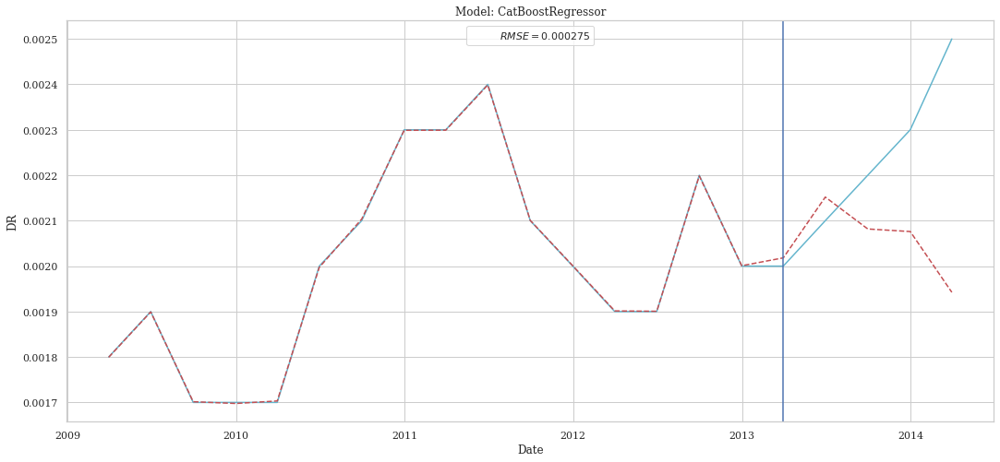

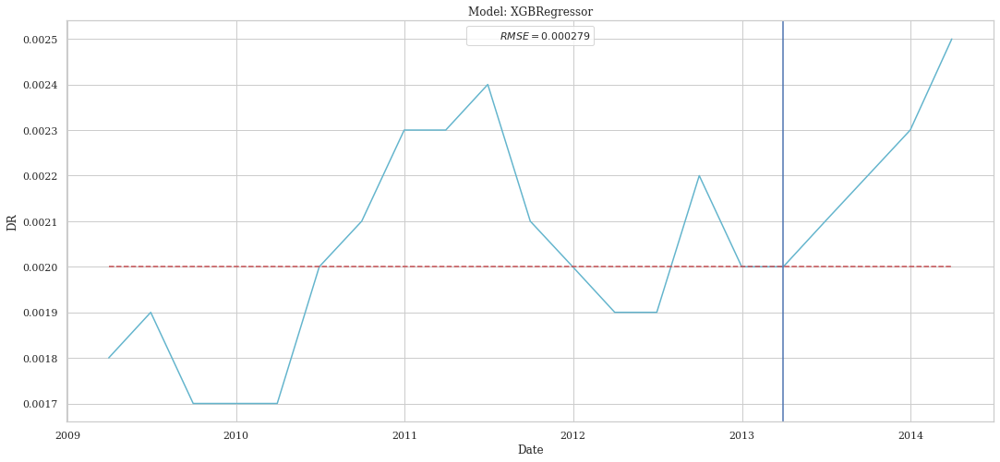

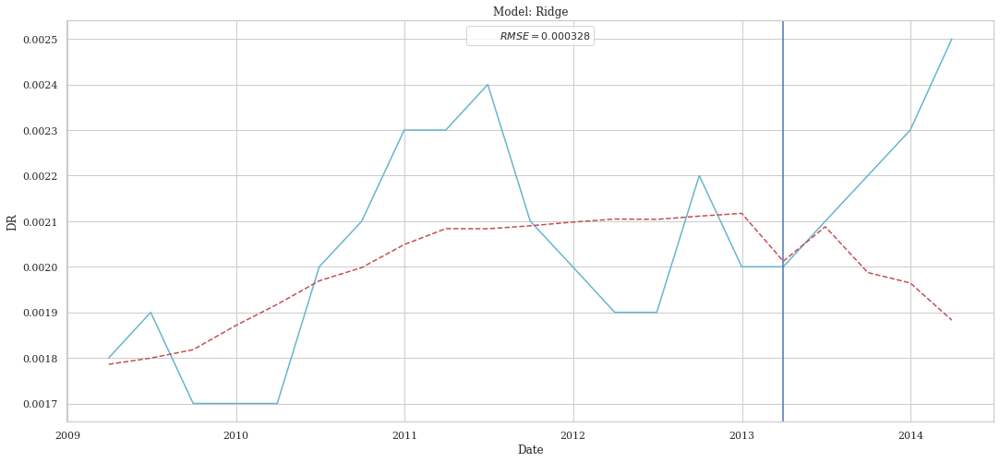

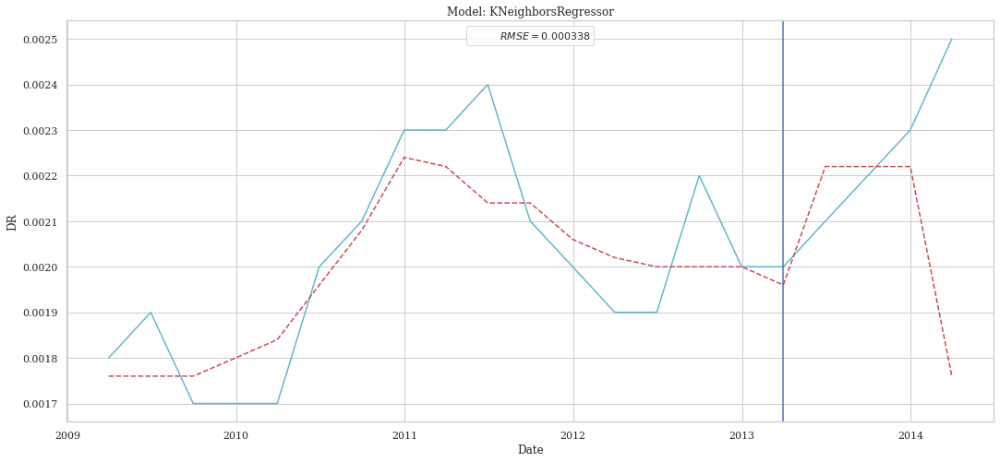

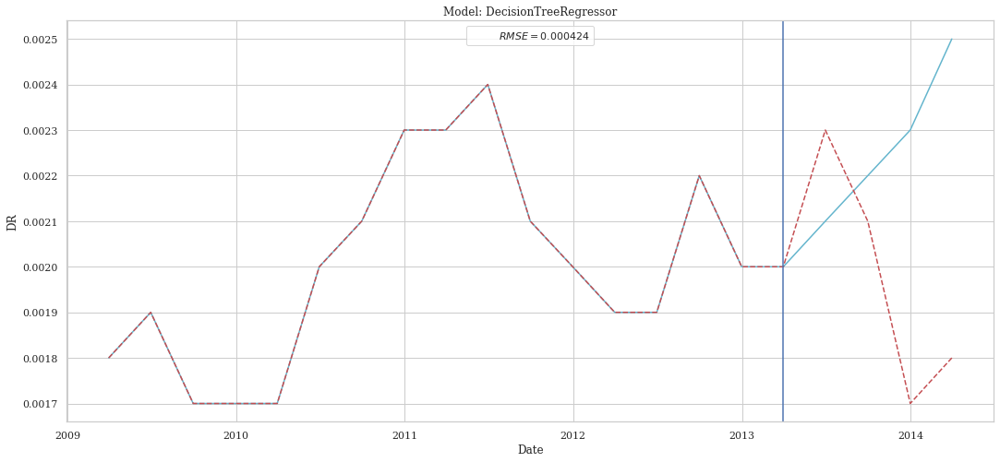

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


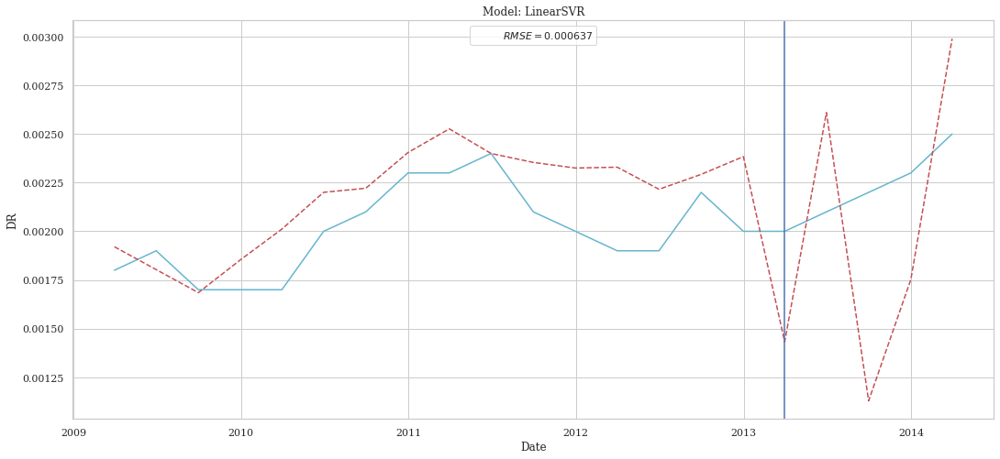

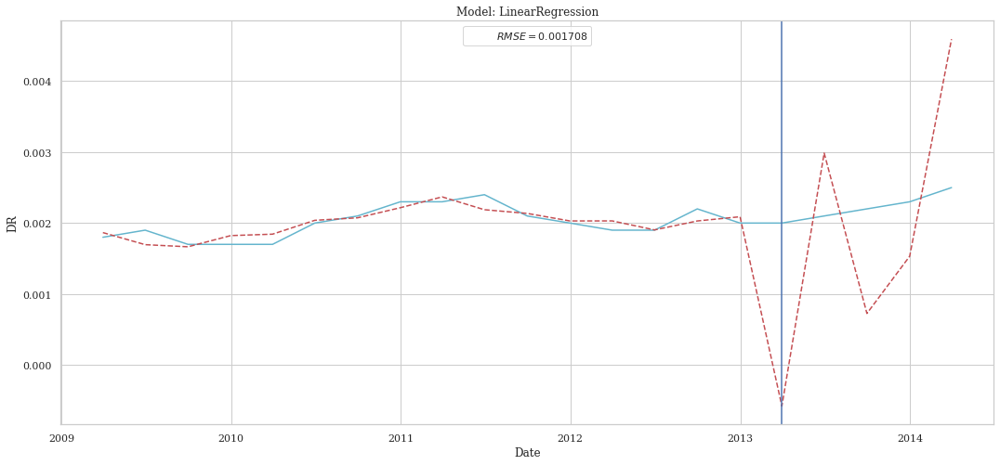

In [70]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [71]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

,rmse,mse,mae,r2
Index,,,,
Ridge,0.000254,6.454331e-08,0.000223,-1.180517
LinearRegression,0.000260,6.770603e-08,0.000248,-1.287366
KNeighborsRegressor,0.000267,7.112000e-08,0.000212,-1.402703
CatBoostRegressor,0.000275,7.545484e-08,0.000225,-1.549150
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
DecisionTreeRegressor,0.000290,8.400000e-08,0.000200,-1.837838
LinearSVR,0.000521,2.717090e-07,0.000435,-8.179358


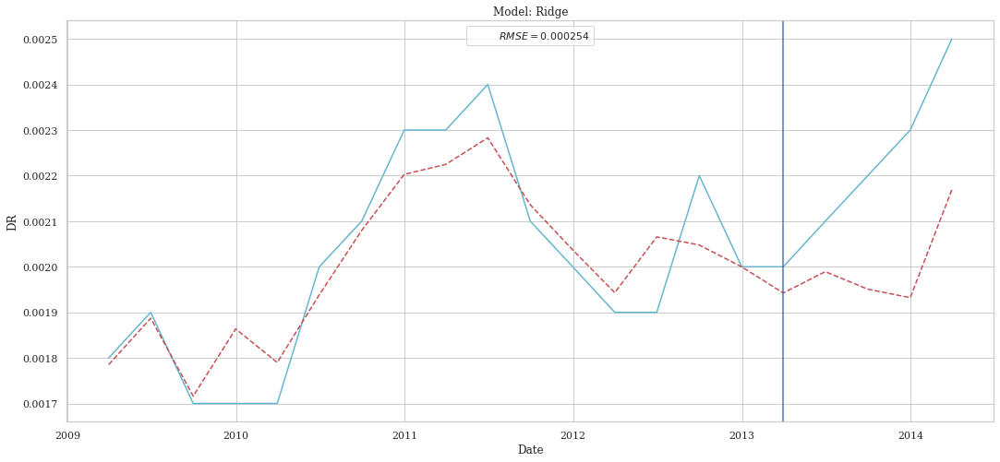

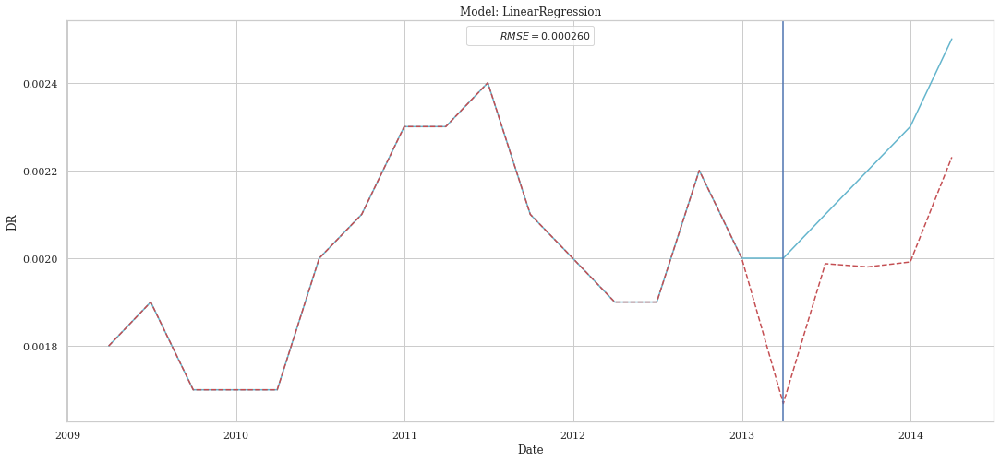

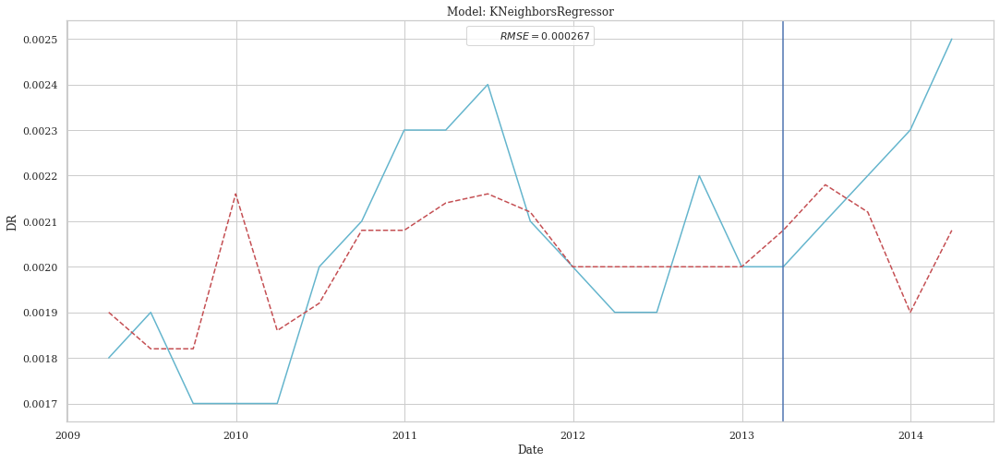

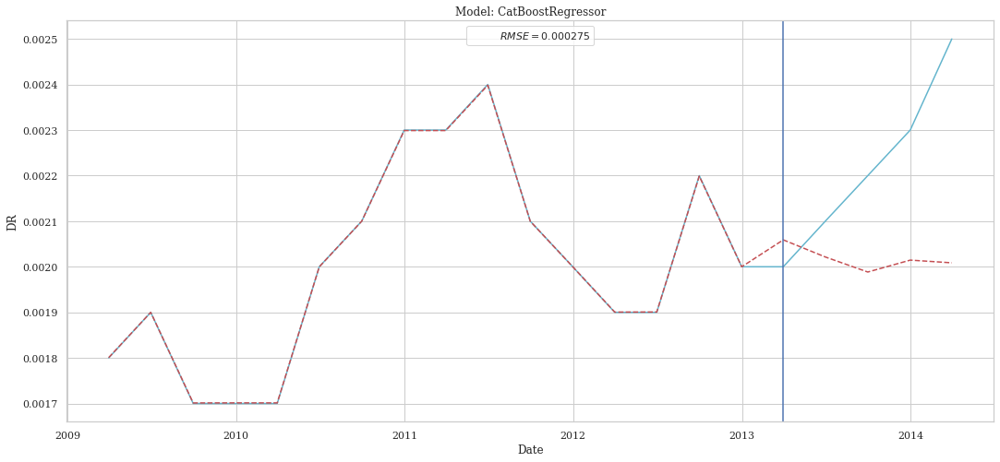

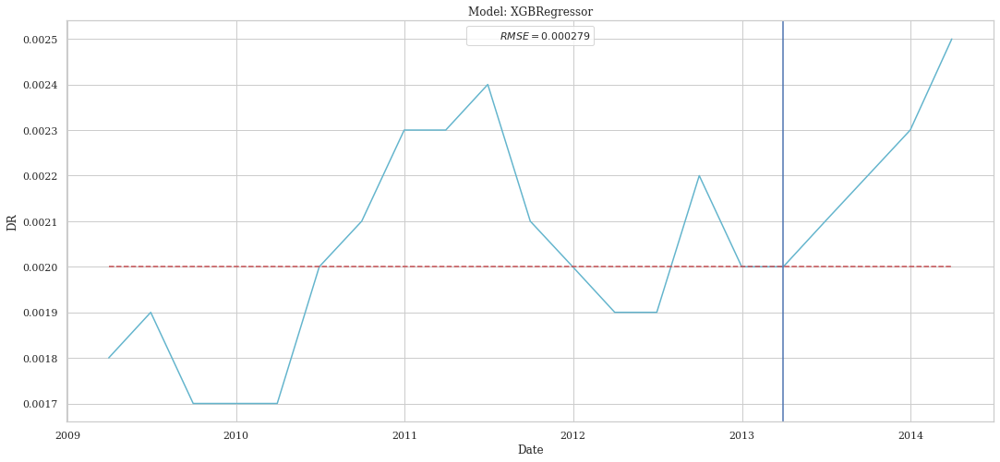

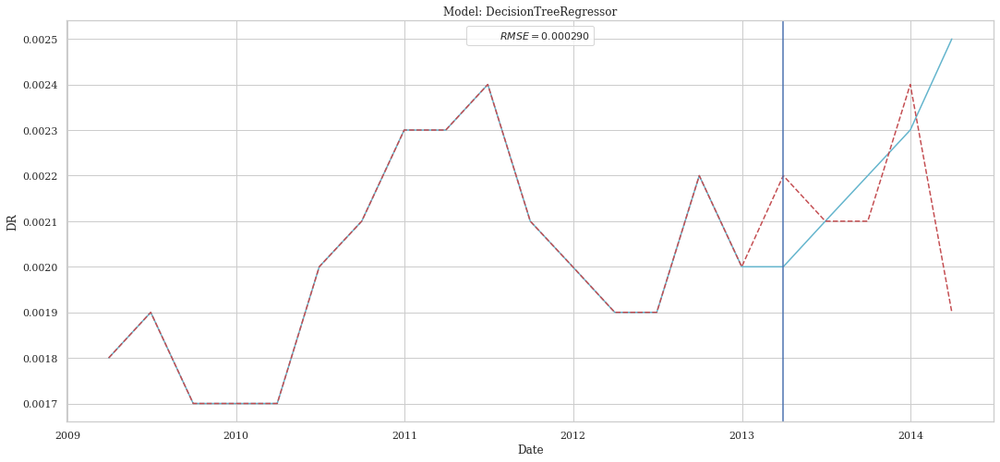

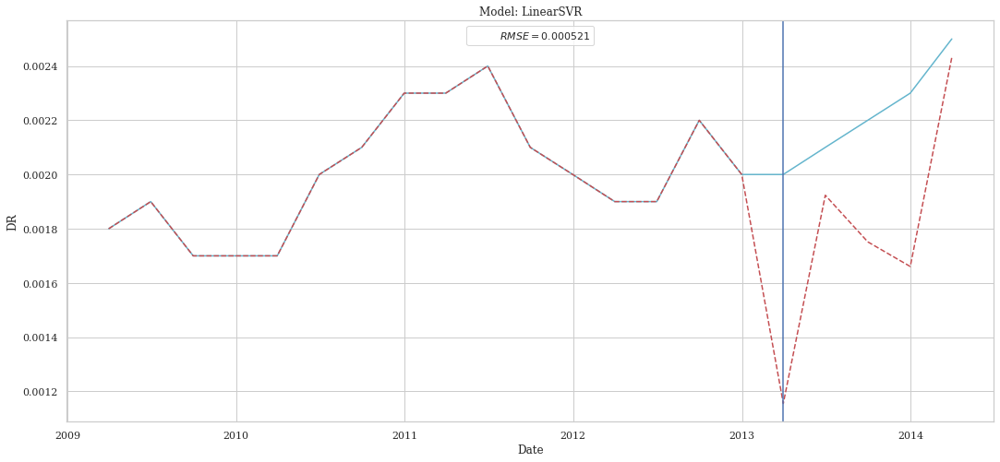

In [72]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### KBest Features

In [73]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
Ridge,0.000227,5.140751e-08,0.000179,-0.736740
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
CatBoostRegressor,0.000284,8.064894e-08,0.000221,-1.724626
KNeighborsRegressor,0.000336,1.127200e-07,0.000236,-2.808108
DecisionTreeRegressor,0.000361,1.300000e-07,0.000300,-3.391892
LinearSVR,0.000786,6.181968e-07,0.000654,-19.885027
LinearRegression,0.000926,8.579616e-07,0.000796,-27.985190


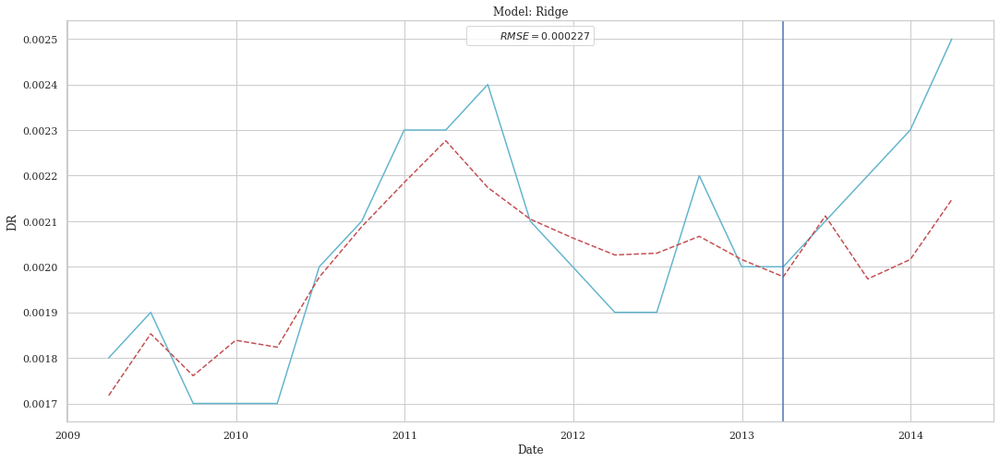

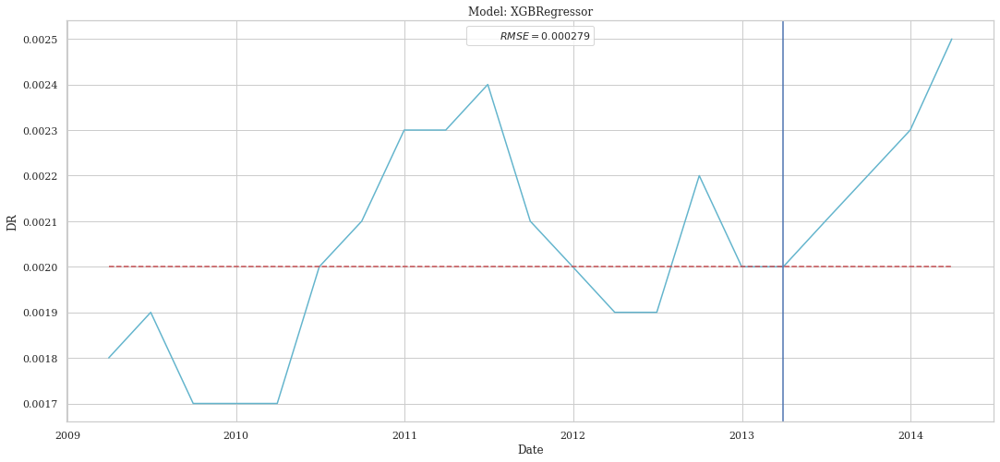

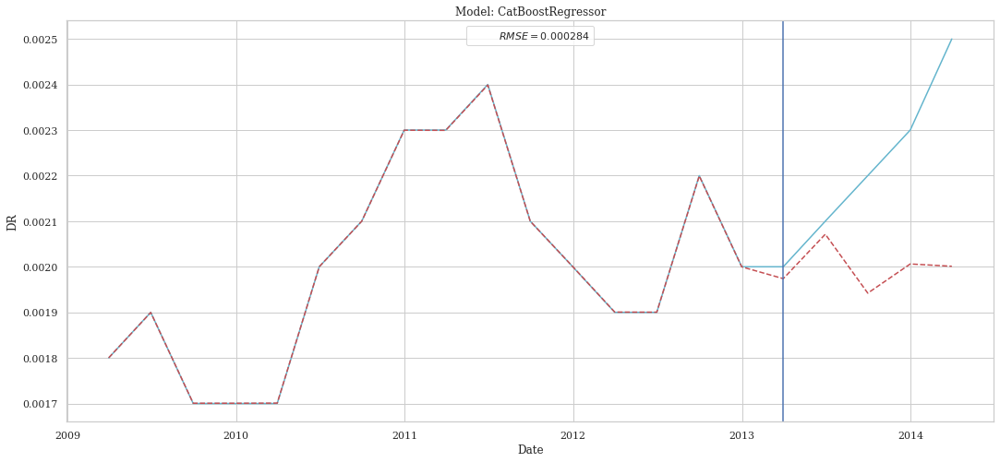

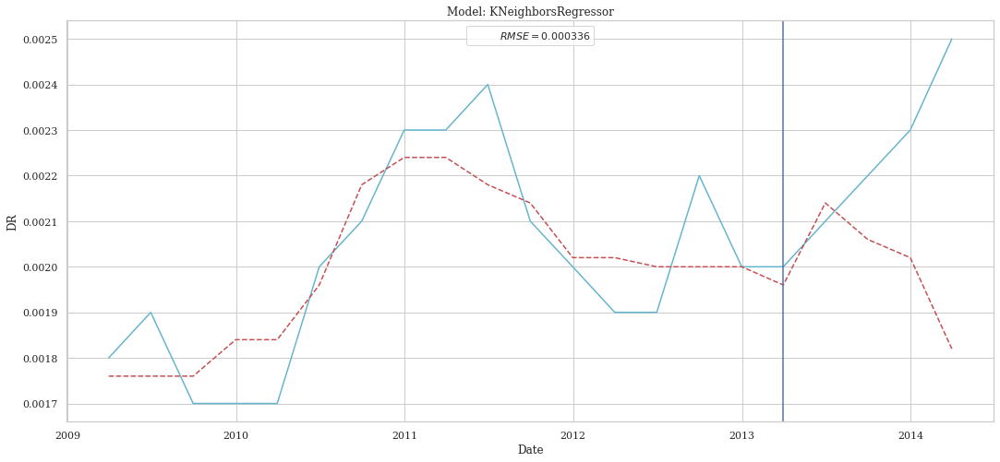

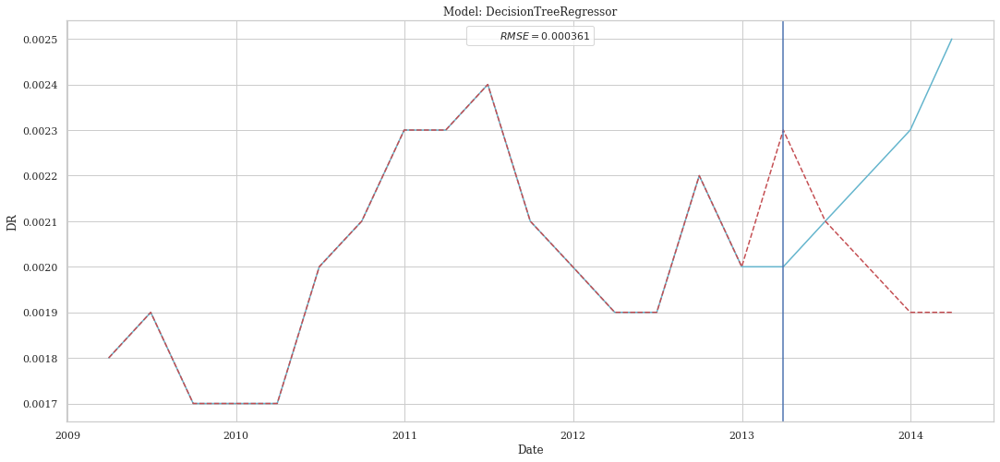

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


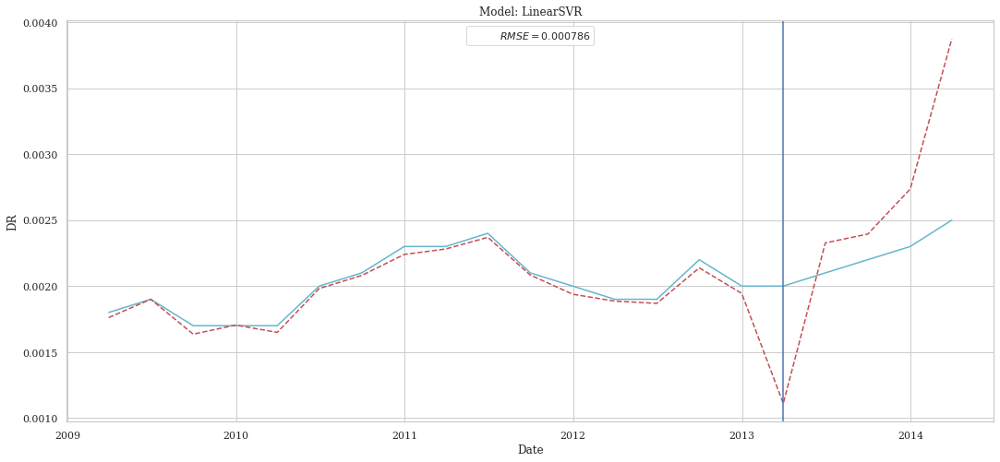

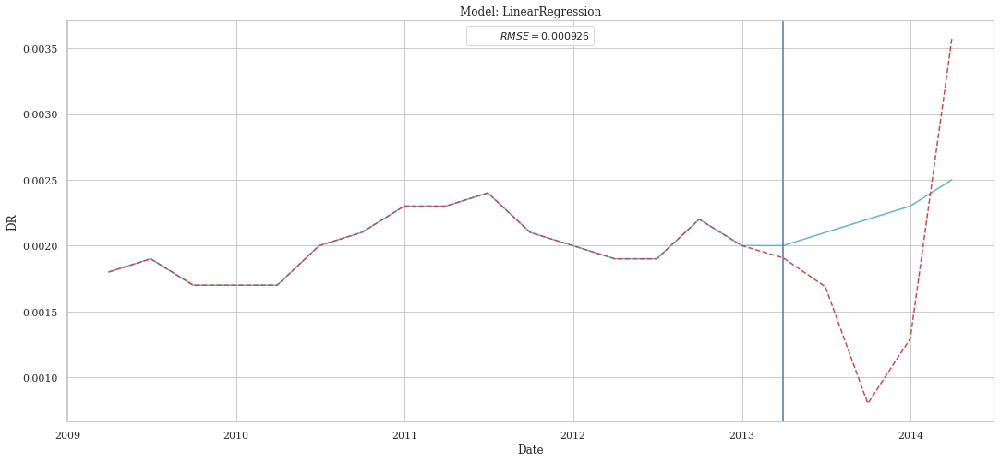

In [74]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Recursive Features

In [75]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
CatBoostRegressor,0.000282,7.979791e-08,0.000222,-1.695875
KNeighborsRegressor,0.000312,9.712000e-08,0.000240,-2.281081
Ridge,0.000322,1.039029e-07,0.000267,-2.510233
LinearRegression,0.000370,1.369229e-07,0.000300,-3.625775
DecisionTreeRegressor,0.000469,2.200000e-07,0.000400,-6.432432
LinearSVR,0.000637,4.056545e-07,0.000577,-12.704544


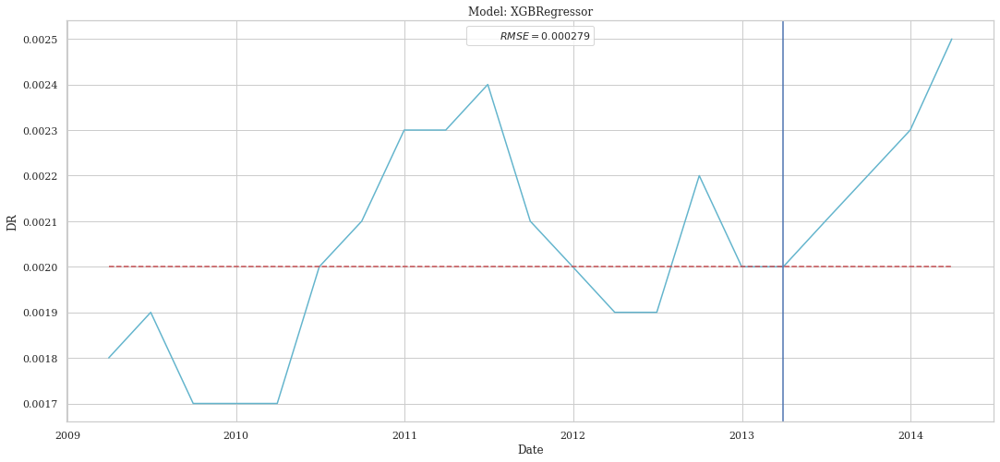

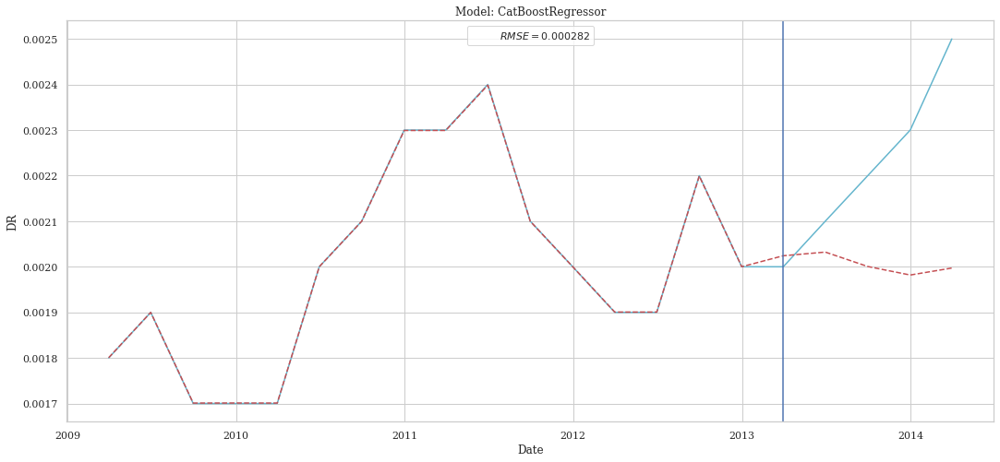

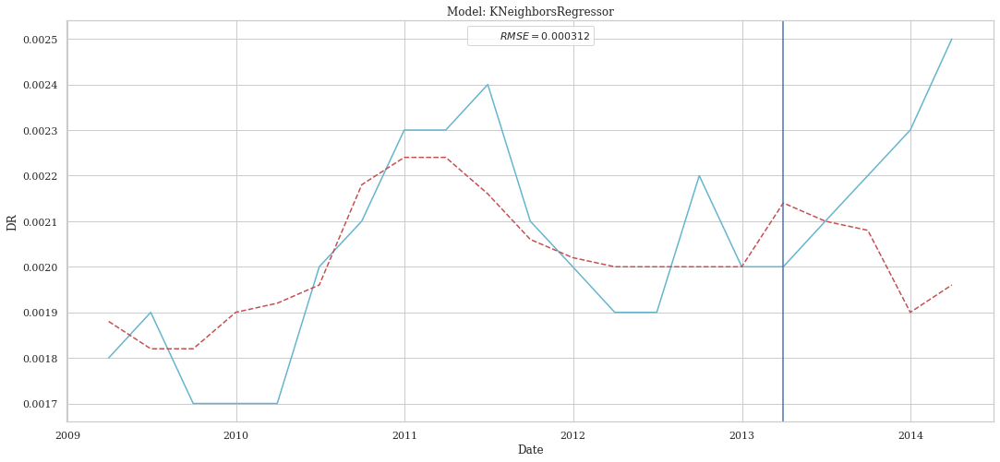

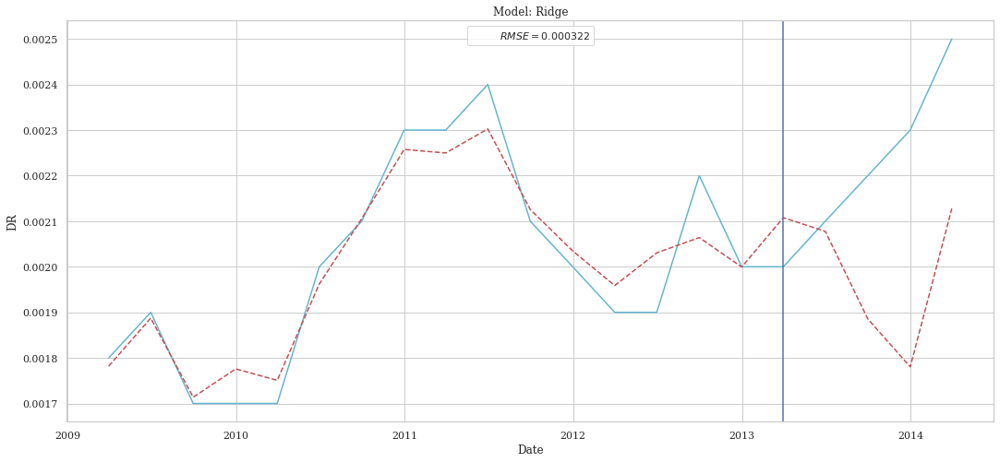

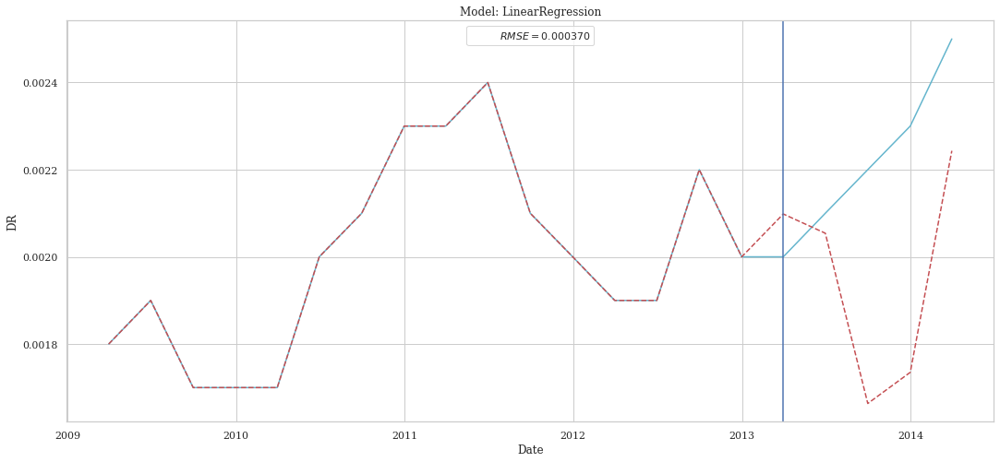

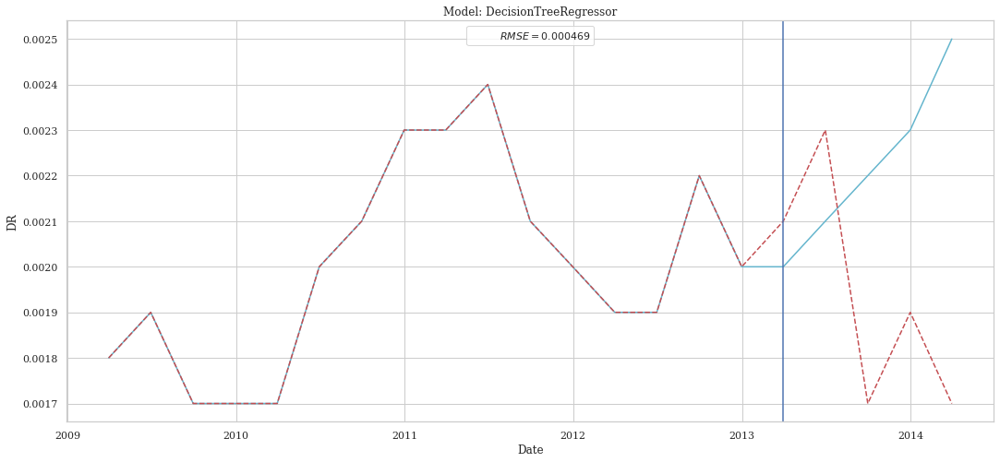

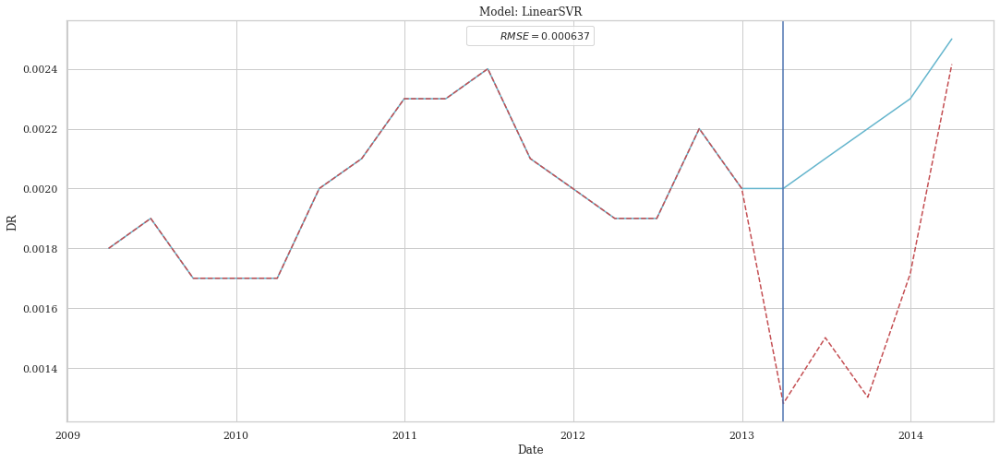

In [76]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [77]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
KNeighborsRegressor,0.000286,8.152000e-08,0.000220,-1.754054
CatBoostRegressor,0.000299,8.969953e-08,0.000246,-2.030389
Ridge,0.000315,9.897729e-08,0.000249,-2.343827
DecisionTreeRegressor,0.000395,1.560000e-07,0.000360,-4.270270
LinearRegression,0.000679,4.612122e-07,0.000595,-14.581493
LinearSVR,0.001008,1.016368e-06,0.000921,-33.336765


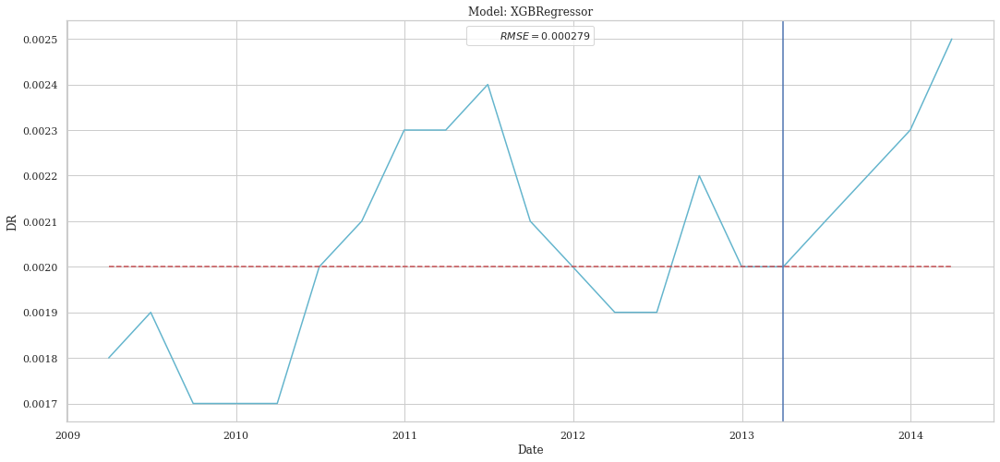

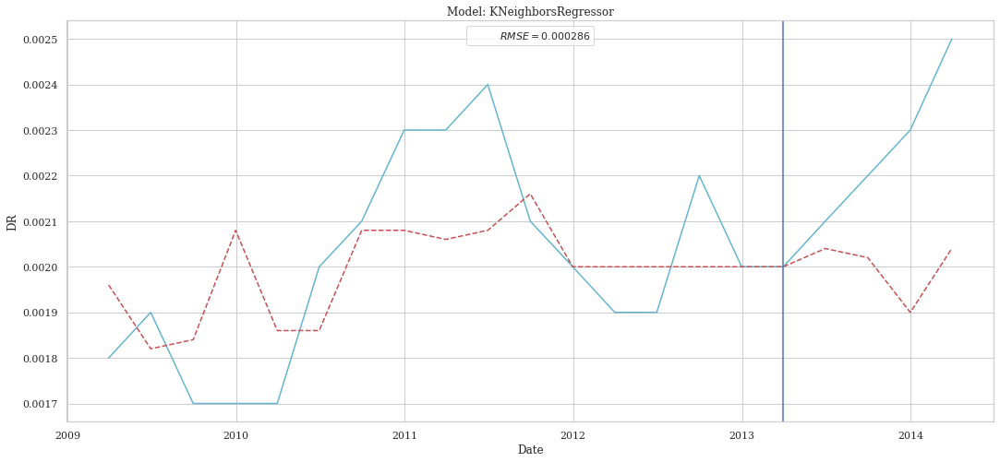

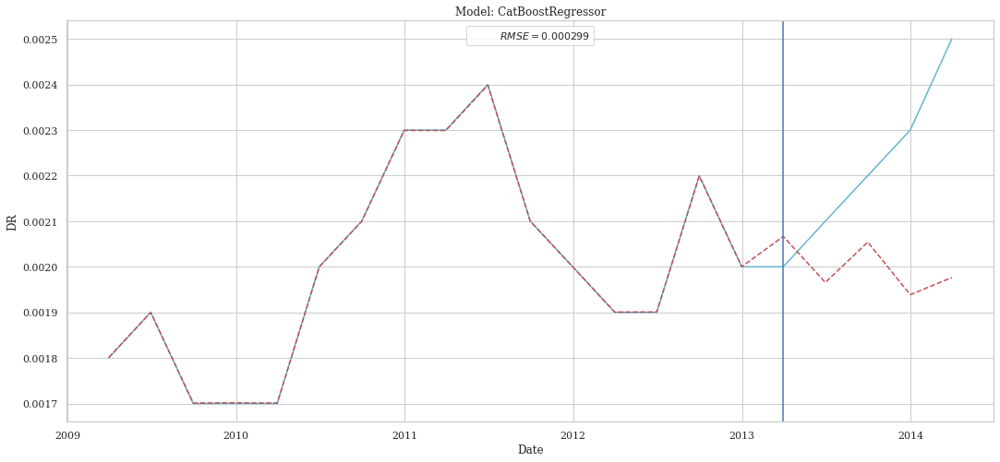

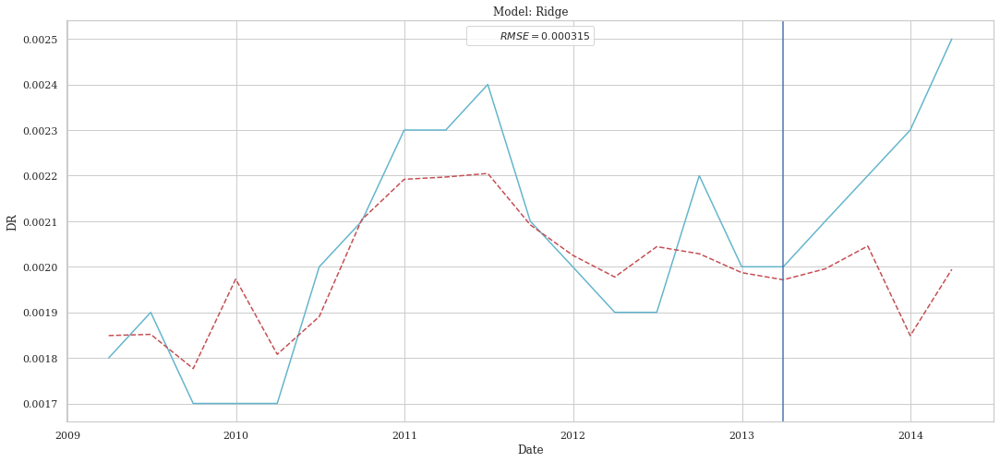

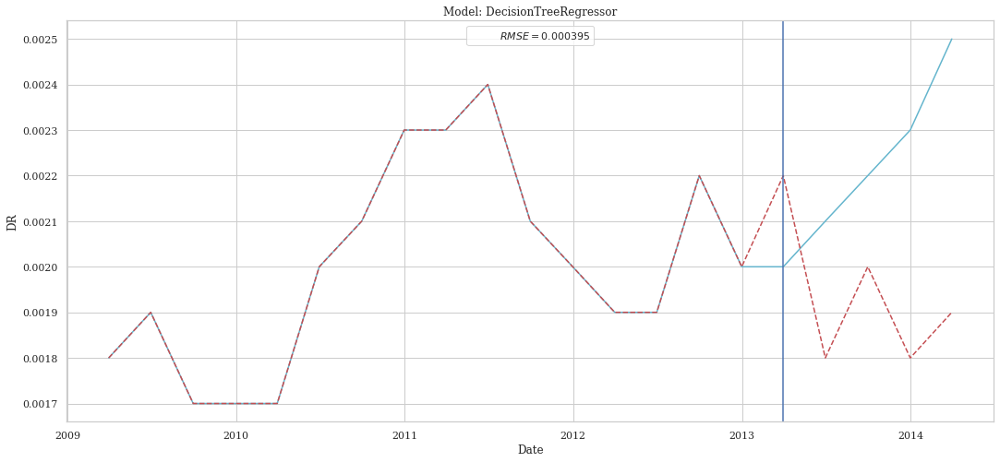

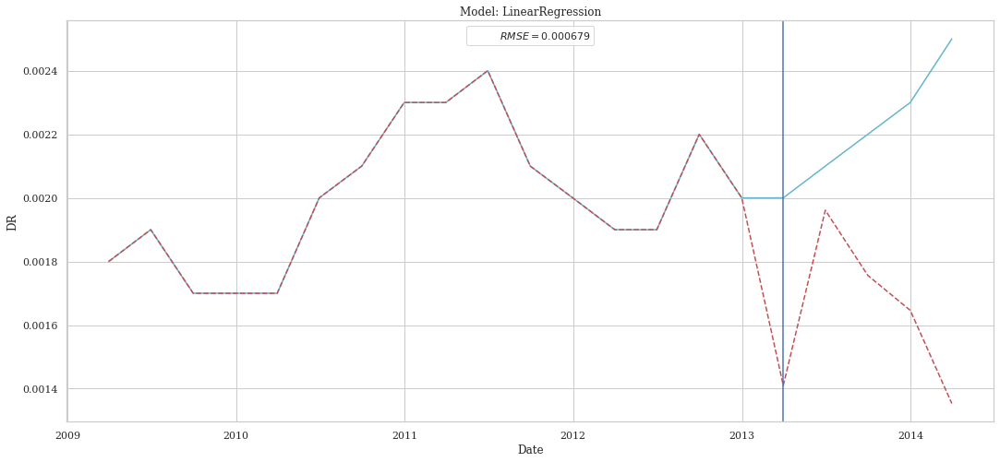

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


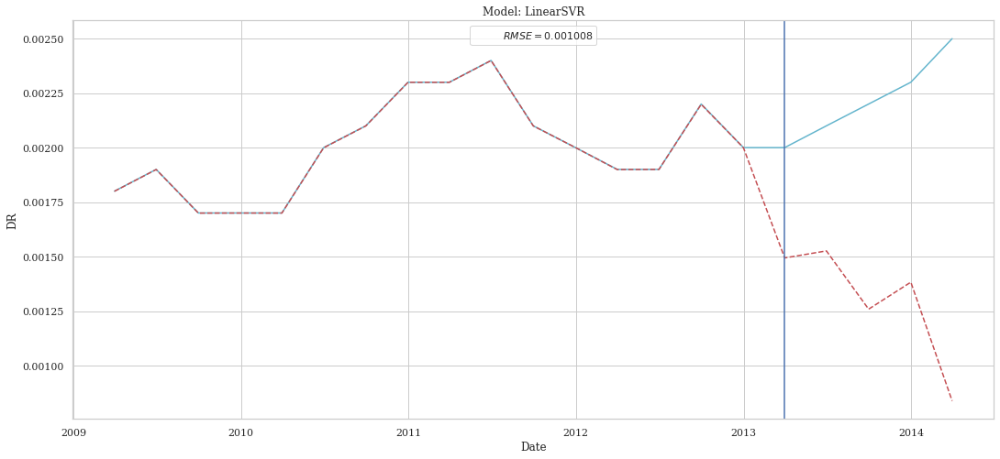

In [78]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [79]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
DecisionTreeRegressor,0.000316,1.000000e-07,0.000240,-2.378378
CatBoostRegressor,0.000359,1.285572e-07,0.000278,-3.343148
Ridge,0.000384,1.474771e-07,0.000320,-3.982333
KNeighborsRegressor,0.000408,1.661600e-07,0.000292,-4.613514
LinearSVR,0.001037,1.075752e-06,0.000856,-35.342979
LinearRegression,0.012961,1.679939e-04,0.011704,-5674.468145


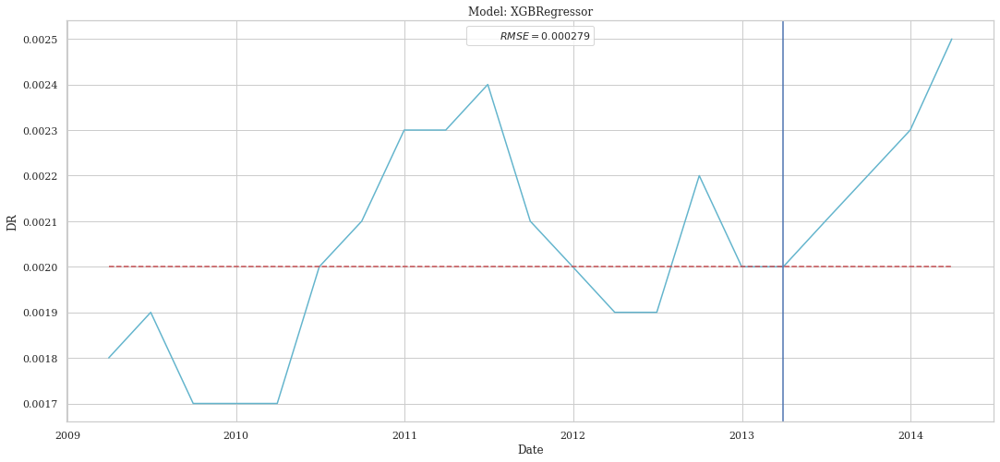

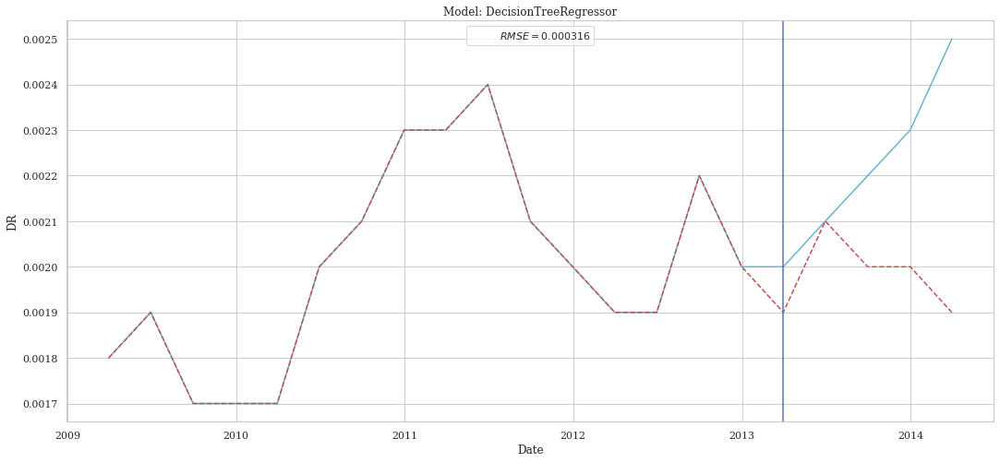

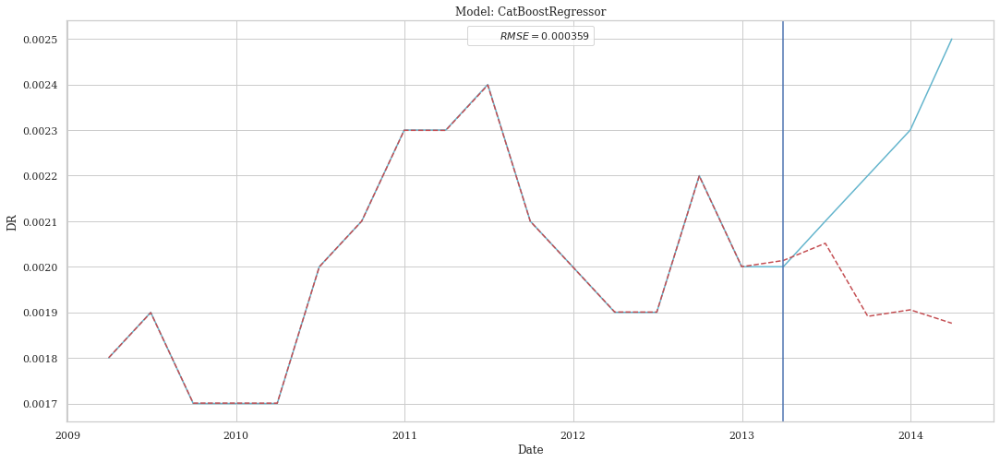

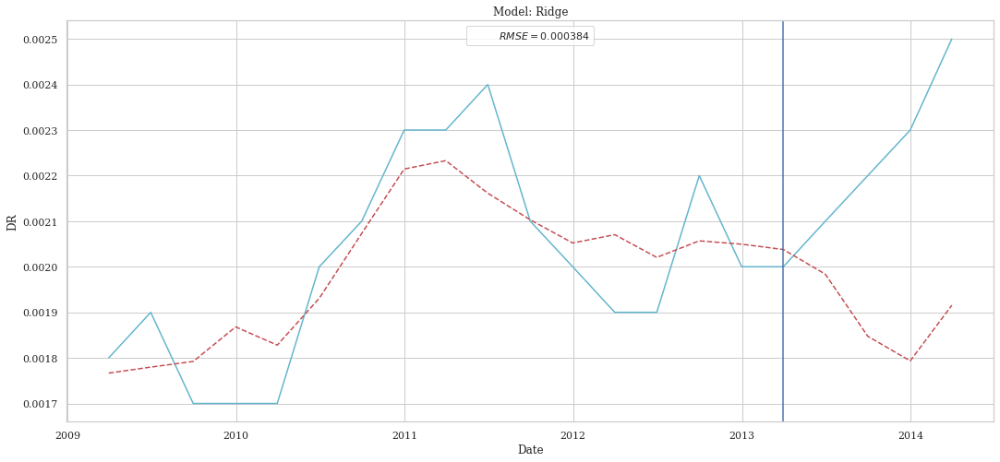

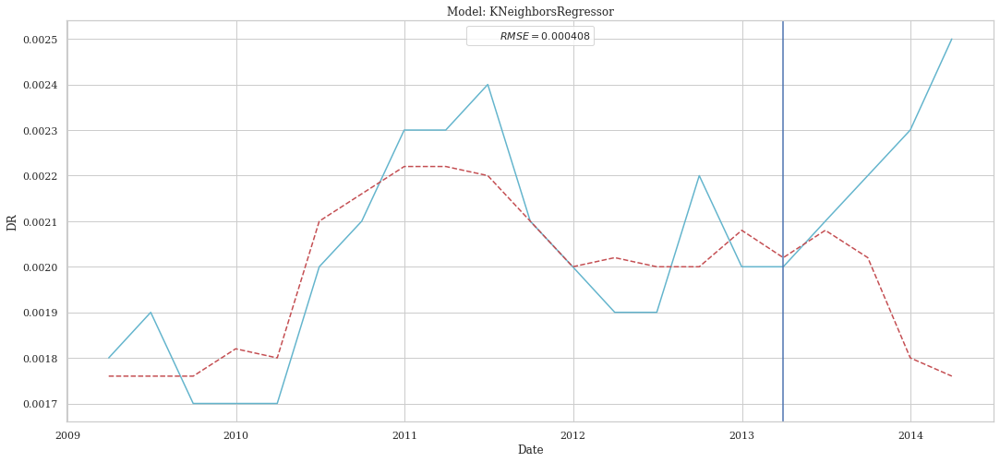

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


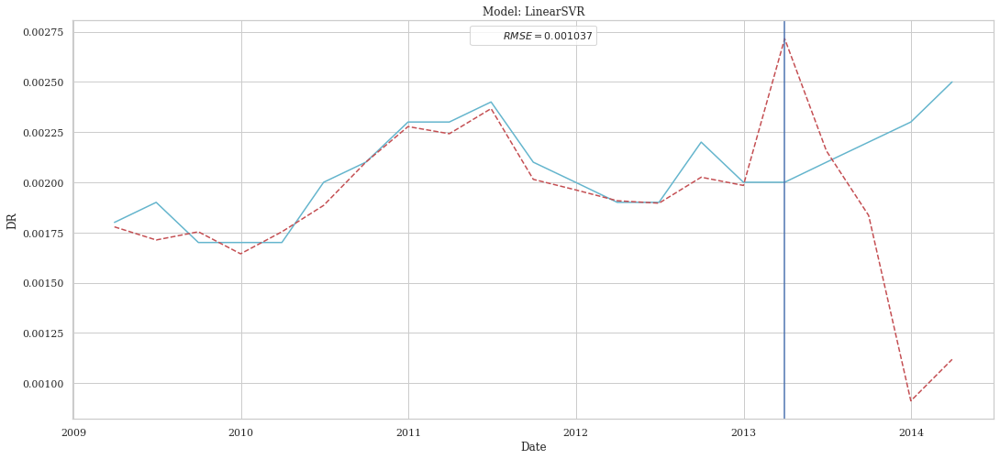

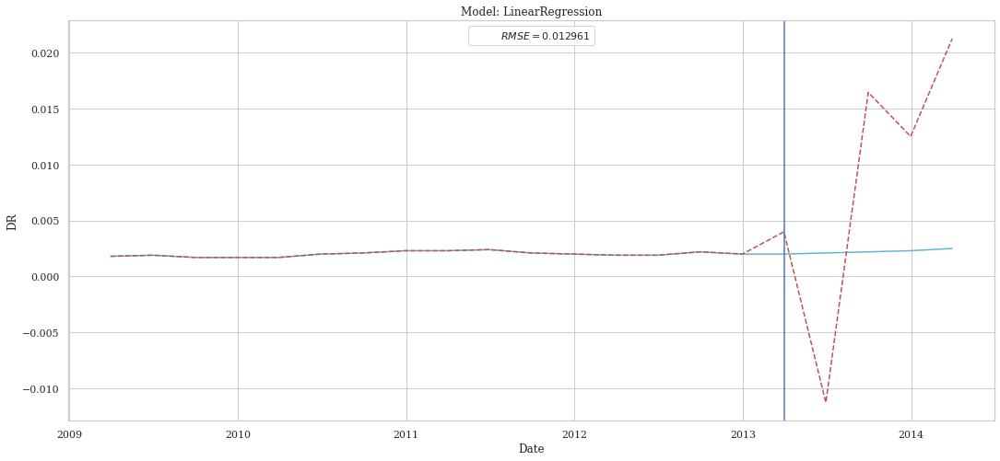

In [80]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [81]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.000236,5.576000e-08,0.000188,-0.883784
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
CatBoostRegressor,0.000282,7.963028e-08,0.000221,-1.690212
Ridge,0.000283,8.001817e-08,0.000256,-1.703316
DecisionTreeRegressor,0.000316,1.000000e-07,0.000240,-2.378378
LinearSVR,0.000459,2.104440e-07,0.000422,-6.109594
LinearRegression,0.000544,2.956396e-07,0.000452,-8.987825


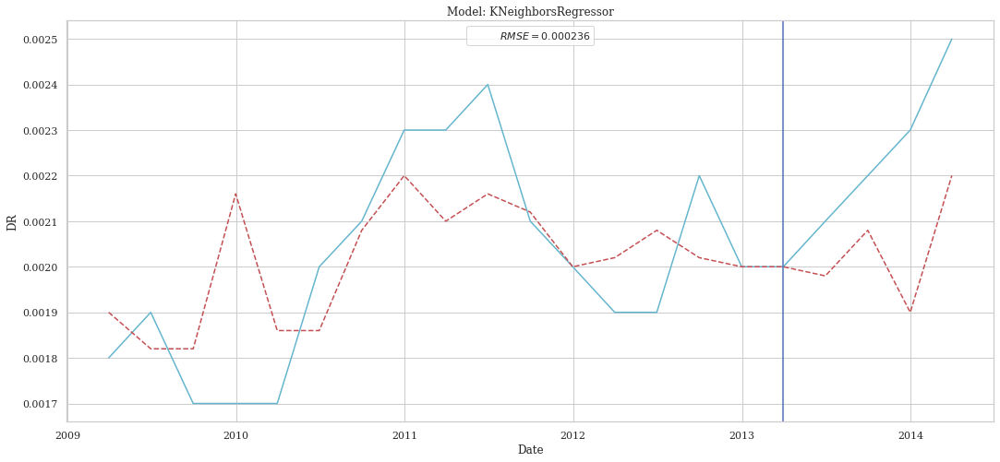

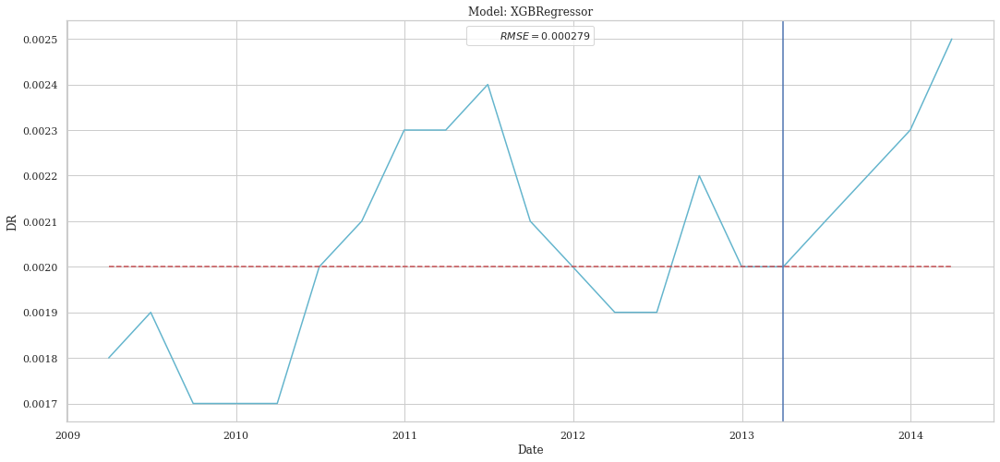

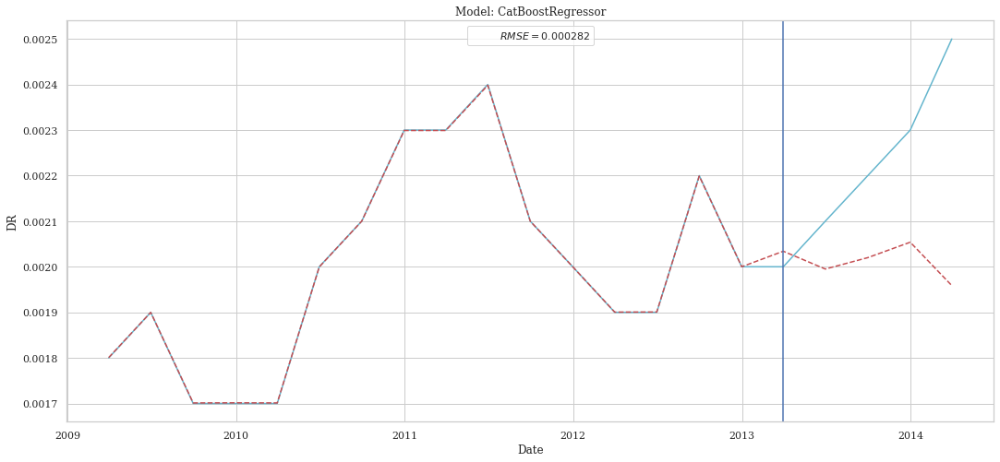

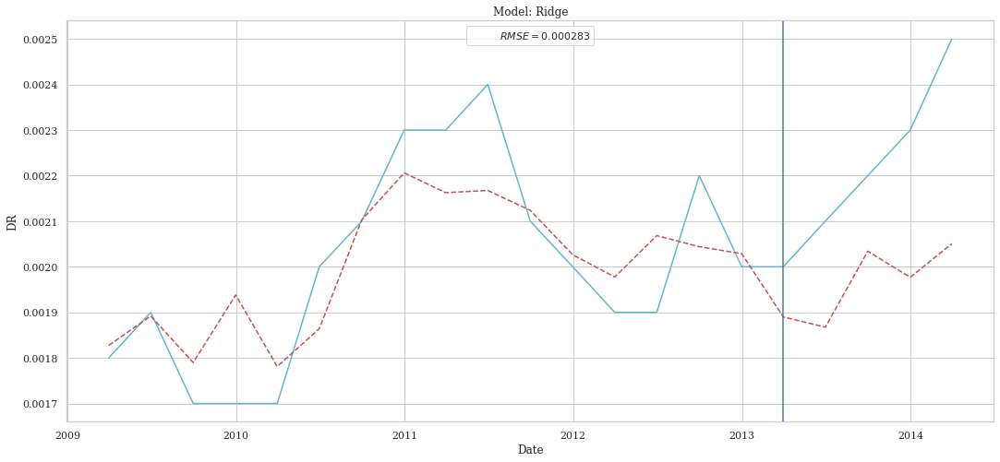

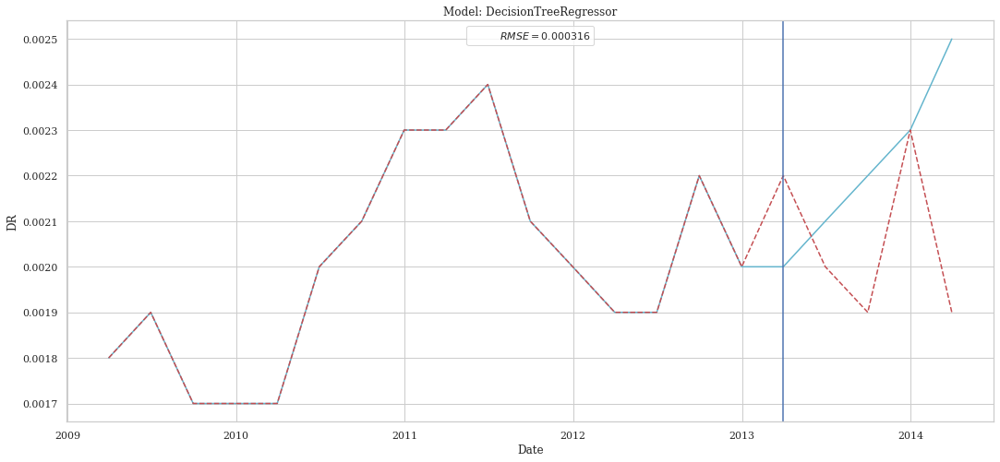

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


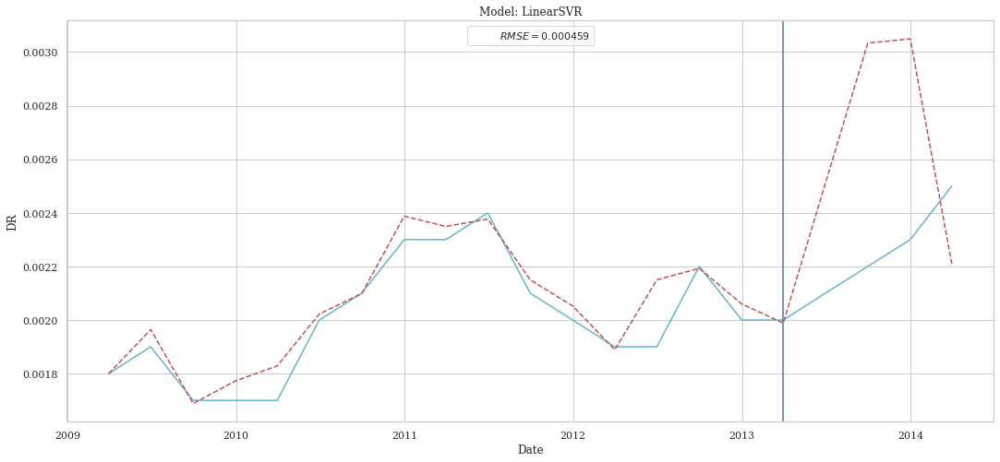

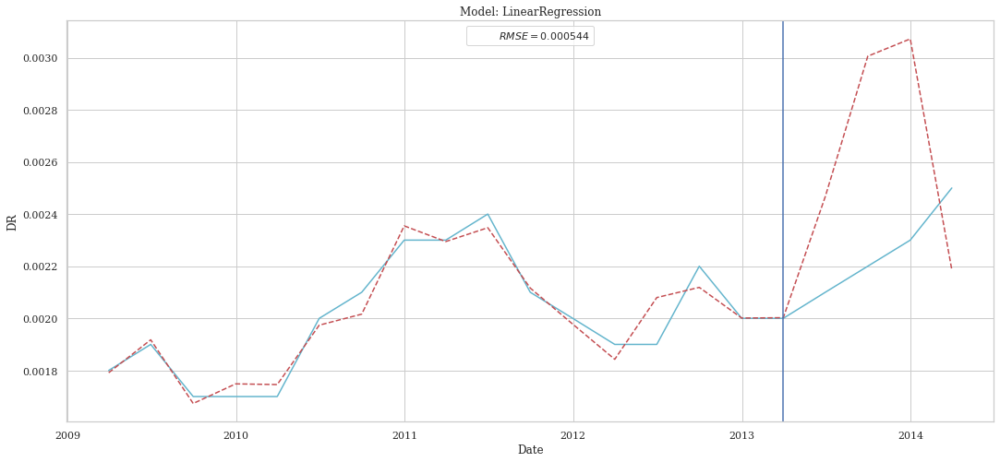

In [82]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [83]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
Ridge,0.000212,4.493369e-08,0.000183,-0.518030
KNeighborsRegressor,0.000223,4.976000e-08,0.000176,-0.681081
CatBoostRegressor,0.000263,6.927450e-08,0.000207,-1.340355
XGBRegressor,0.000279,7.799986e-08,0.000220,-1.635130
DecisionTreeRegressor,0.000286,8.200000e-08,0.000180,-1.770270
LinearSVR,0.000562,3.163162e-07,0.000428,-9.686357
LinearRegression,0.000567,3.213381e-07,0.000386,-9.856017


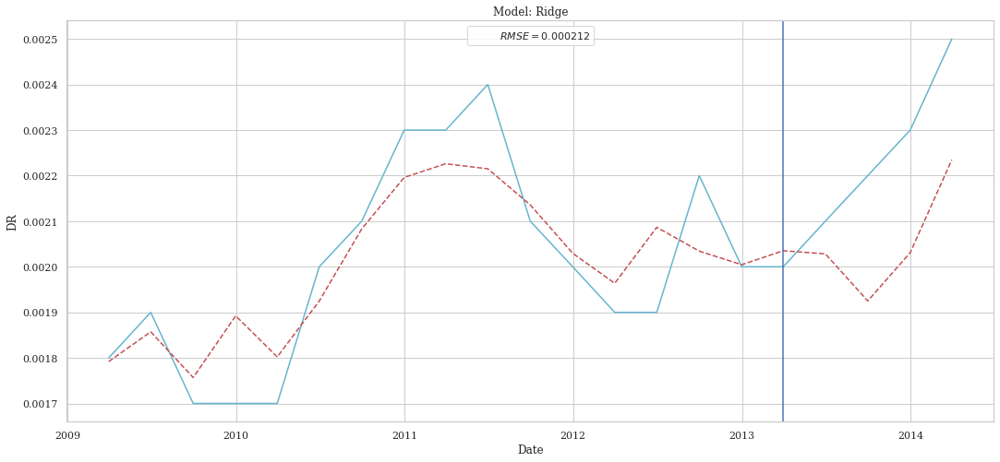

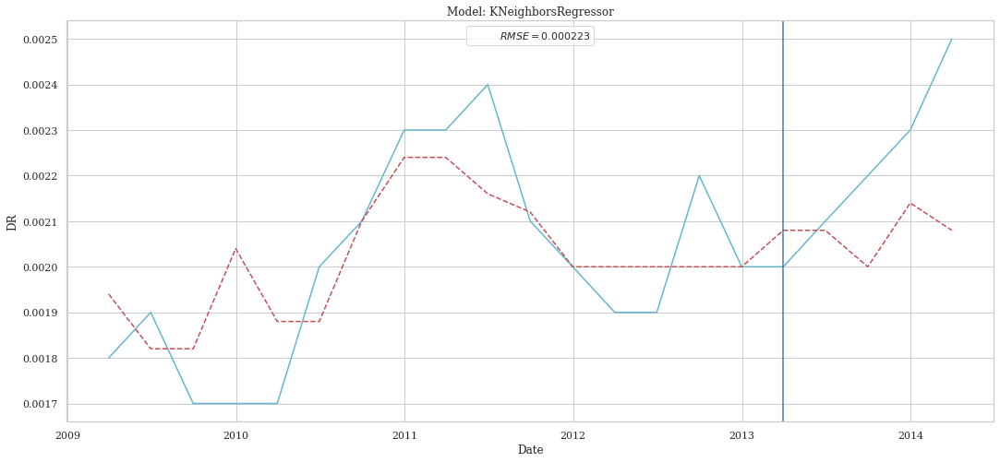

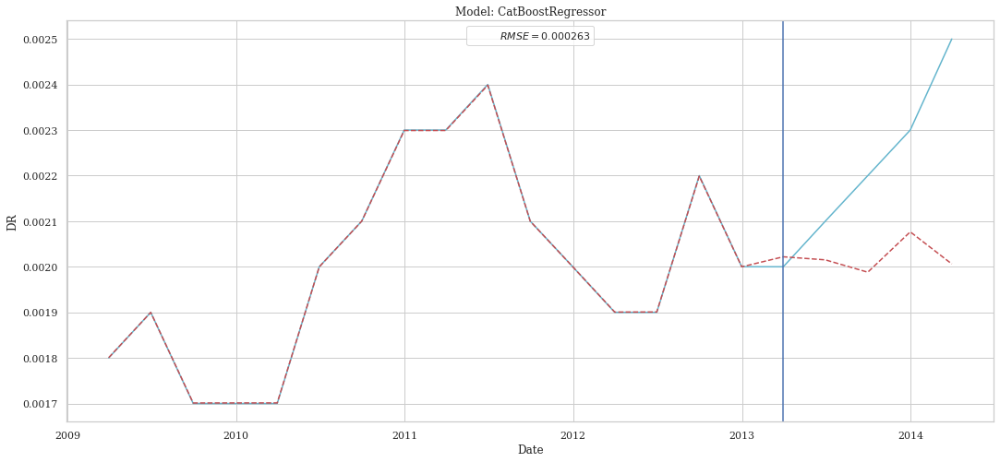

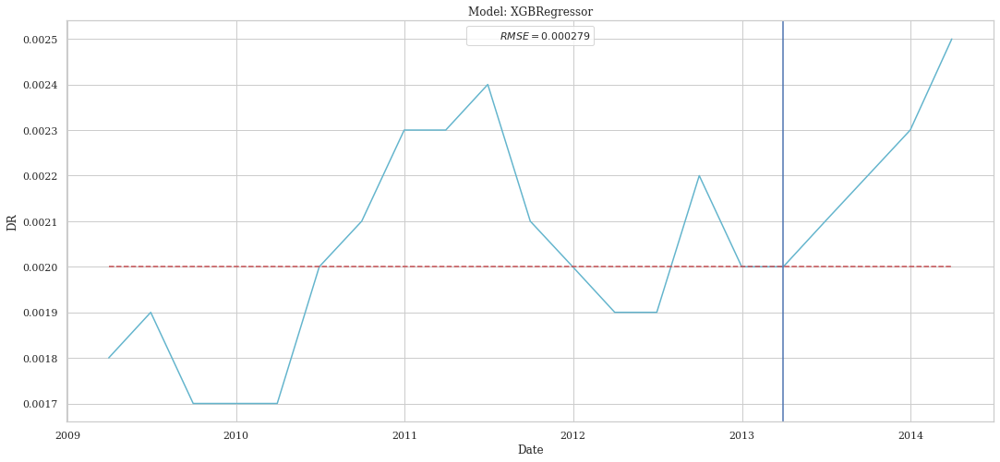

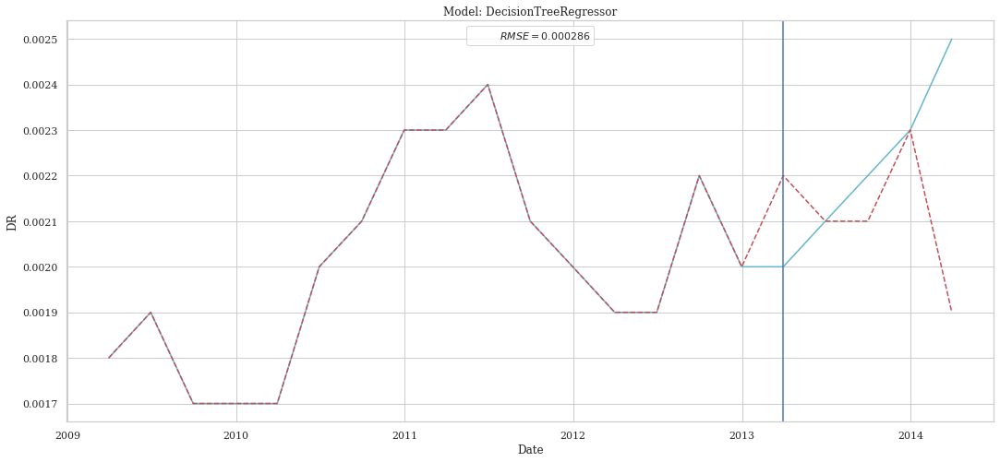

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


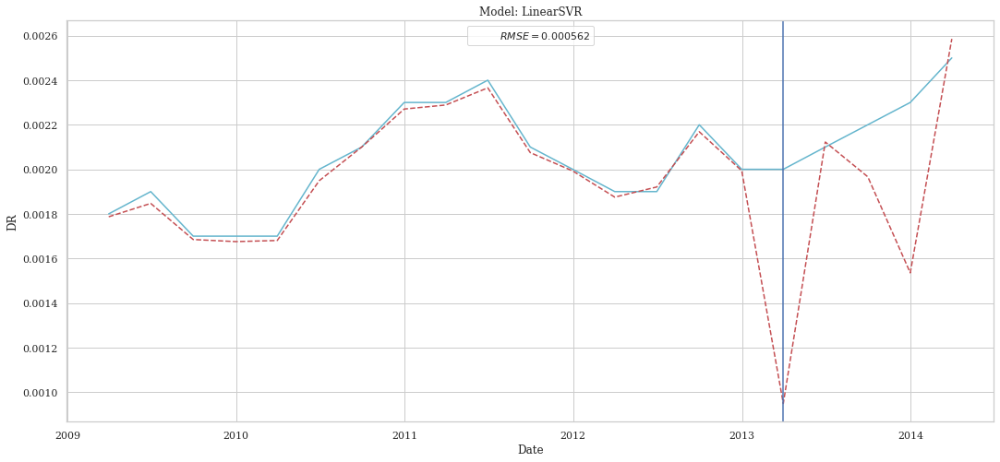

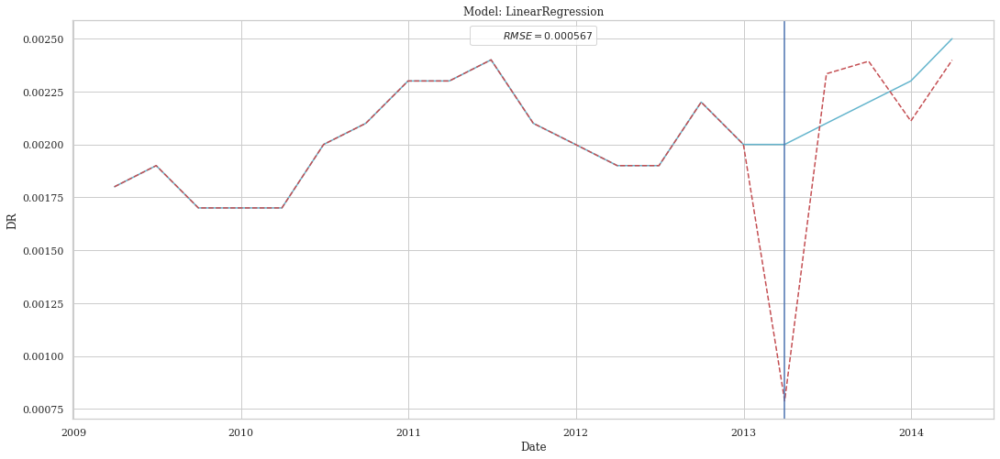

In [84]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

## First Conclusion
Given a first point of view we see that the xgboost and catboost are the best models to predict CHR2. We generally have a rmse equals to 0.000184 for the xgboost with a r2 positive but very low (all the r2 are negative, that show that the model doesn't follow the trend of y_test). One exception is observed for the KNeighborsRegressor with recursive features were we have a r2 of 0.73 and a rmse equals to 0.0.000096 (best result). We decided to apply a grid search on xgboost, catboostregressor and kneighborsregressor to find if a better parameter is possible

### GridSearch on KNeighborsRegressor

In [85]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=b"CHR2",col_used=cl.col_2_recur,split=split,norm=norm)
params_knr = {"n_neighbors":[5,6,7,8,9,10],"weights":["uniform"],"algorithm":["auto","ball_tree","kd_tree","brute"],"p":[1,2],"leaf_size":[5,10,20,30,40,50]}
params,score = params_grid(X_train,y_train,X_test,y_test,"knn",params_knr)
print(params,score)

Fitting 2 folds for each of 288 candidates, totalling 576 fits


/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/Users/simonev

{'algorithm': 'auto', 'leaf_size': 5, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'} 0.0003116408188925193


/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/Users/simonev

In [86]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["knn"],parameters={"p_knn":params})
summary

,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.000312,9.712000e-08,0.00024,-2.281081


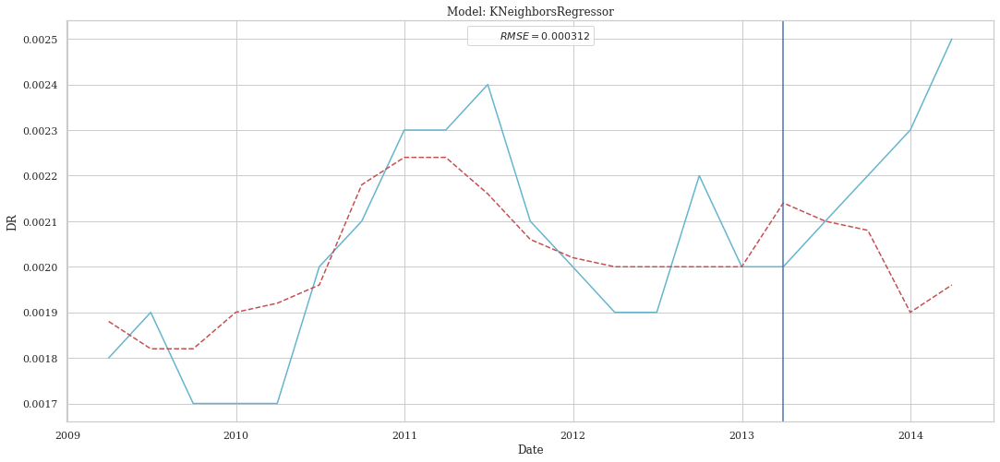

In [87]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_knn":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_knn":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[0],df_score=summary)

### GridSearch on XGBoost

In [88]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=b"CHR2",col_used=cl.col_2_kbest,split=split,norm=norm)
params_xgb = {"booster":["gbtree"],"eta":[0.1*i for i in range(1,11)],"gamma":[5*i for i in range(5)],"max_depth":[i for i in range(3,11)],"num_parallel_tree":[1,2,3,4,5],"verbose":[0]}
params,score = params_grid(X_train,y_train,X_test,y_test,"xgb",params_xgb)
print(params,score)

Fitting 2 folds for each of 2000 candidates, totalling 4000 fits
[23:54:53] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[23:54:53] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[23:54:53] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[23:54:54] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[23:54:54] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[23:54:54] WARNING: /Users/run

In [89]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["xgb"],parameters={"p_xgb":params})
summary

[00:02:15] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.



,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.000279,7.799975e-08,0.00022,-1.635127


[00:02:15] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[00:02:15] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-10.9-x86_64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.



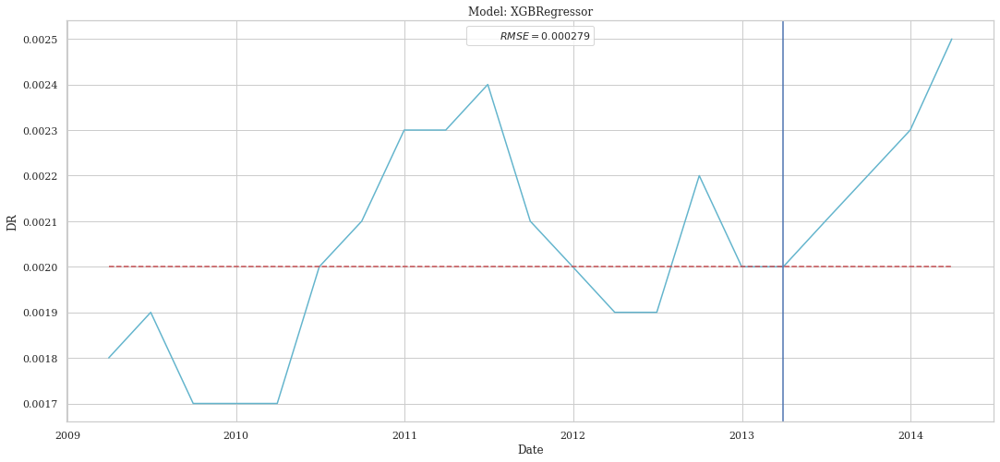

In [90]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_xgb":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_xgb":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[0],df_score=summary)

### GridSearch on CatBoost

In [91]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=b"CHR2",col_used=cl.col_2_recur,split=split,norm=norm)
params_cat = {'depth': [i for i in range(1,7)],'learning_rate':[0.01*i for i in range(25,60)],'iterations':[10*i for i in range(15,30)],"verbose":[0]}
params,score = params_grid(X_train,y_train,X_test,y_test,"cat",params_cat)
print(params,score)

Fitting 2 folds for each of 3150 candidates, totalling 6300 fits
{'depth': 6, 'iterations': 250, 'learning_rate': 0.48, 'verbose': 0} 0.00029216446490170196


In [92]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["cat"],parameters={"p_cat":params})
summary

,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.000292,8.536007e-08,0.000236,-1.883786


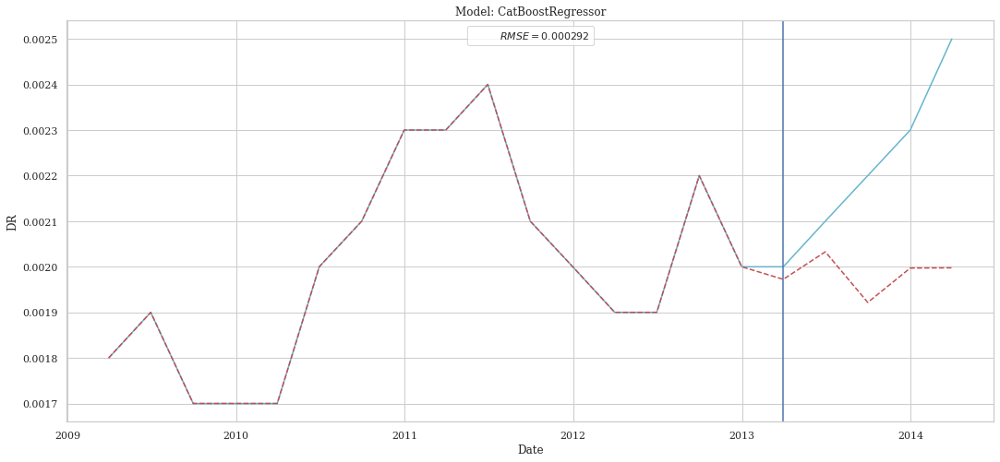

In [93]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_cat":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_cat":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[0],df_score=summary)

## Final Conclusion
Grid Search is relevant for the KNN model but not for the catboost and xgboost model.
With the knn we have now a r2 equals to 0.855.

# Focus on the Chronique CHR8

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

In [94]:
chronique=b'CHR8'
start = 1
norm = "MinMax"
split = 0.2
period=36

### Correlation Features

In [95]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_8_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.010540,0.000111,0.009013,-3.242833
XGBRegressor,0.011334,0.000128,0.011050,-3.905423
KNeighborsRegressor,0.011362,0.000129,0.009660,-3.929797
Ridge,0.011542,0.000133,0.010230,-4.087514
DecisionTreeRegressor,0.012438,0.000155,0.009800,-4.907674
LinearSVR,0.047869,0.002291,0.036530,-86.506681
LinearRegression,0.094996,0.009024,0.082731,-343.628104


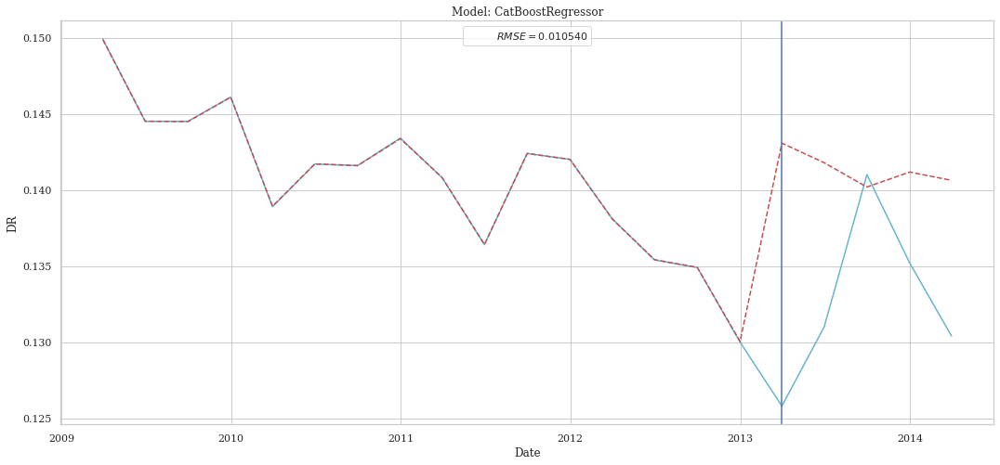

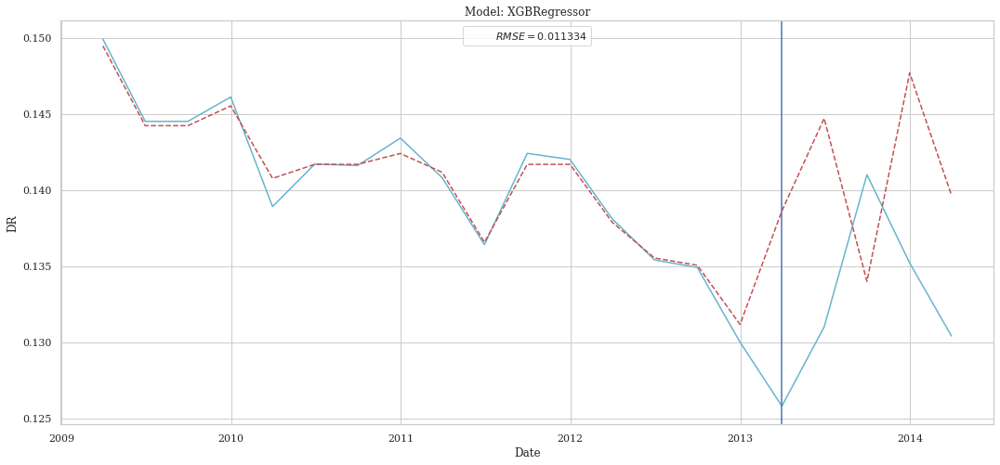

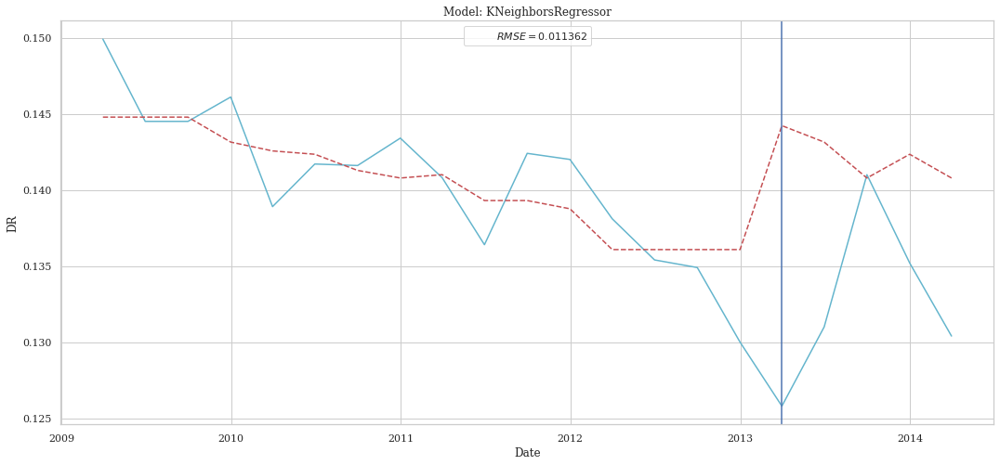

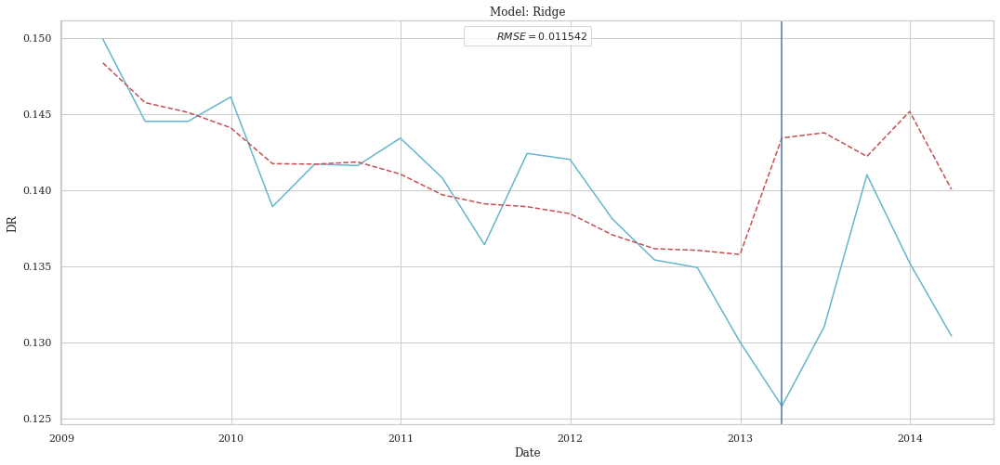

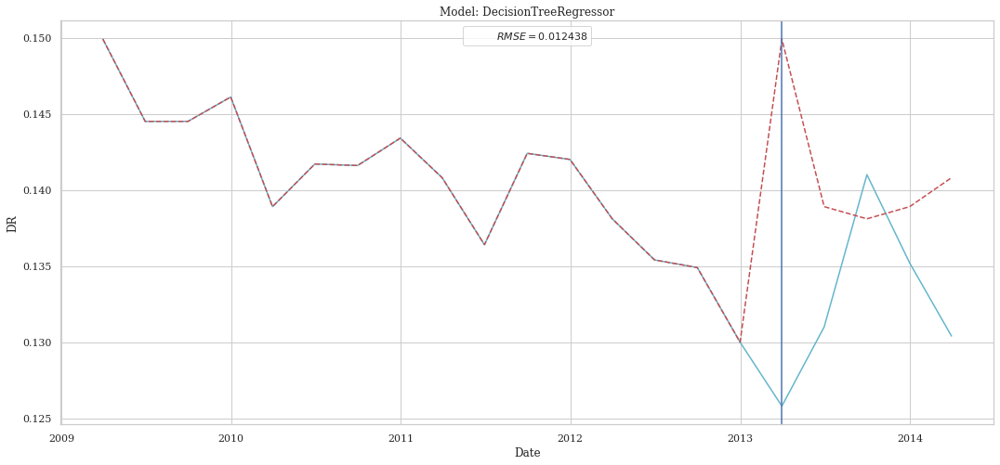

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


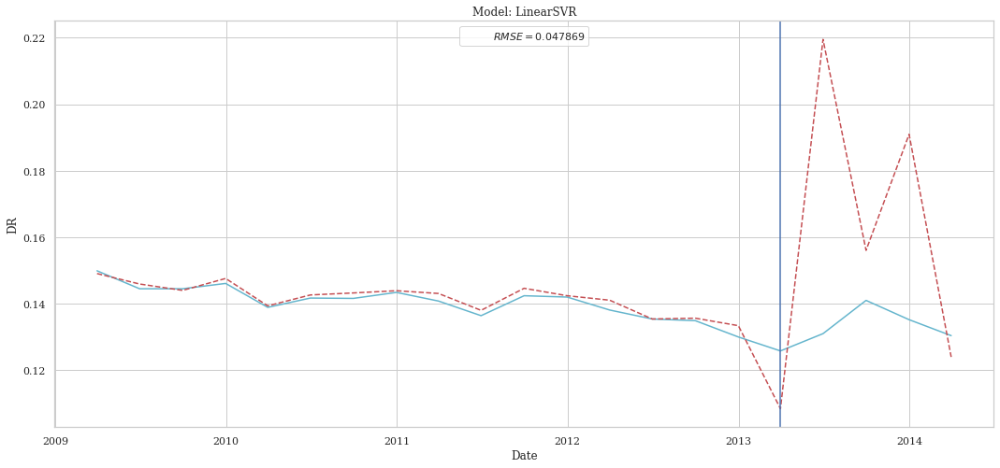

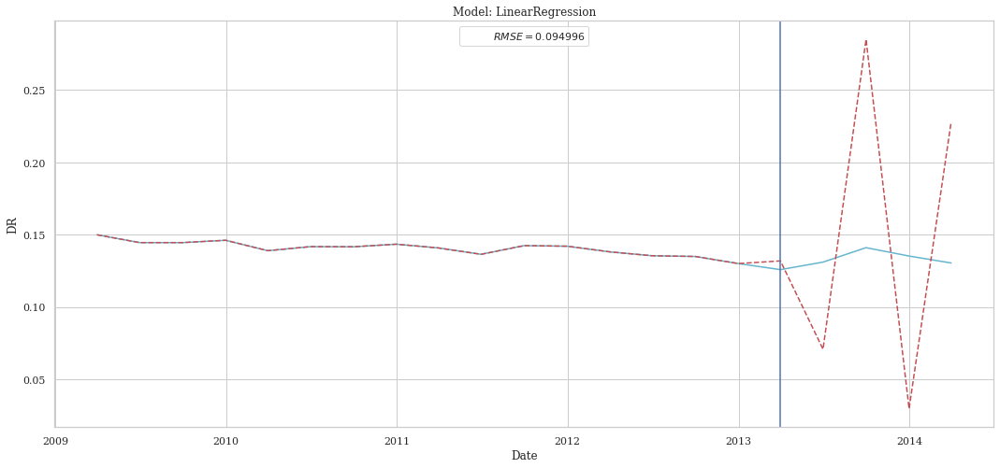

In [96]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [97]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_8_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.009022,0.000081,0.008646,-2.108270
Ridge,0.009367,0.000088,0.007809,-2.350378
CatBoostRegressor,0.009560,0.000091,0.008622,-2.489938
KNeighborsRegressor,0.009769,0.000095,0.008692,-2.644638
LinearRegression,0.010024,0.000100,0.008344,-2.837477
DecisionTreeRegressor,0.012195,0.000149,0.011120,-4.679610
LinearSVR,0.032351,0.001047,0.028847,-38.968708


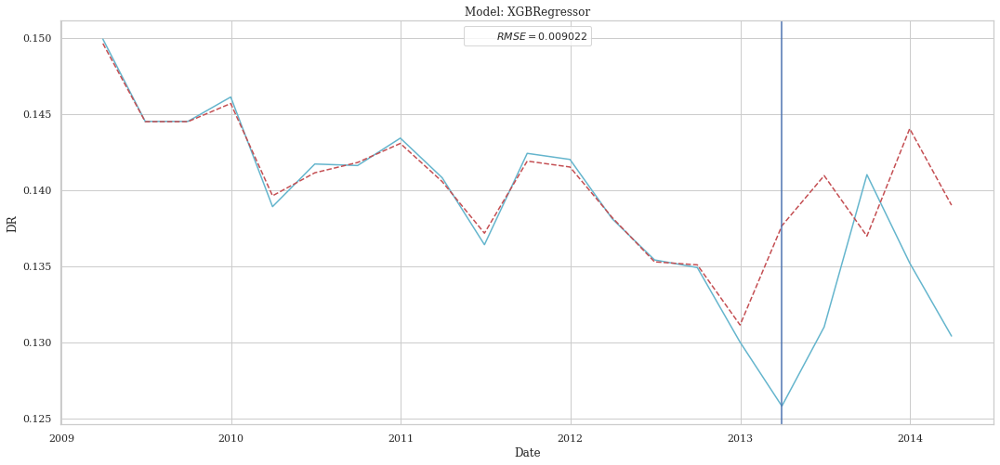

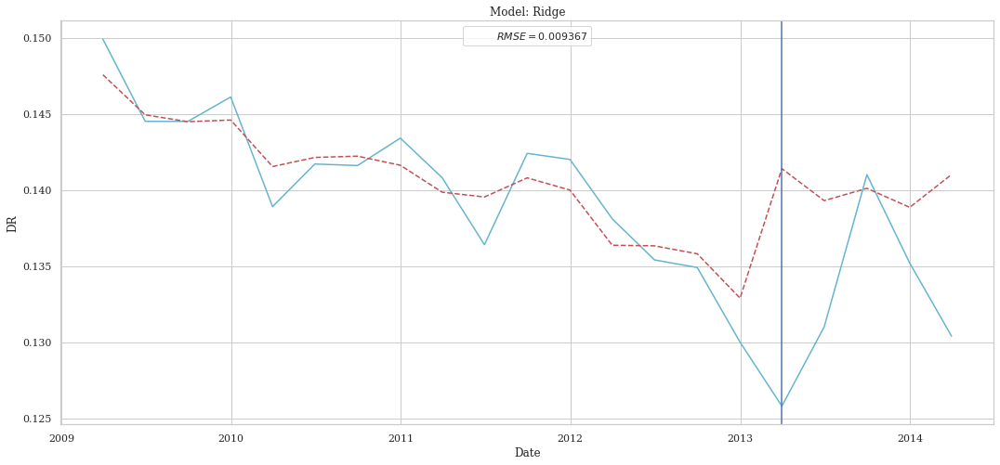

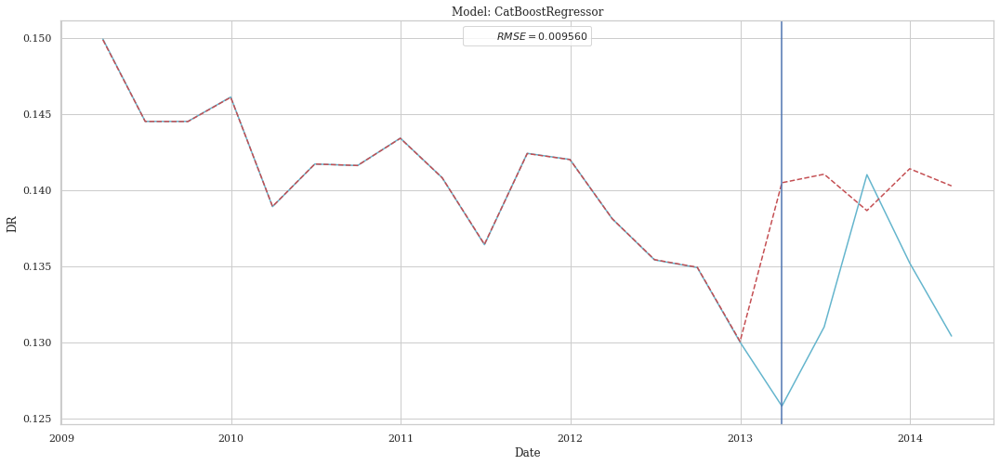

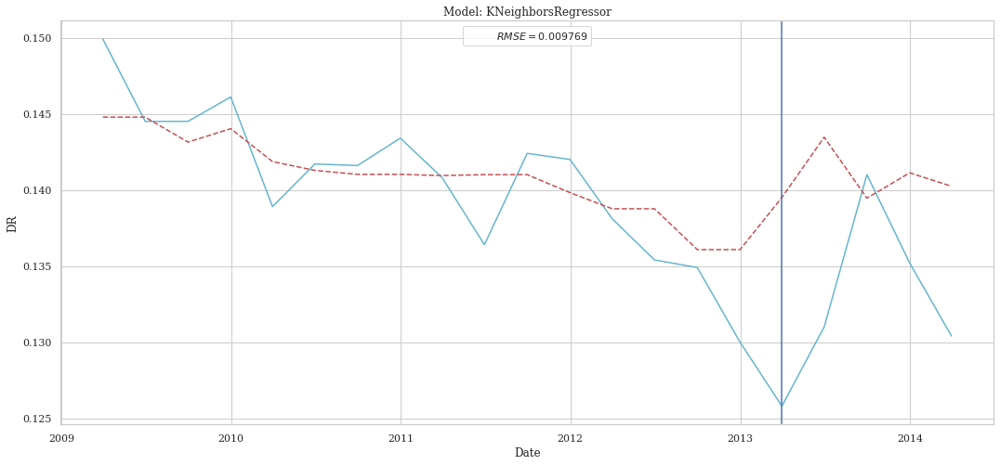

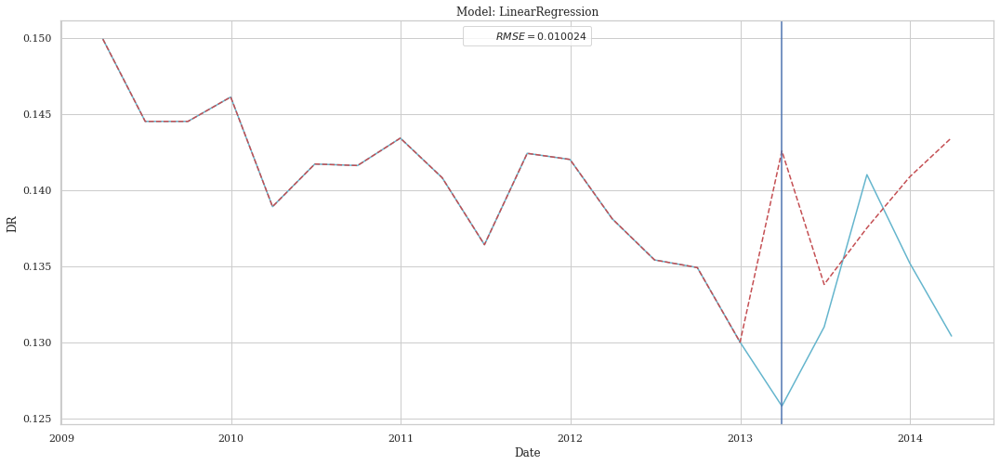

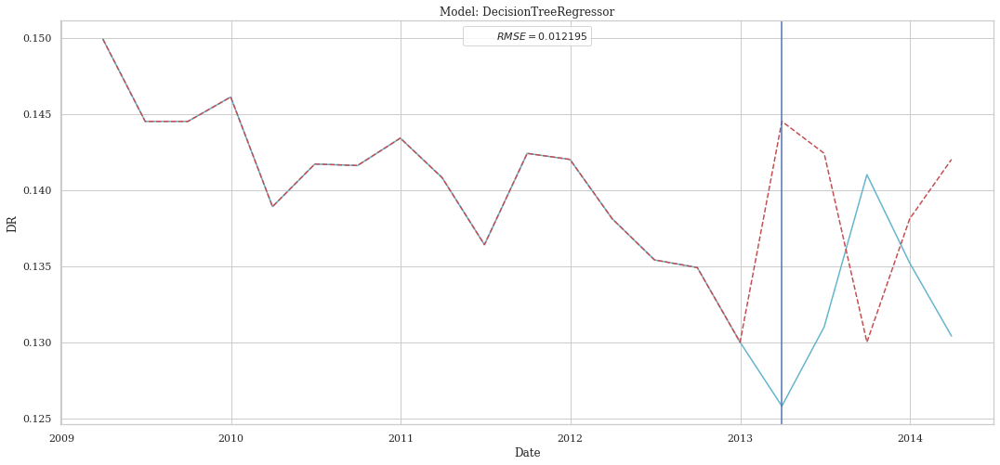

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


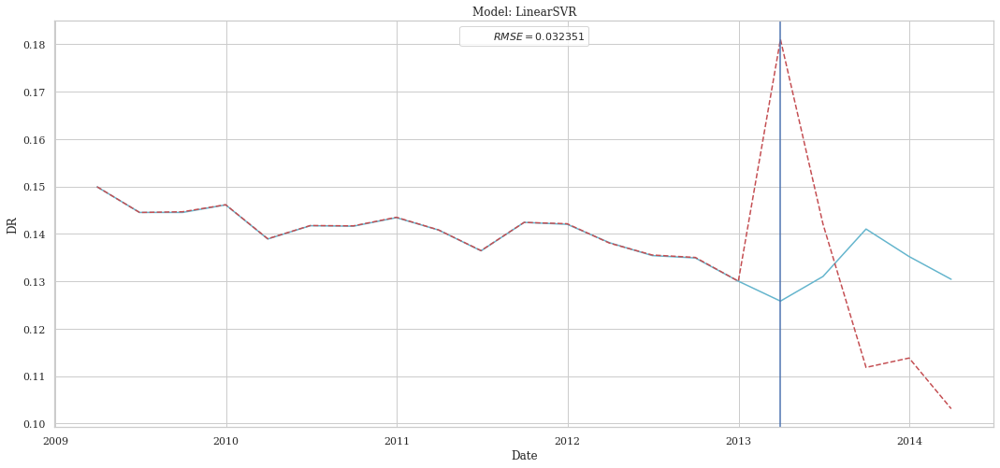

In [98]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### KBest Features

In [99]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_8_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.007950,0.000063,0.006620,-1.413617
CatBoostRegressor,0.009419,0.000089,0.008262,-2.387903
XGBRegressor,0.010546,0.000111,0.009569,-3.246936
KNeighborsRegressor,0.011283,0.000127,0.009772,-3.861851
Ridge,0.011329,0.000128,0.010459,-3.901239
LinearRegression,0.020693,0.000428,0.015820,-15.352060
LinearSVR,0.027422,0.000752,0.024219,-27.716040


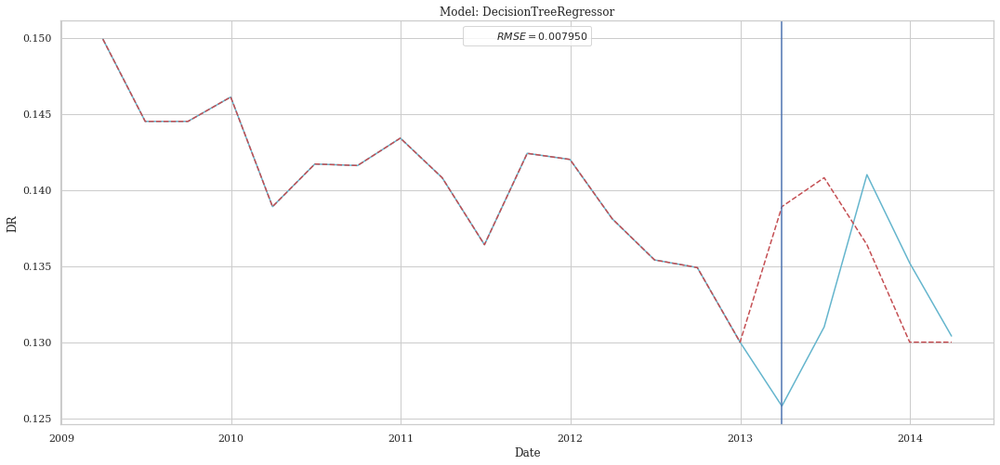

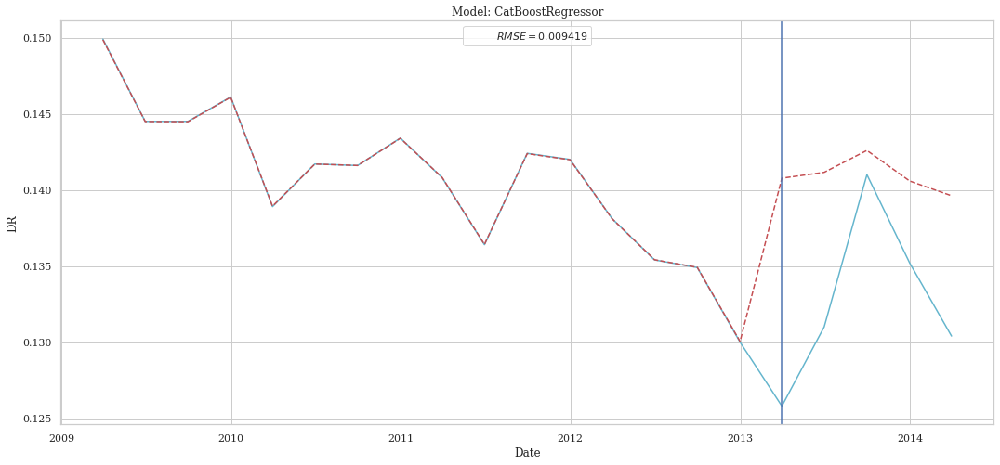

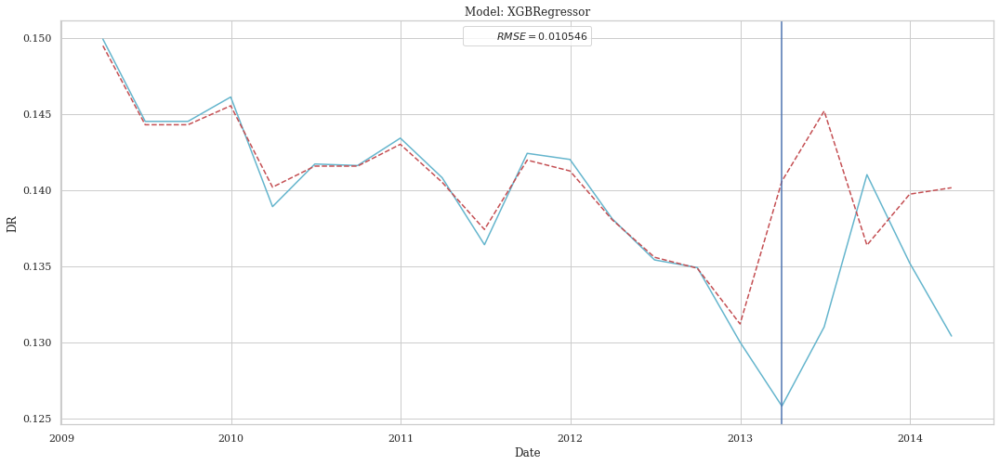

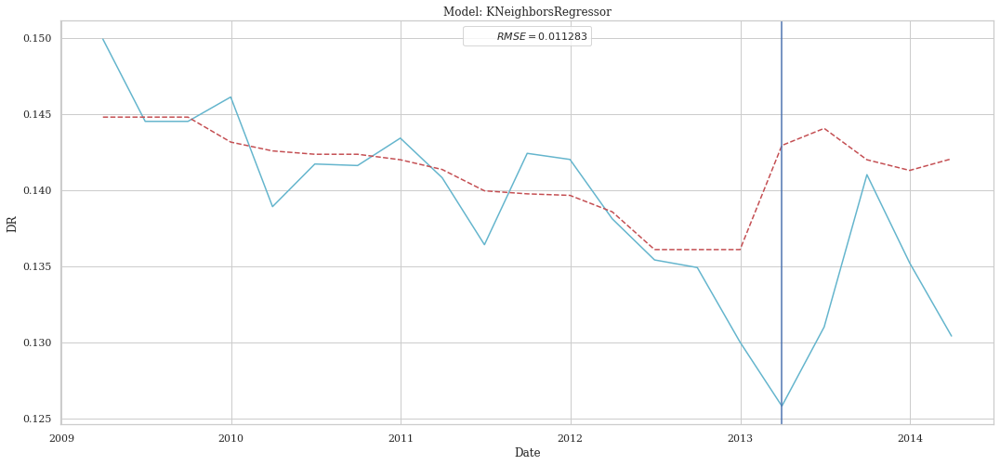

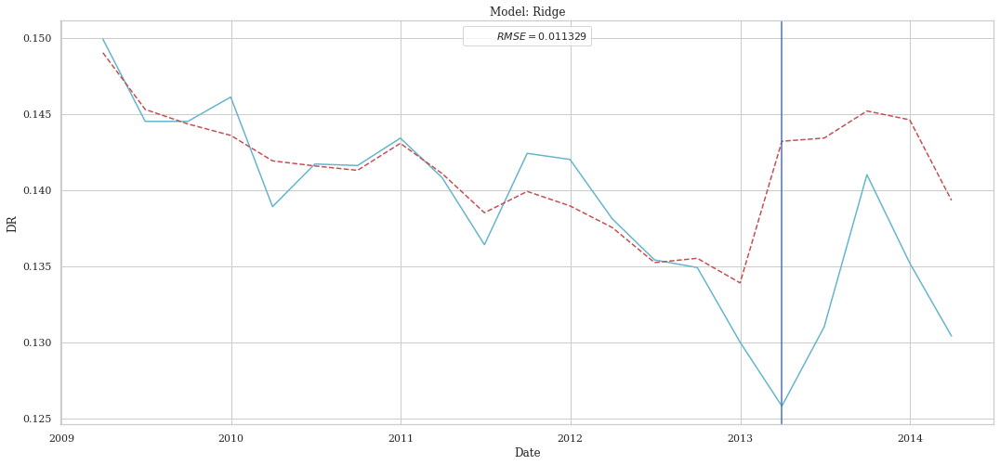

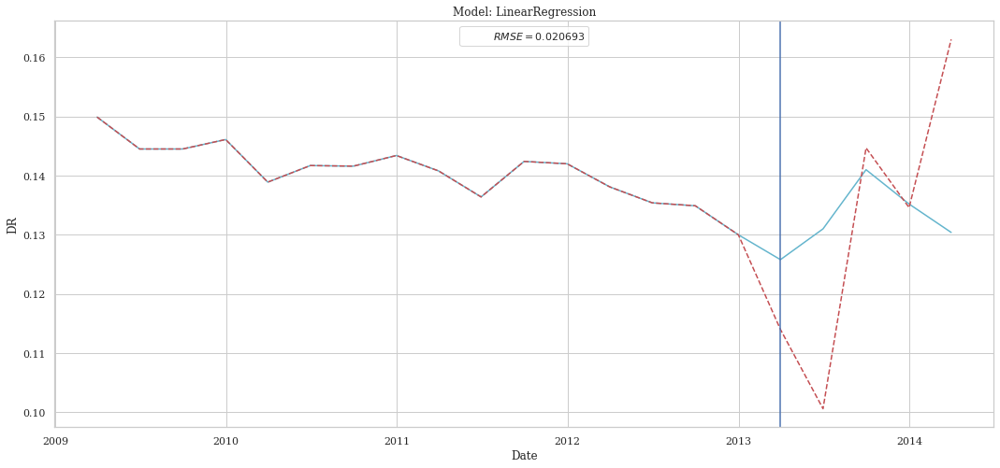

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


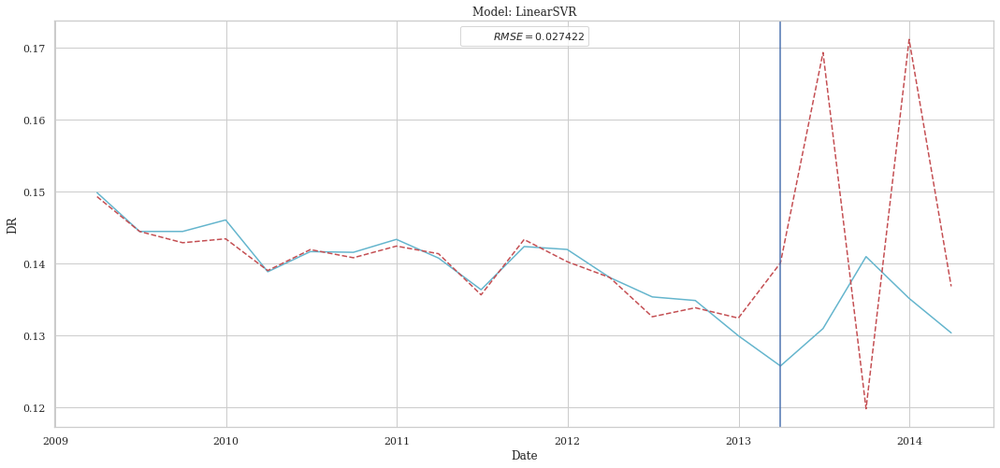

In [100]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Recursive Features

In [101]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_8_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

,rmse,mse,mae,r2
Index,,,,
CatBoostRegressor,0.010308,0.000106,0.009057,-3.057431
KNeighborsRegressor,0.010974,0.000120,0.009656,-3.599187
XGBRegressor,0.010991,0.000121,0.009965,-3.613105
Ridge,0.012472,0.000156,0.011521,-4.940516
DecisionTreeRegressor,0.013318,0.000177,0.012000,-5.773188
LinearRegression,0.014094,0.000199,0.012836,-6.585859
LinearSVR,0.033390,0.001115,0.031115,-41.577148


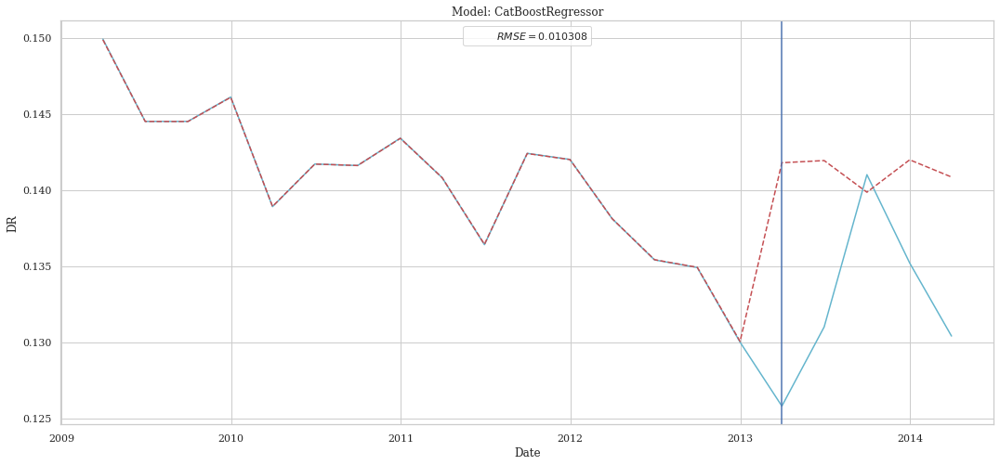

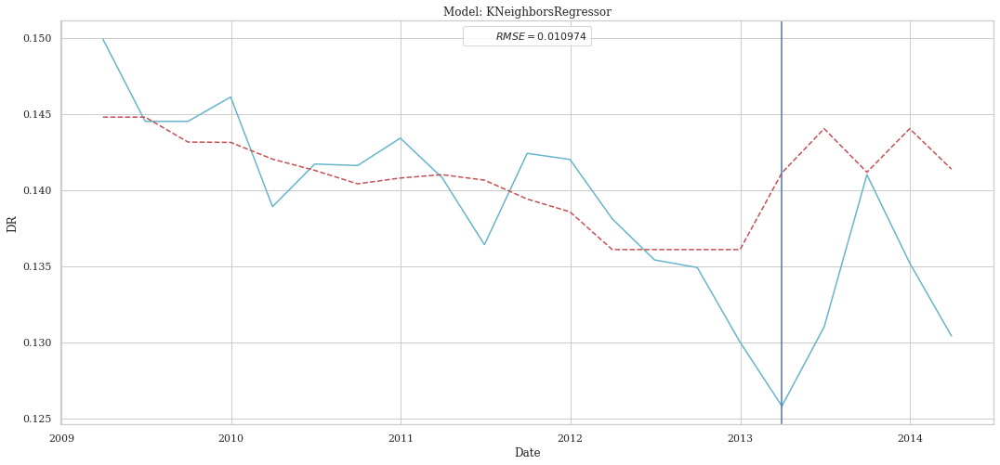

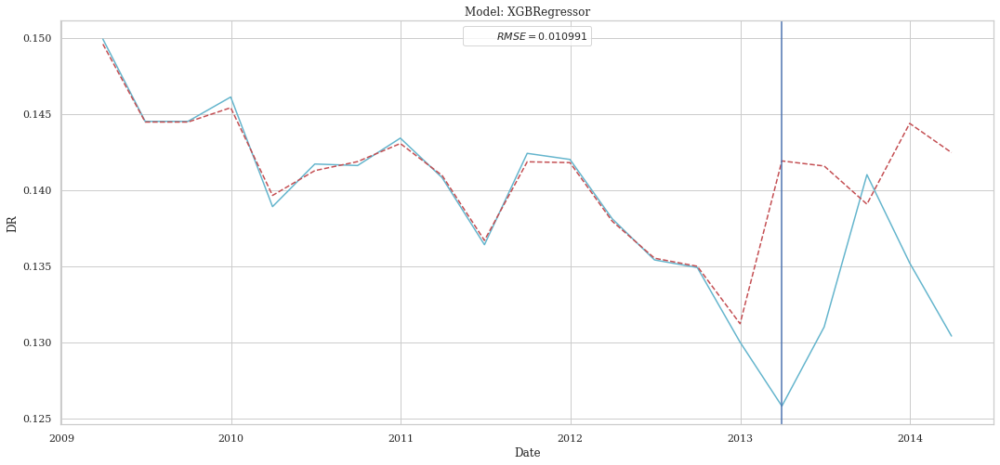

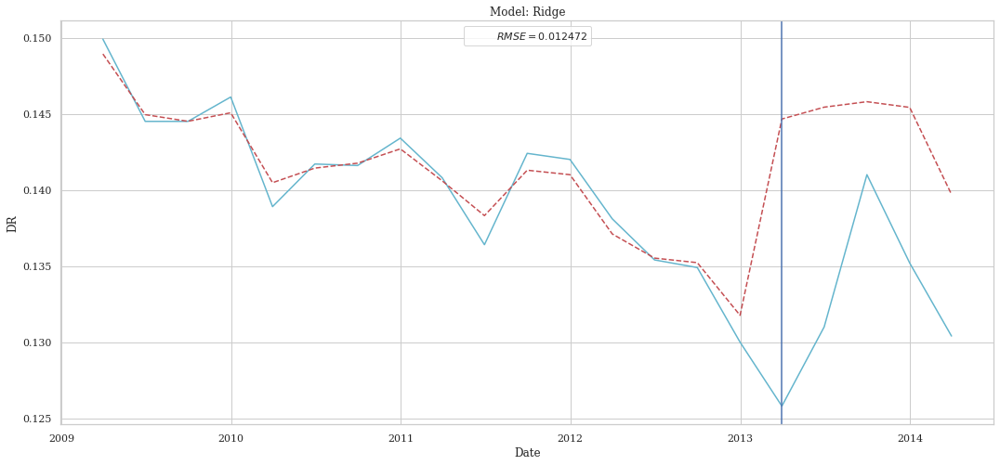

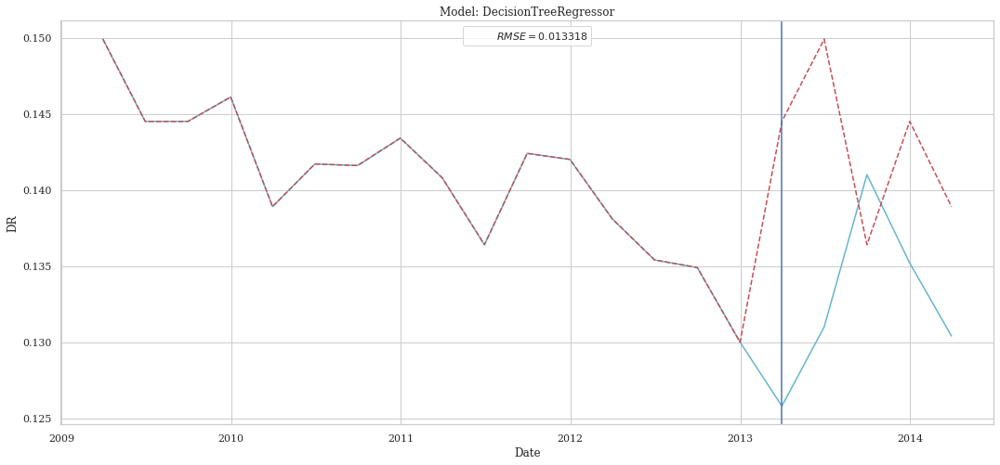

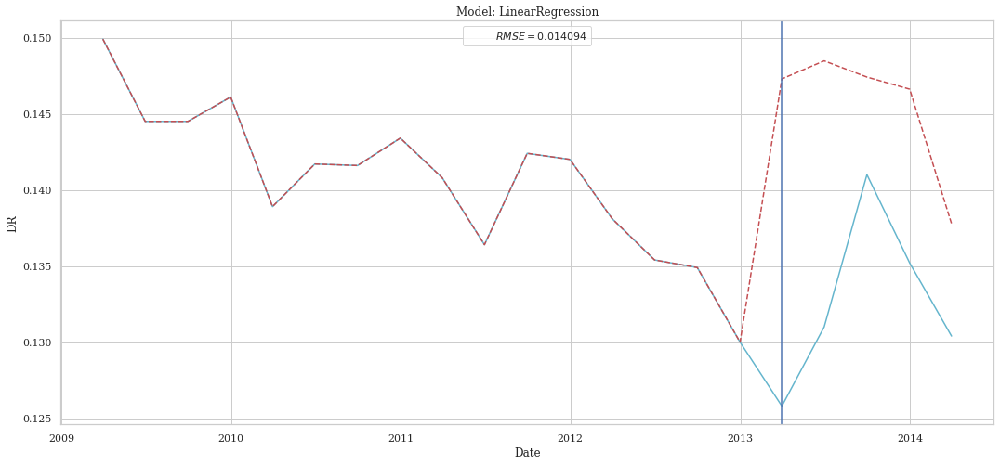

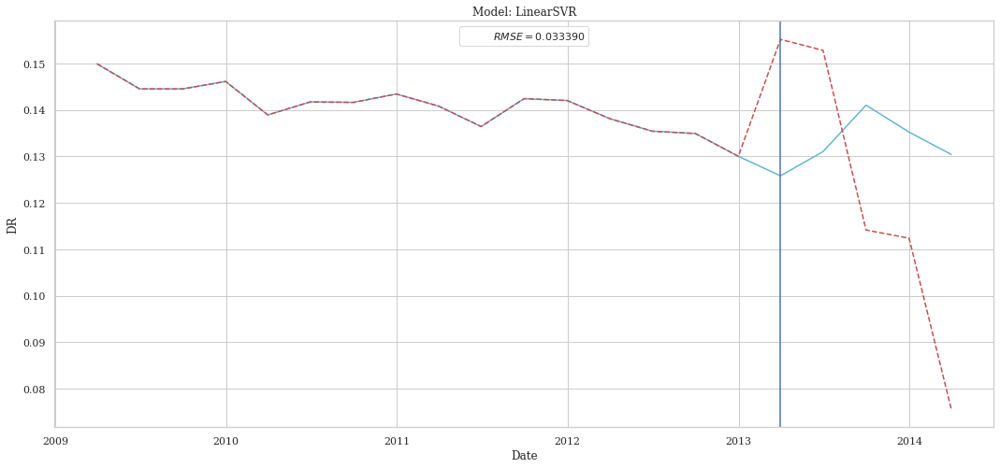

In [102]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [103]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=chronique,col_used=cl.col_8_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.009169,0.000084,0.008056,-2.210711
CatBoostRegressor,0.009186,0.000084,0.008321,-2.222424
XGBRegressor,0.009490,0.000090,0.008287,-2.439078
Ridge,0.010231,0.000105,0.009038,-2.997502
DecisionTreeRegressor,0.010246,0.000105,0.008400,-3.009074
LinearRegression,0.012841,0.000165,0.011455,-5.296868
LinearSVR,0.015535,0.000241,0.014521,-8.215781


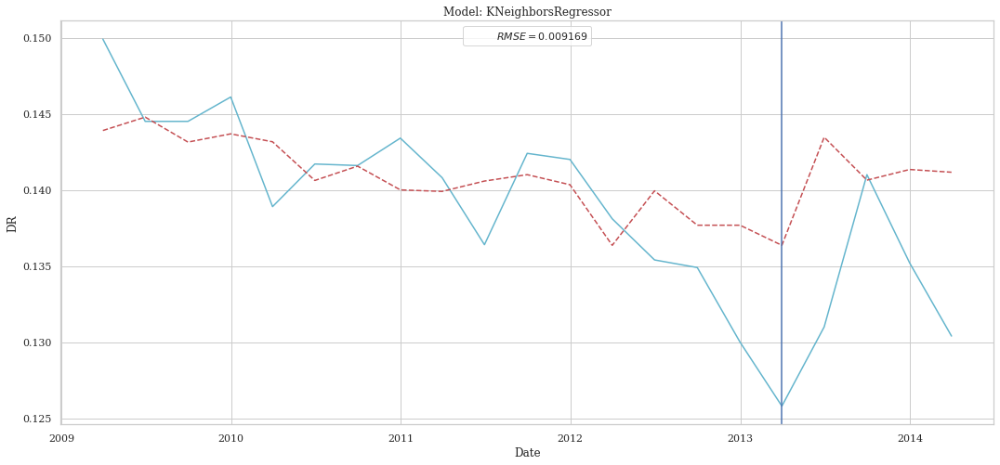

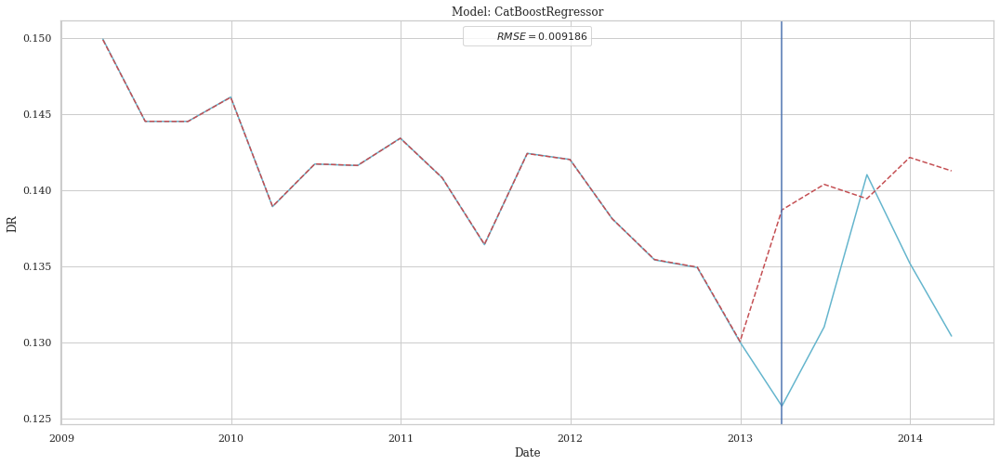

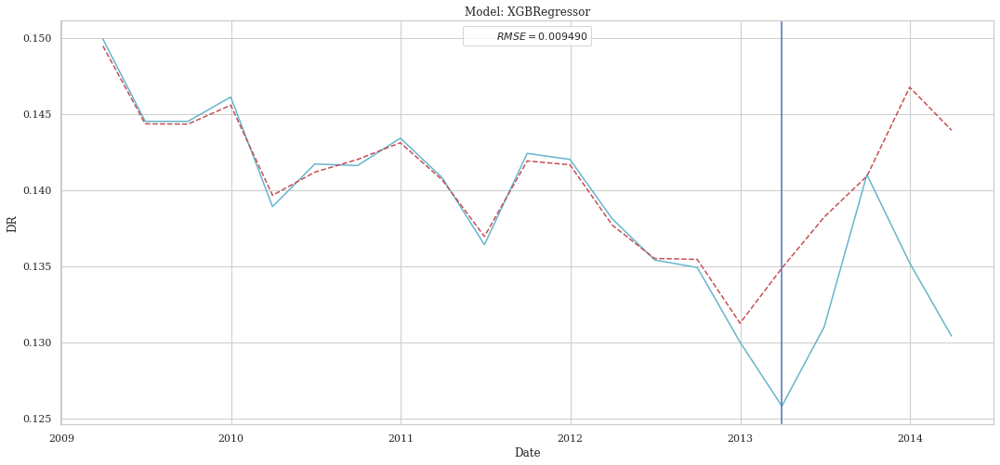

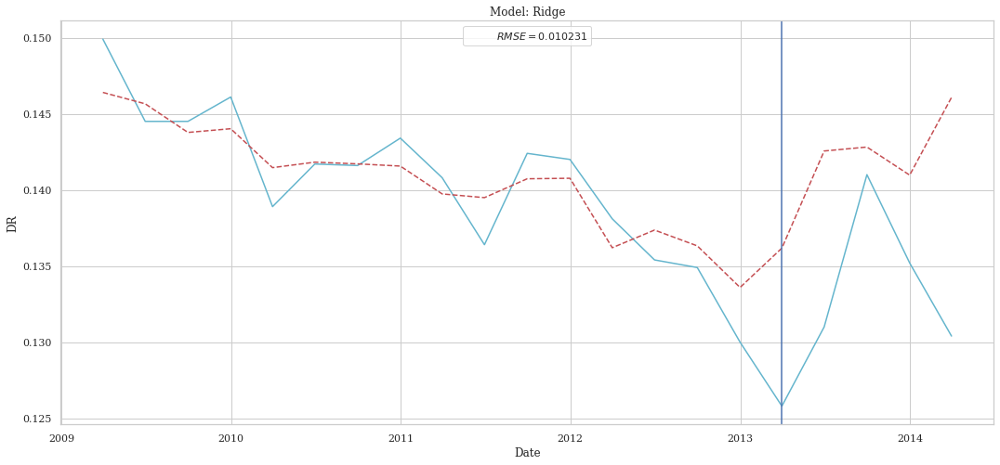

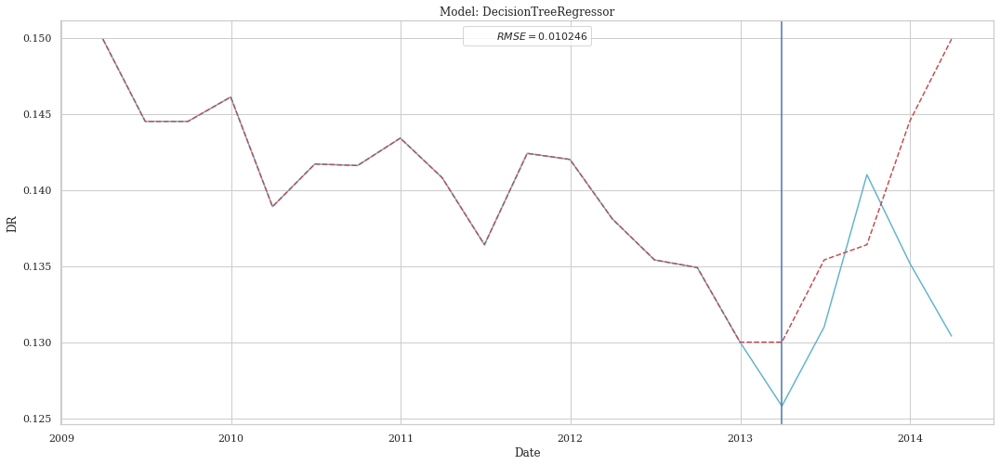

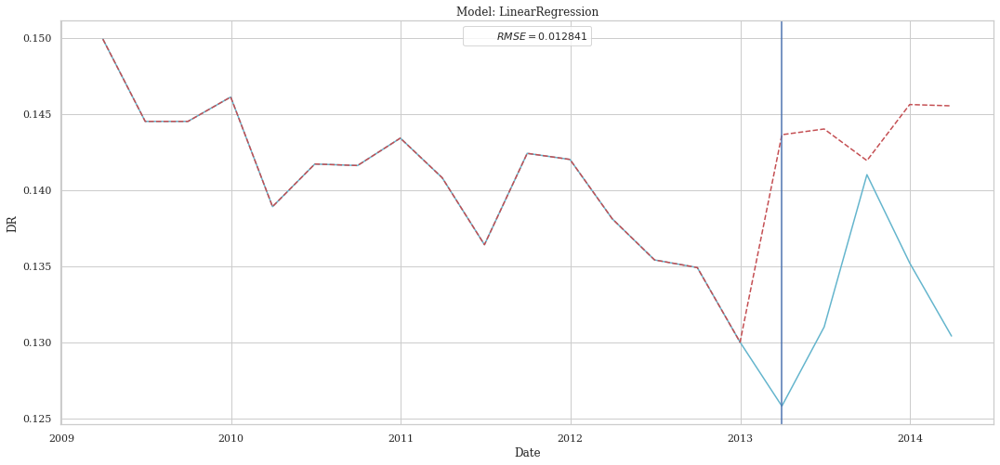

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


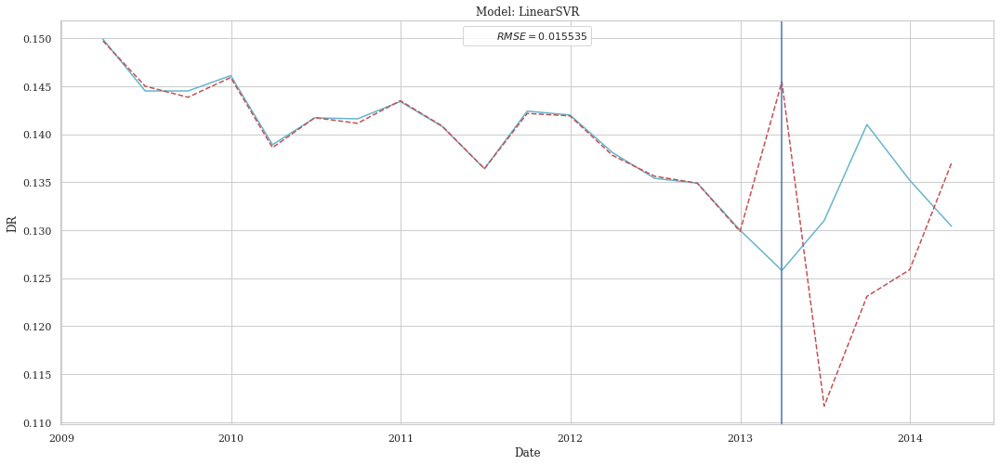

In [104]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [105]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period, chronique=chronique,col_used=cl.col_8_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
LinearRegression,0.008296,0.000069,0.007313,-1.628330
CatBoostRegressor,0.009639,0.000093,0.007926,-2.547783
KNeighborsRegressor,0.010185,0.000104,0.008724,-2.961570
XGBRegressor,0.011538,0.000133,0.008368,-4.083482
Ridge,0.011710,0.000137,0.009244,-4.236300
DecisionTreeRegressor,0.012453,0.000155,0.010380,-4.921957
LinearSVR,0.038556,0.001487,0.034396,-55.770768


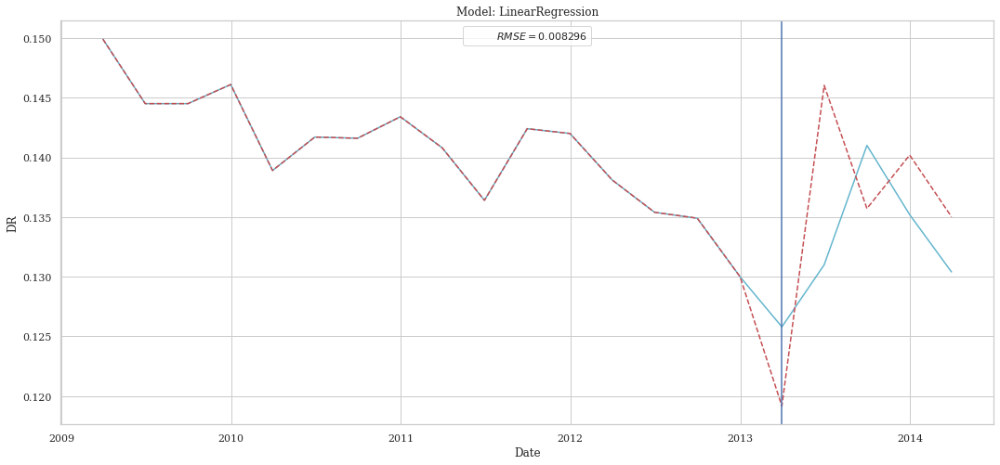

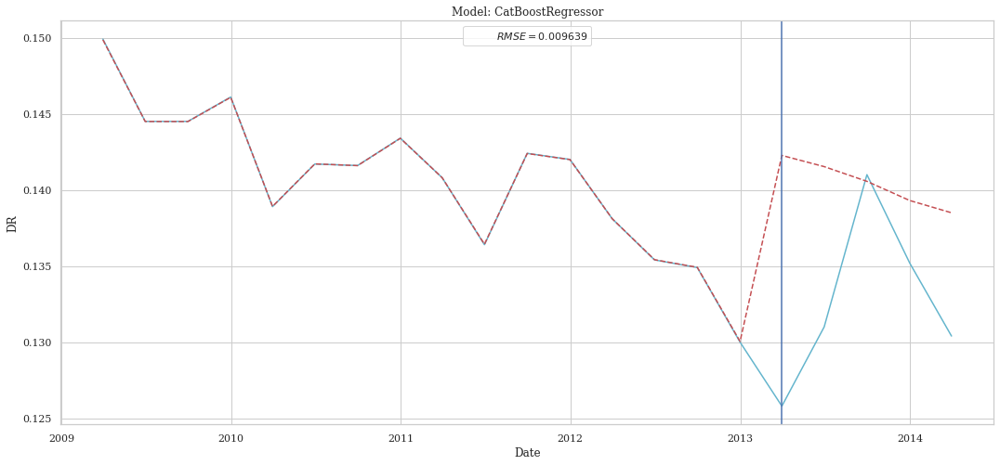

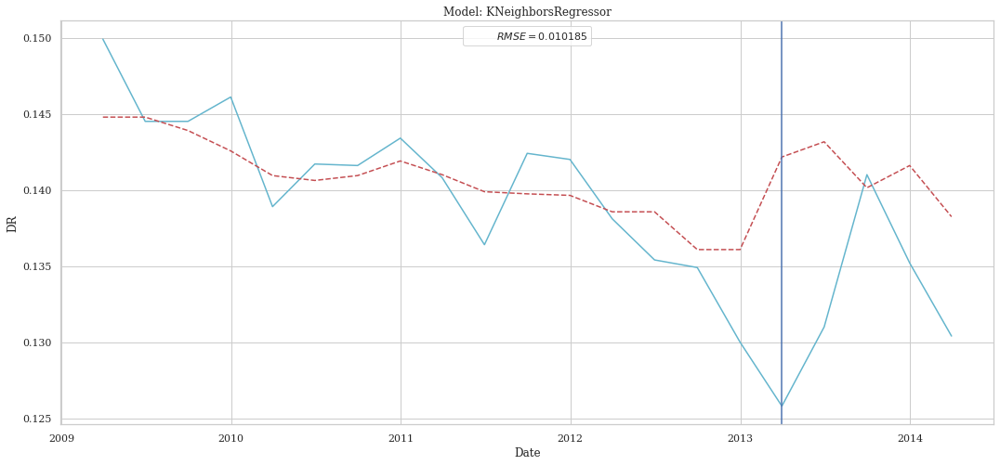

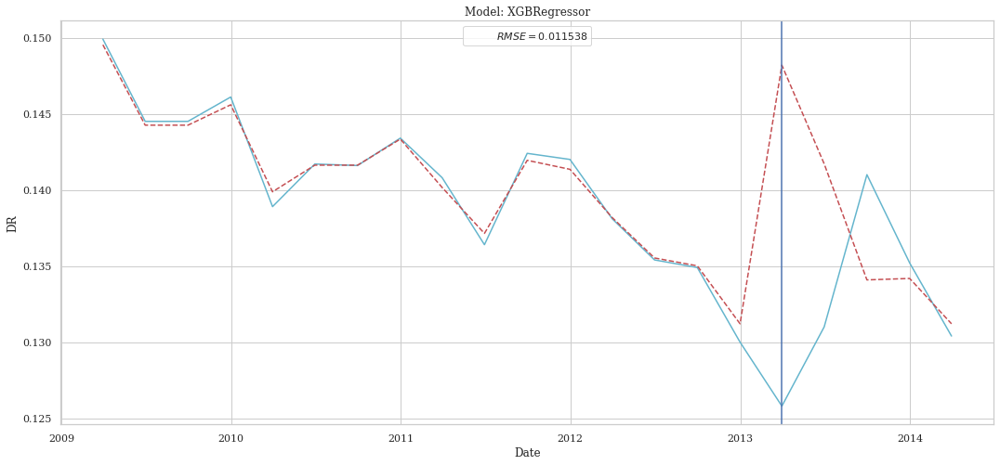

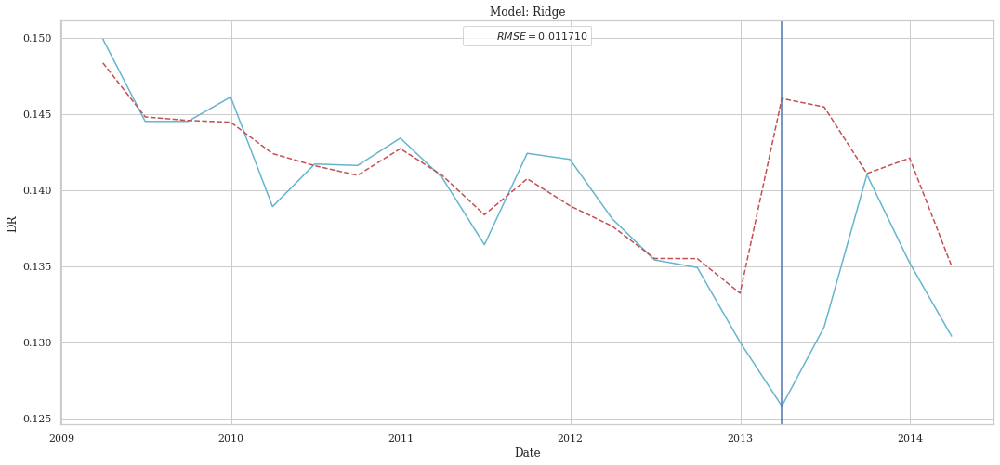

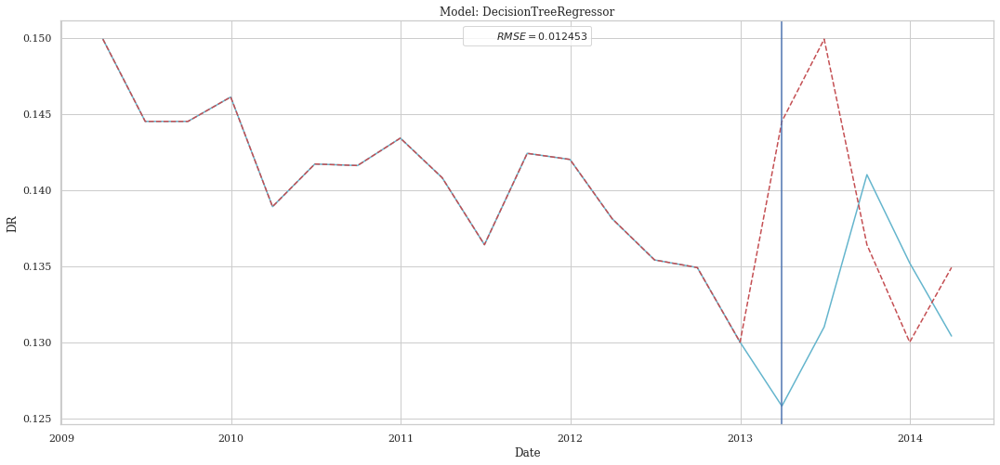

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


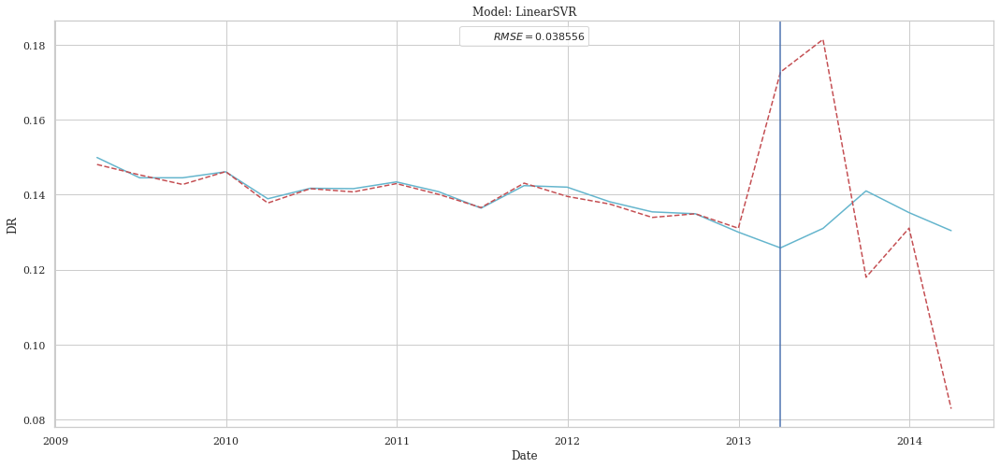

In [106]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [107]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_8_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.009221,0.000085,0.008642,-2.246976
CatBoostRegressor,0.009540,0.000091,0.008210,-2.475634
KNeighborsRegressor,0.011004,0.000121,0.009360,-3.624203
DecisionTreeRegressor,0.012818,0.000164,0.011320,-5.274899
Ridge,0.012915,0.000167,0.012179,-5.369451
LinearRegression,0.032941,0.001085,0.032307,-40.439672
LinearSVR,0.033624,0.001131,0.028829,-42.174271


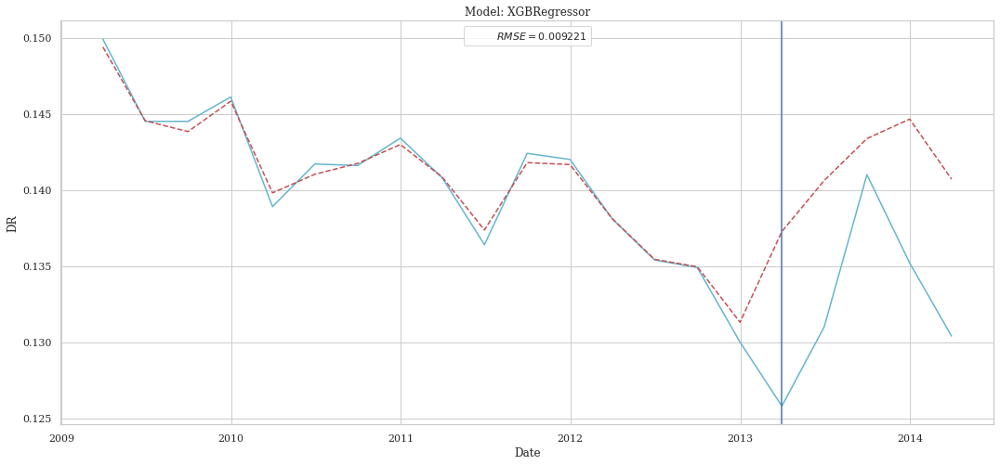

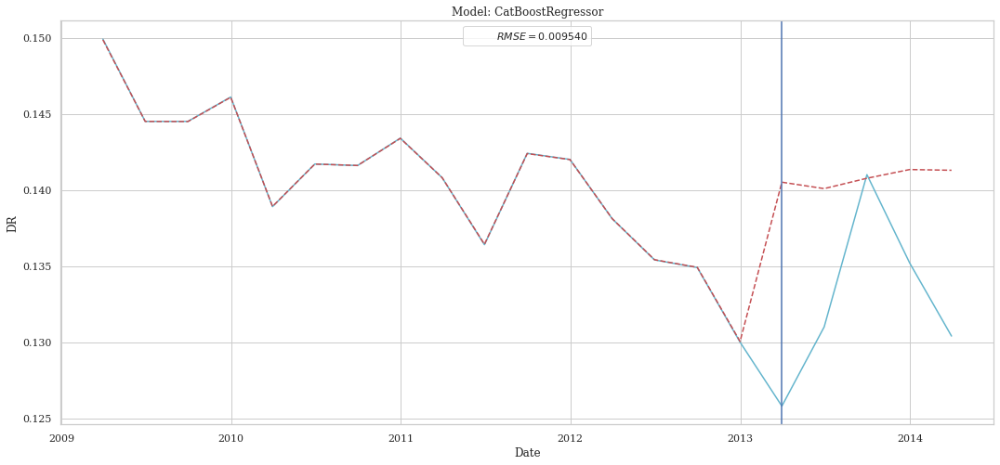

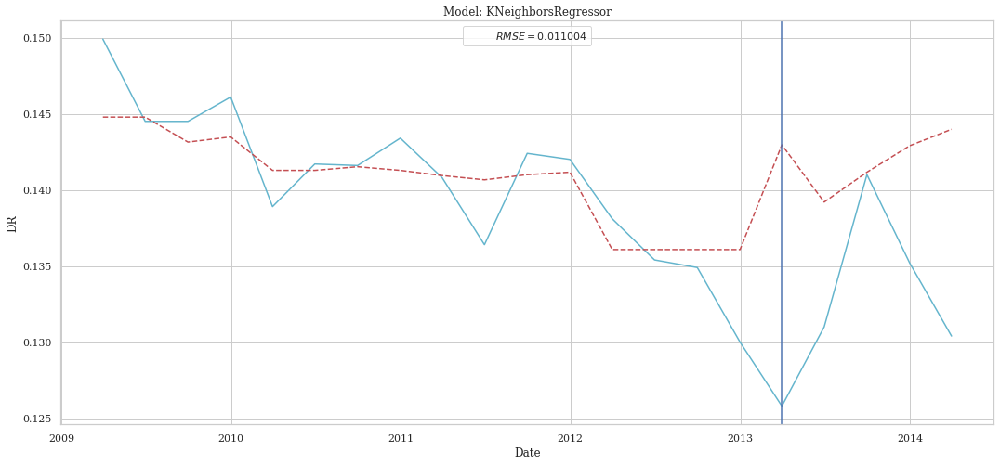

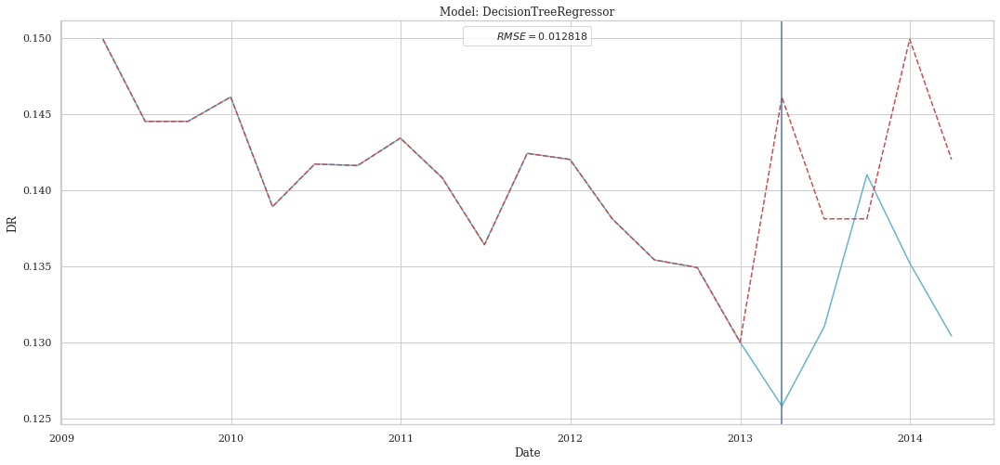

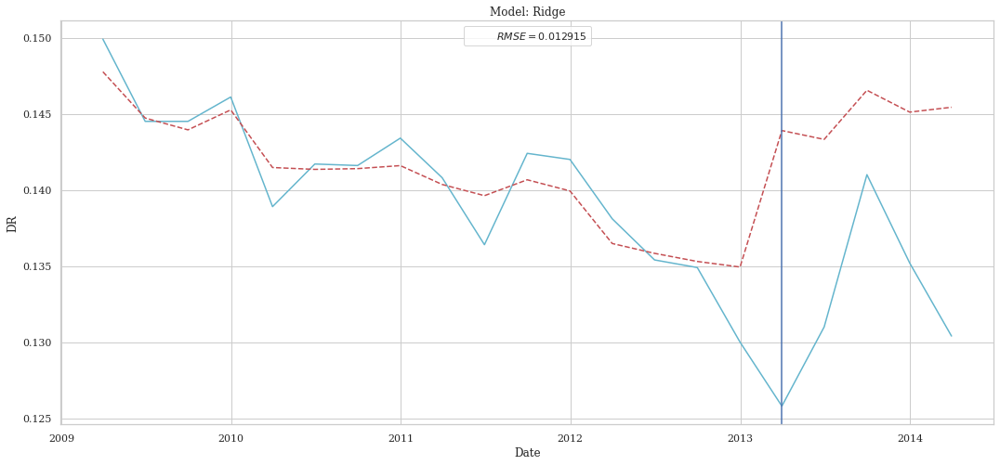

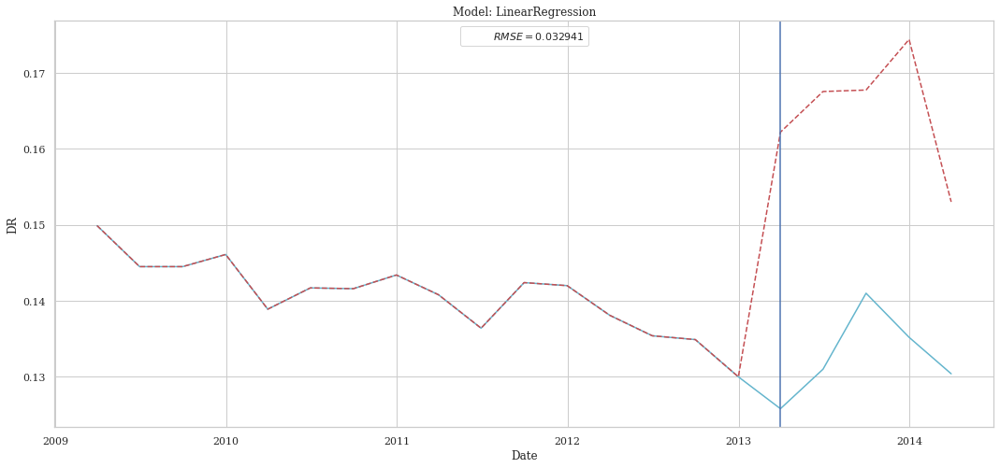

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


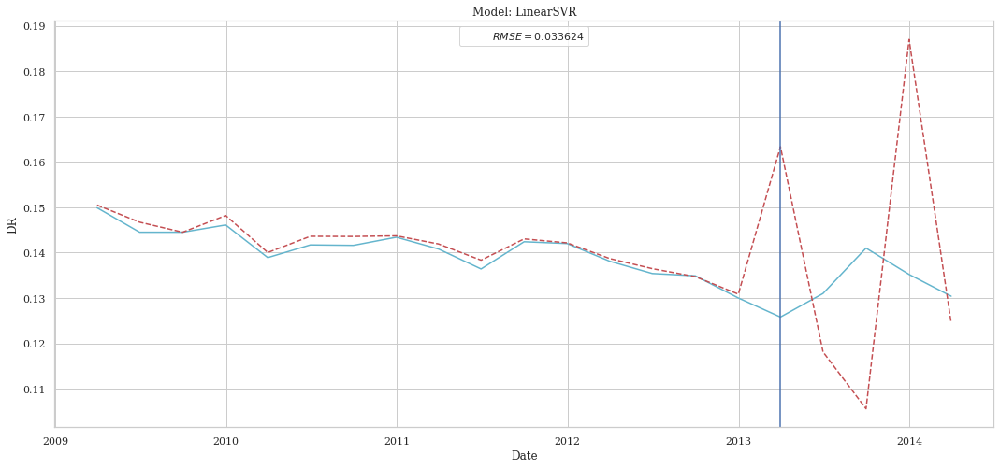

In [108]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [109]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_8_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.008929,0.000080,0.007873,-2.044893
CatBoostRegressor,0.009637,0.000093,0.008385,-2.546988
KNeighborsRegressor,0.009731,0.000095,0.007828,-2.616348
Ridge,0.010210,0.000104,0.008040,-2.980582
DecisionTreeRegressor,0.012062,0.000145,0.009560,-4.555878
LinearSVR,0.028587,0.000817,0.025287,-30.208802
LinearRegression,0.031826,0.001013,0.025349,-37.681773


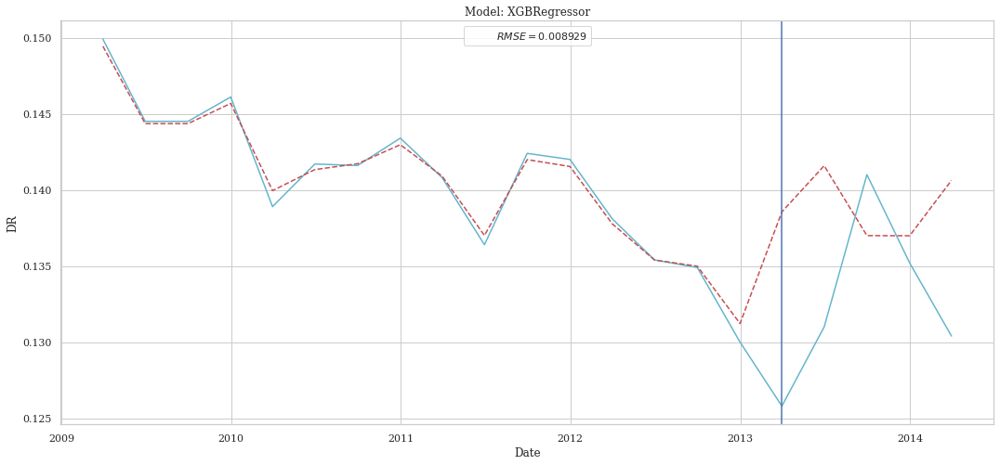

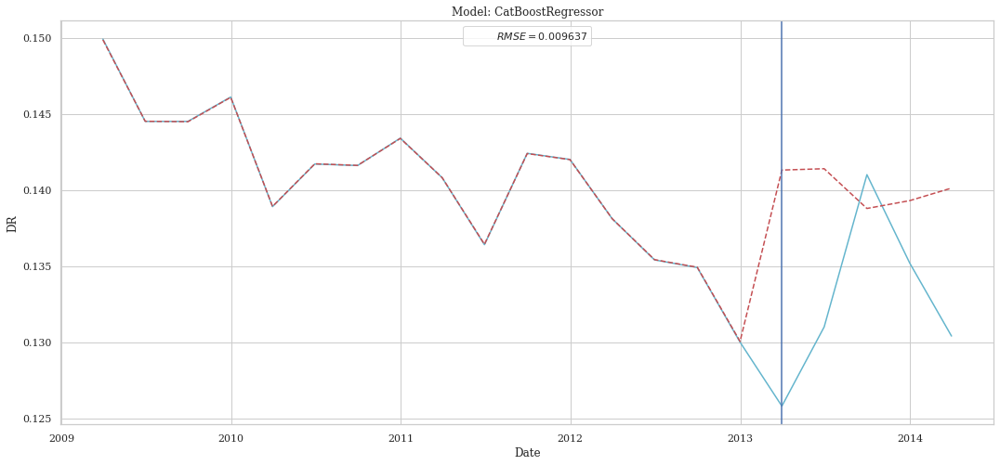

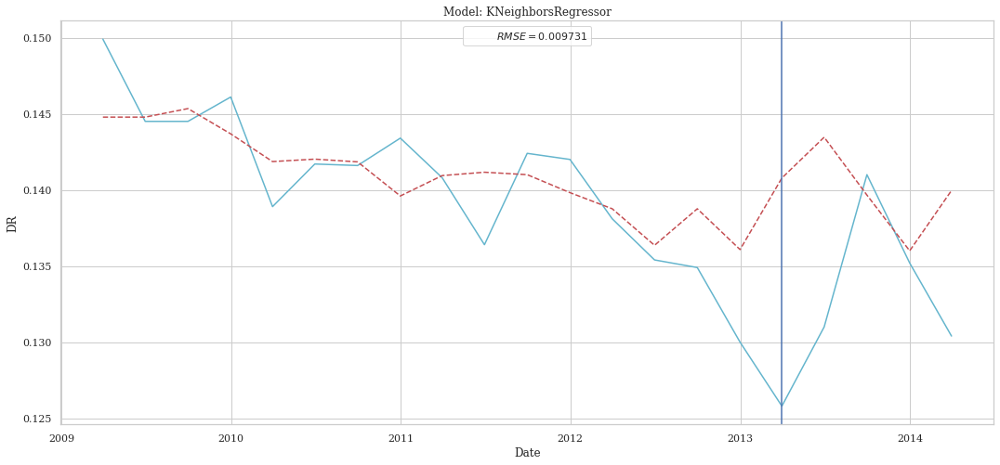

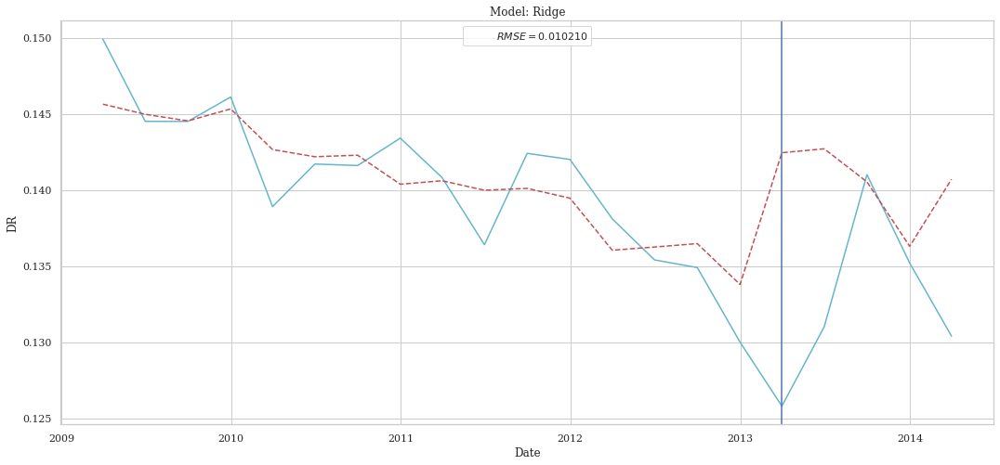

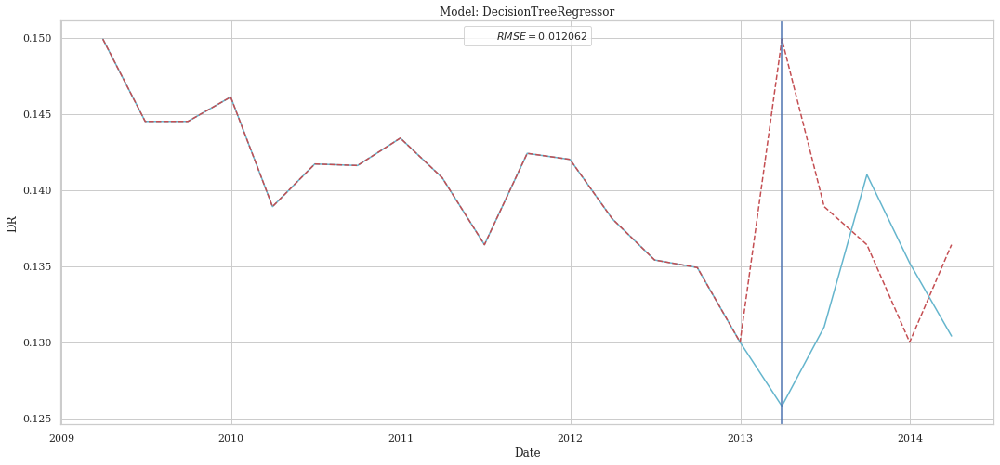

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


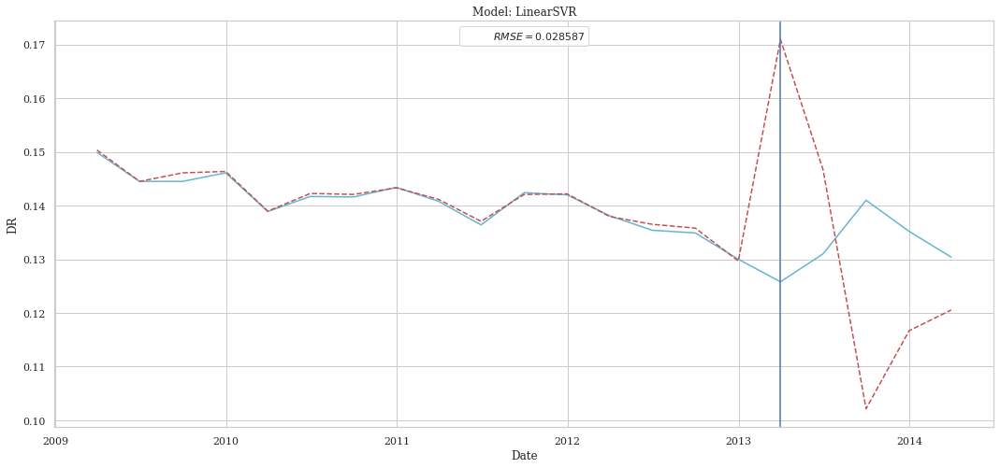

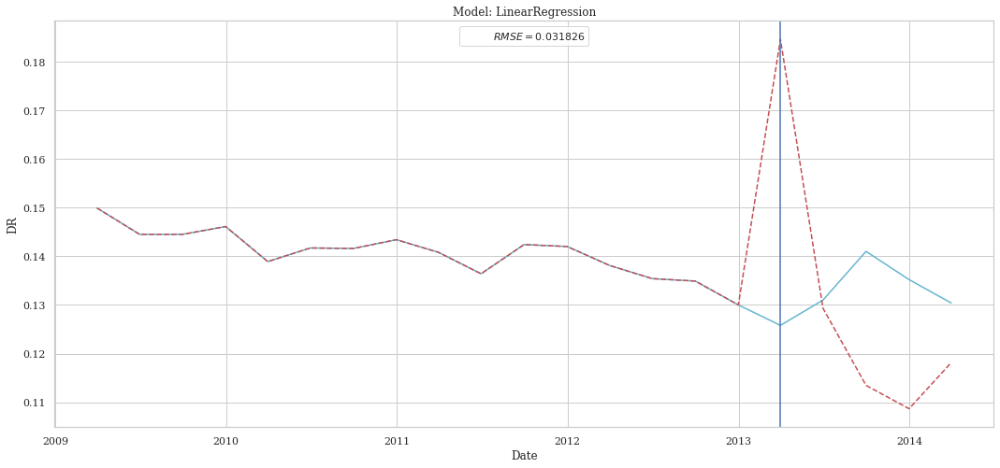

In [110]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

## First Conclusion
Ridge and DecisionTree give the best results for Kbest features and Sequential Forward Features, so we will use these two models for the GridSearch

### GridSearch on DecisionTree

In [111]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_8_seq_for,split=split,norm=norm)
params_tre = {"criterion":["squared_error","friedman_mse","absolute_error","poisson"],"splitter":["best"],"max_features":["auto","sqrt","log2"]}
params,score = params_grid(X_train,y_train,X_test,y_test,"tre",parameters=params_tre,metric='mse')
print(params,score)

Fitting 2 folds for each of 12 candidates, totalling 24 fits
{'criterion': 'poisson', 'max_features': 'auto', 'splitter': 'best'} 2.5954000000000033e-05


/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/tree/_classes.py", line 1247, in fit
    super().fit(
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/tree/_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'

  warnings.warn("Estimator fit failed. The score on this train-test"
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit fai

In [112]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["tre"],parameters={"p_tre":params})
summary

,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.005095,0.000026,0.00506,0.008845


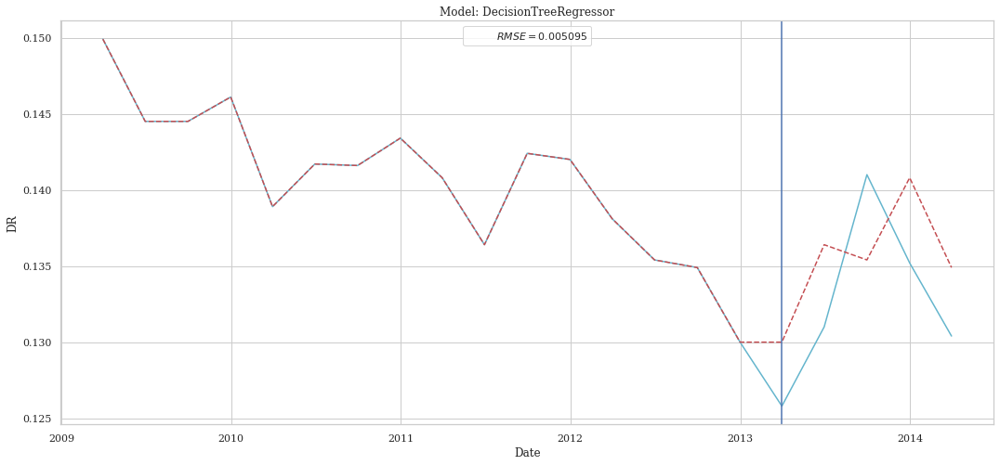

In [113]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_tre":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_tre":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[0],df_score=summary)

### GridSearch on Ridge

In [114]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_8_kbest,split=split,norm=norm)
params_rid = {"alpha":[1],"fit_intercept":[True,False],"solver":["auto","svd","cholesky","lsqr","sparse_cg","sag","saga"]}
params,score = params_grid(X_train,y_train,X_test,y_test,"rid",parameters=params_rid)
print(params,score)

Fitting 2 folds for each of 14 candidates, totalling 28 fits
{'alpha': 1, 'fit_intercept': True, 'solver': 'sag'} 0.011331718750128625


In [115]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["rid"],parameters={"p_rid":params})
summary

,rmse,mse,mae,r2
Index,,,,
Ridge,0.011333,0.000128,0.010463,-3.905243


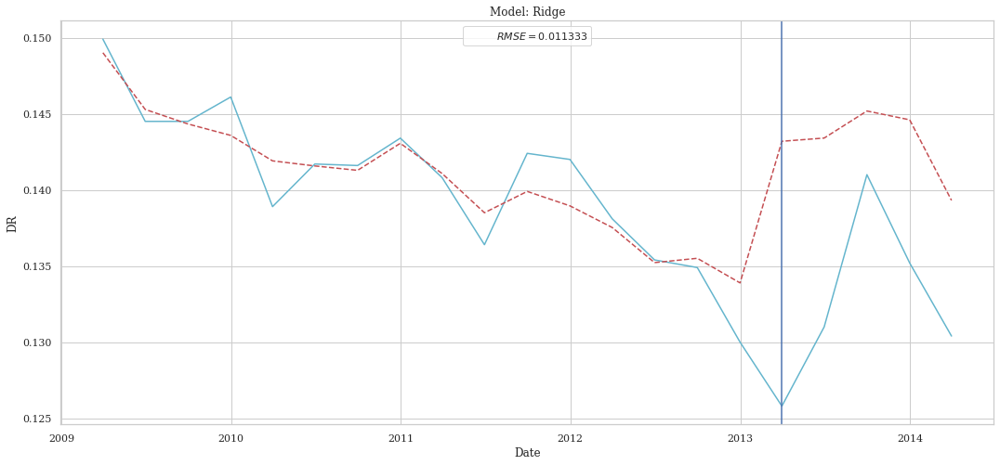

In [116]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_tre":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_tre":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[0],df_score=summary)

## Final Conclusion
Grid Search is relevant for the DecisionTree model but not for the Ridge. With the Grid we obtain a r2 equals to -1.007 against -1.95 before GridSearch. Concerning the rmse is now 0.003289 against 0.003982.

In [117]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_8_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.008929,0.000080,0.007873,-2.044893
CatBoostRegressor,0.009637,0.000093,0.008385,-2.546988
KNeighborsRegressor,0.009731,0.000095,0.007828,-2.616348
Ridge,0.010210,0.000104,0.008040,-2.980582
DecisionTreeRegressor,0.012062,0.000145,0.009560,-4.555878
LinearSVR,0.028721,0.000825,0.025310,-30.502802
LinearRegression,0.031826,0.001013,0.025349,-37.681773


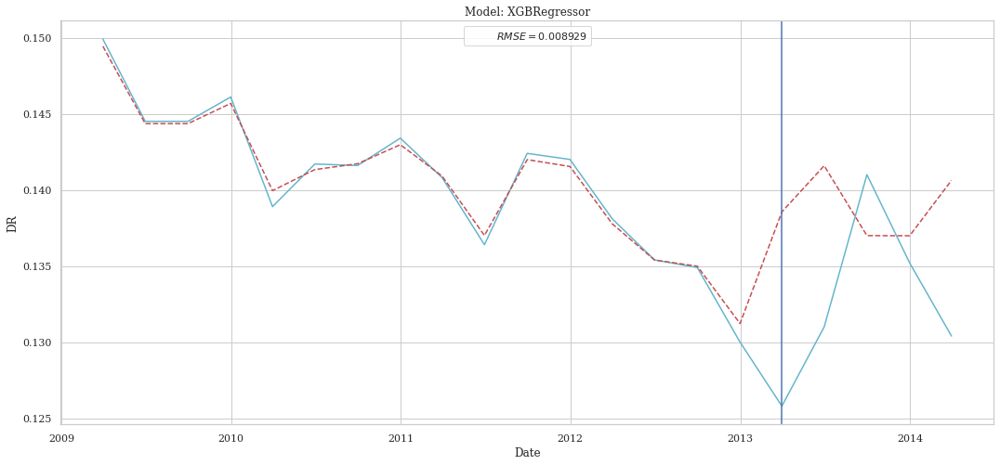

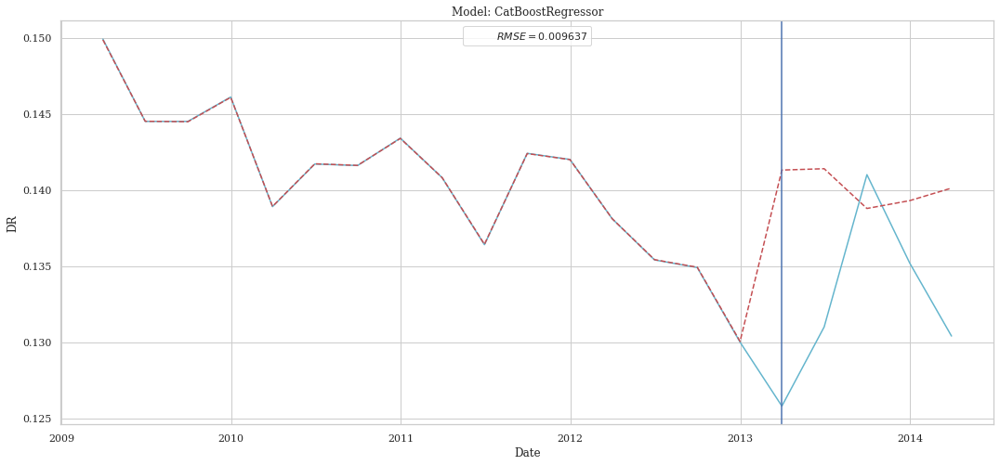

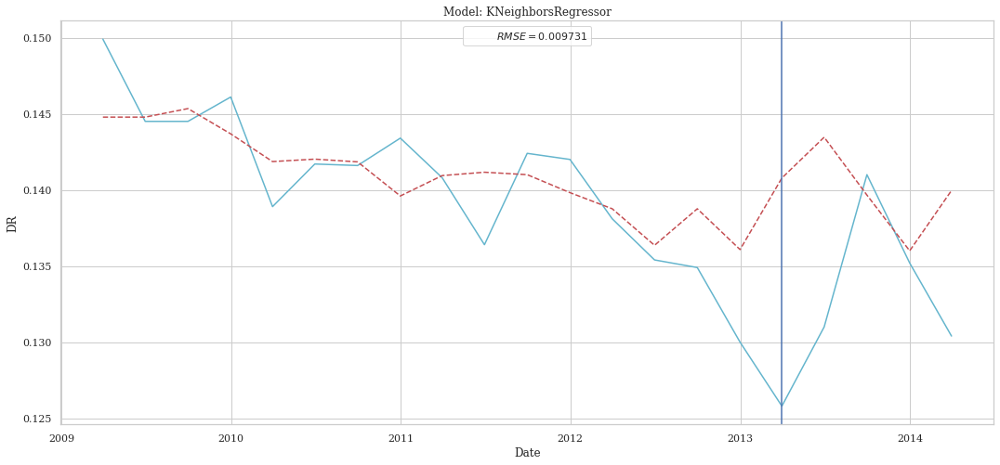

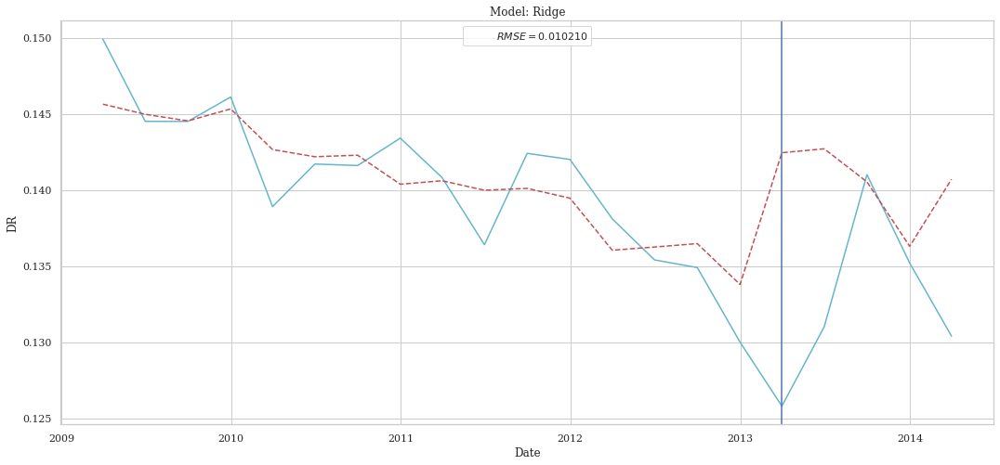

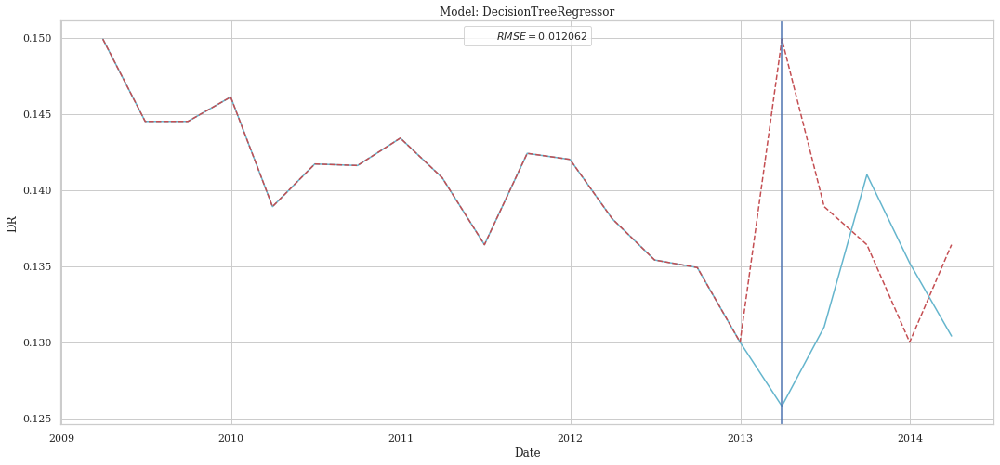

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


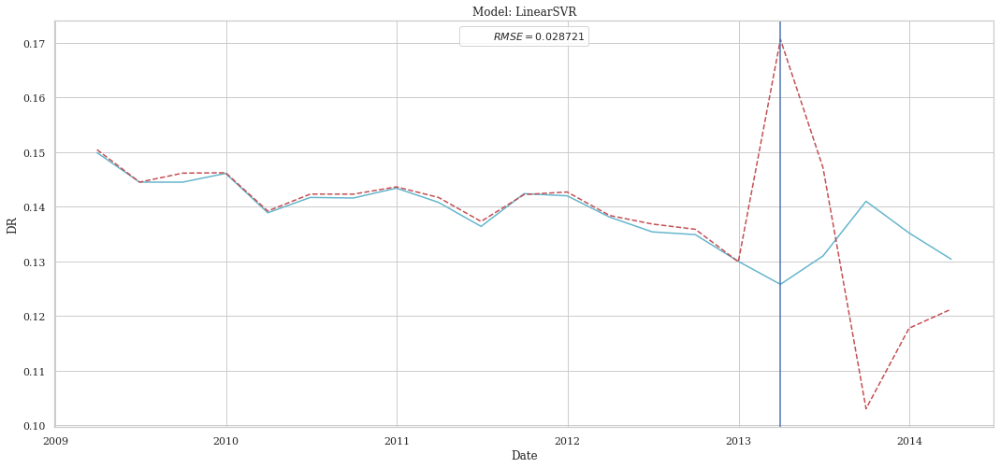

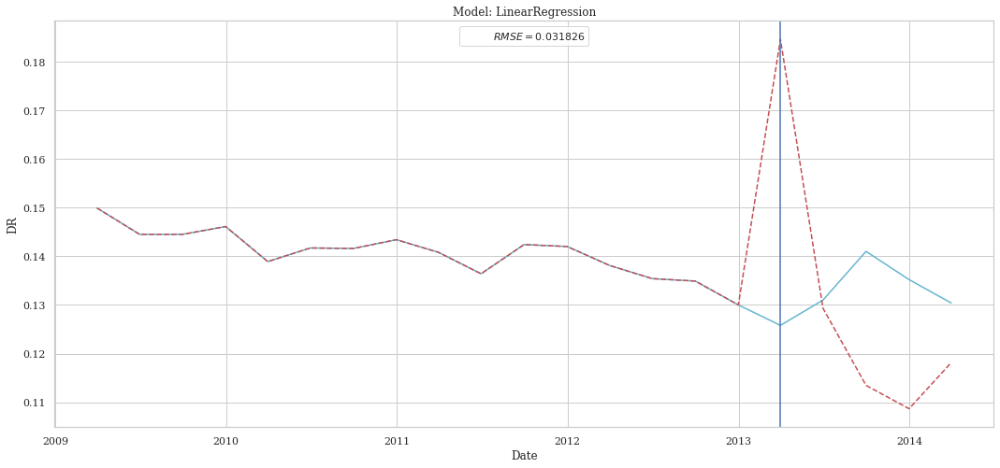

In [118]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

# Focus on Chronique Totale

## Machine Learning
We will focus on all the different features selection and after we choose the best model, with the best features we will focus on doing a grid search on this model

In [119]:
chronique=b'Totale'
start = 1
norm = "MinMax"
split = 0.2
period=36

### Correlation Features

In [120]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_totale_corr,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.001974,0.000004,0.001940,-30.035032
CatBoostRegressor,0.002046,0.000004,0.001843,-32.312685
XGBRegressor,0.002202,0.000005,0.001949,-37.606435
KNeighborsRegressor,0.002278,0.000005,0.001972,-40.311465
Ridge,0.002296,0.000005,0.001798,-40.988062
LinearSVR,0.003413,0.000012,0.002827,-91.752924
LinearRegression,0.006357,0.000040,0.005272,-320.748651


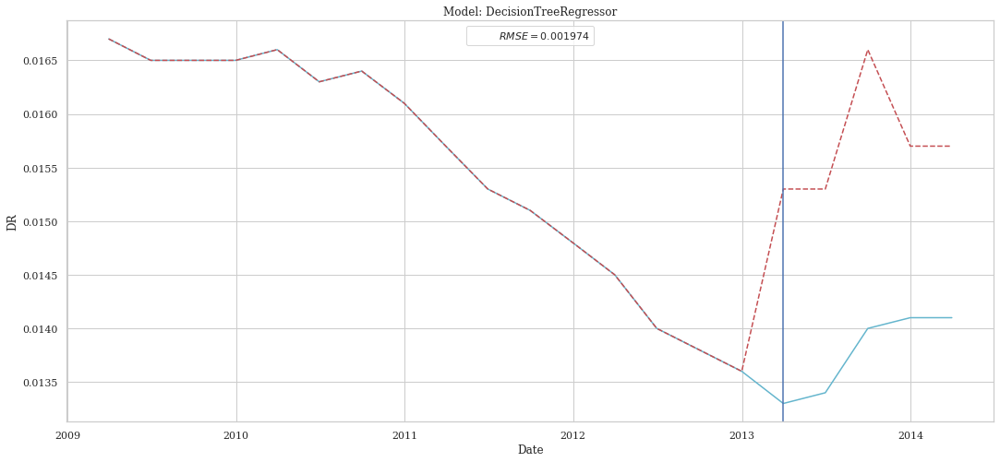

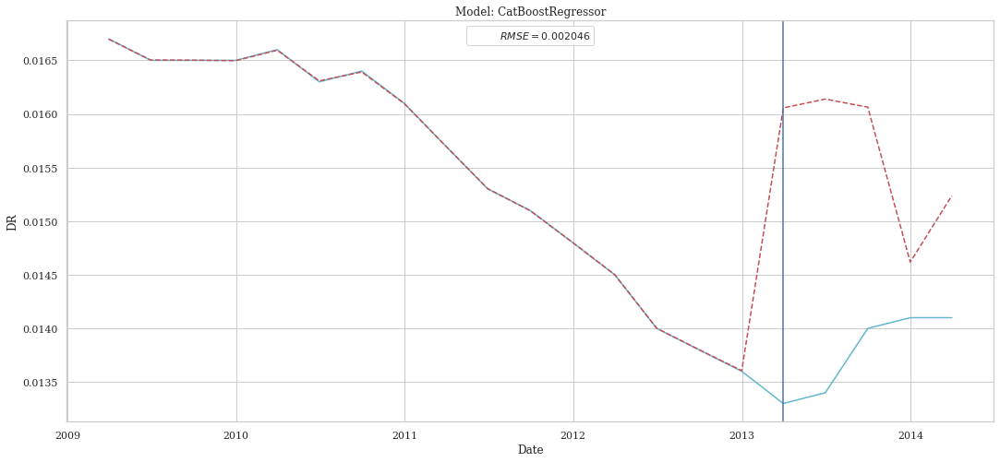

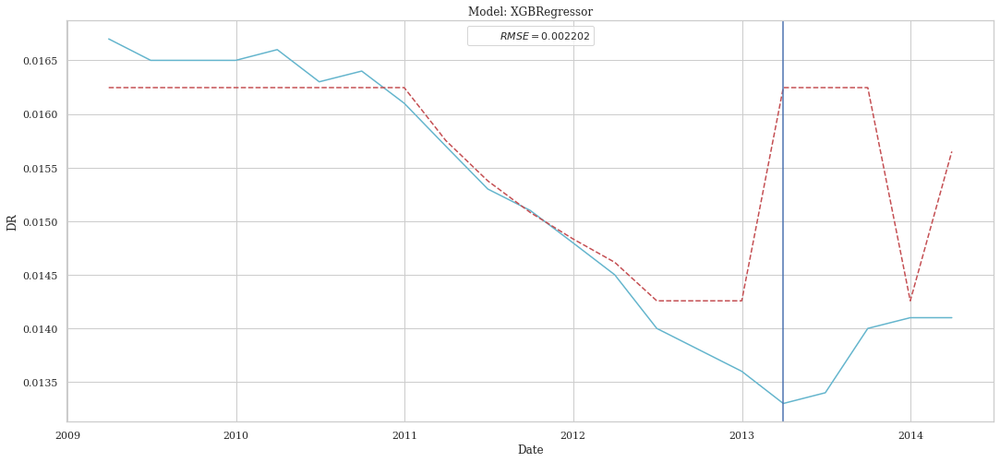

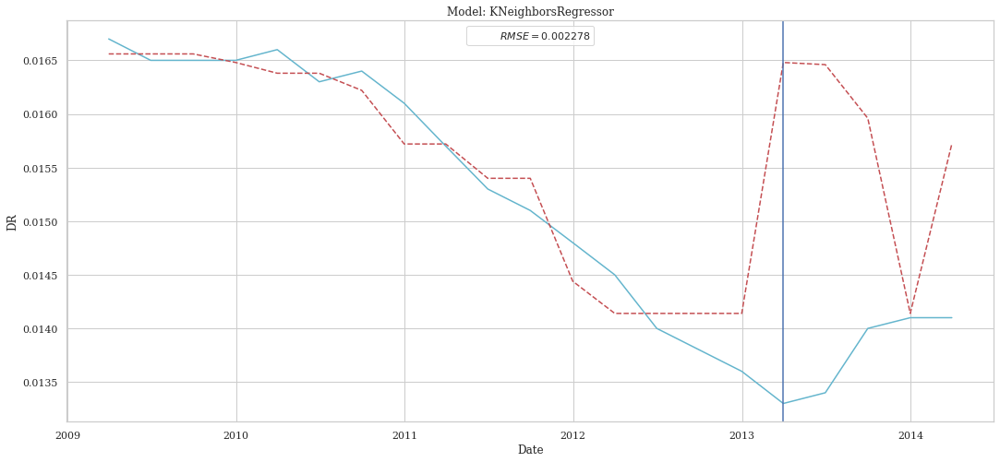

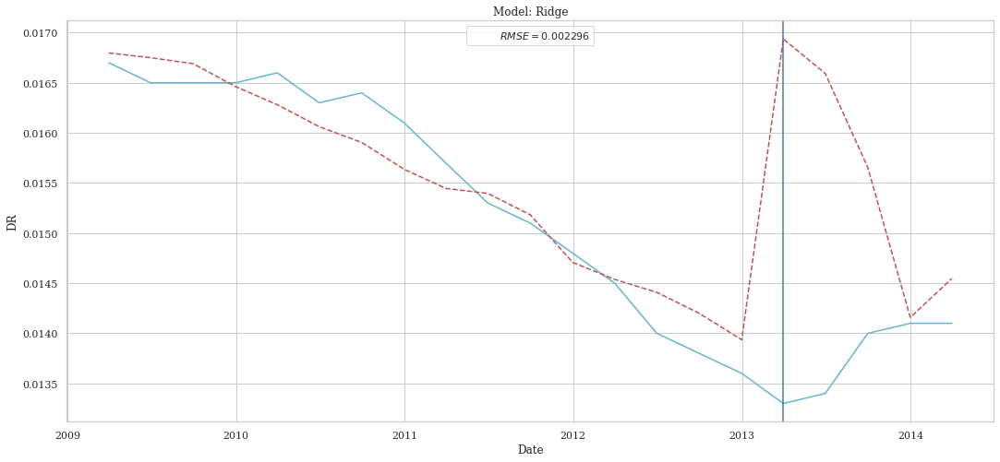

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


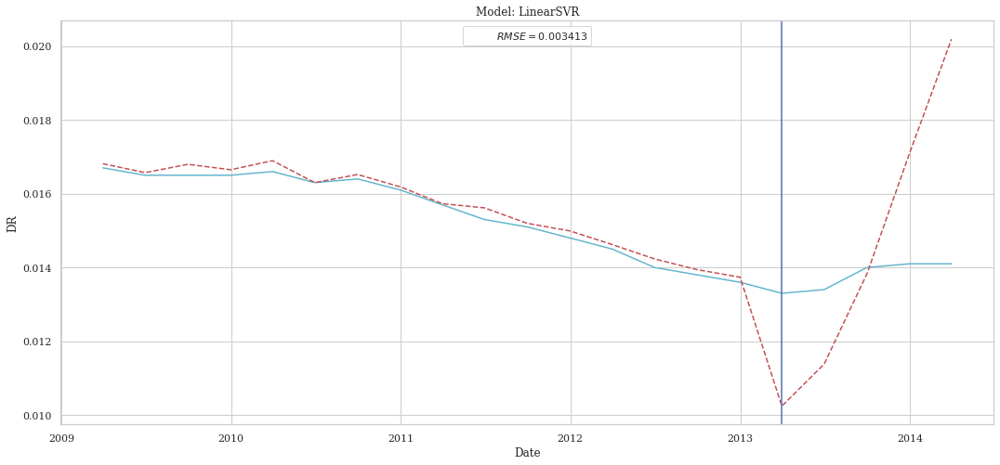

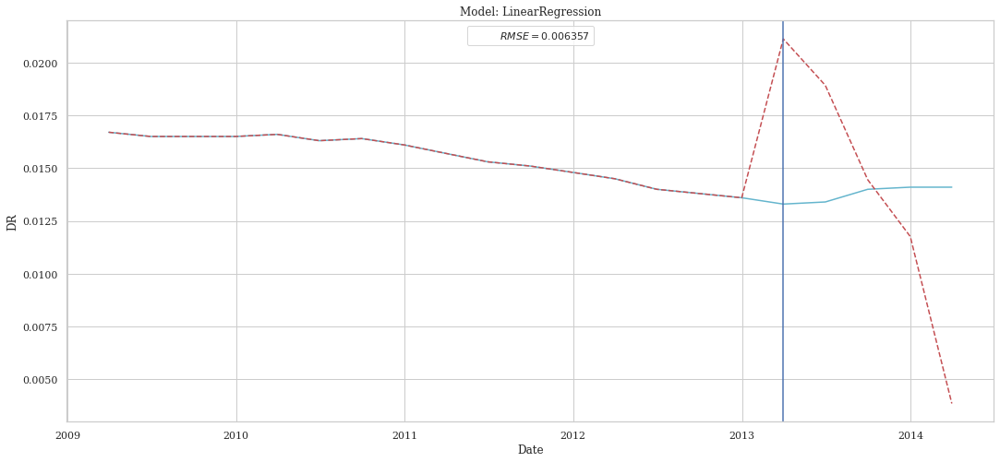

In [121]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Low Variance Features

In [122]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_totale_low_var,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.001724,0.000003,0.001293,-22.666816
XGBRegressor,0.002021,0.000004,0.001722,-31.509340
CatBoostRegressor,0.002038,0.000004,0.001936,-32.080071
Ridge,0.002185,0.000005,0.002023,-37.022674
DecisionTreeRegressor,0.002242,0.000005,0.001840,-39.031847
KNeighborsRegressor,0.002321,0.000005,0.002036,-41.896178
LinearRegression,0.002534,0.000006,0.002002,-50.117372


/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


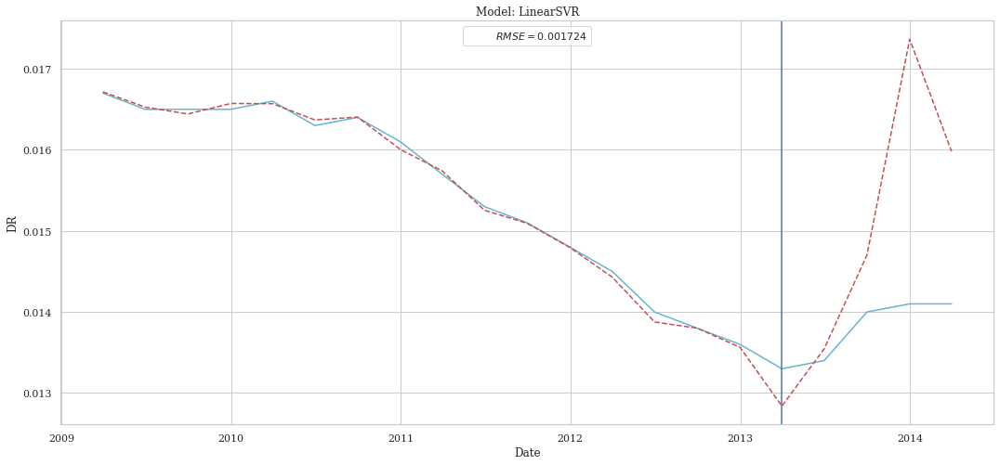

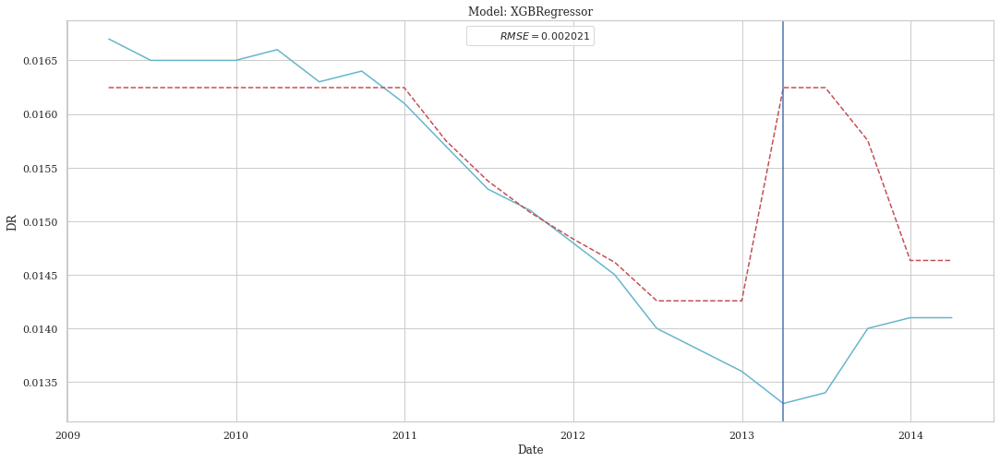

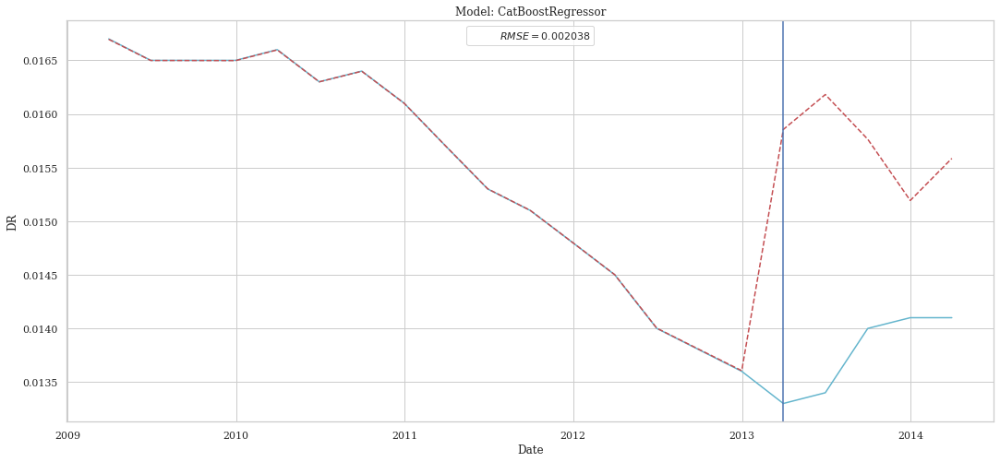

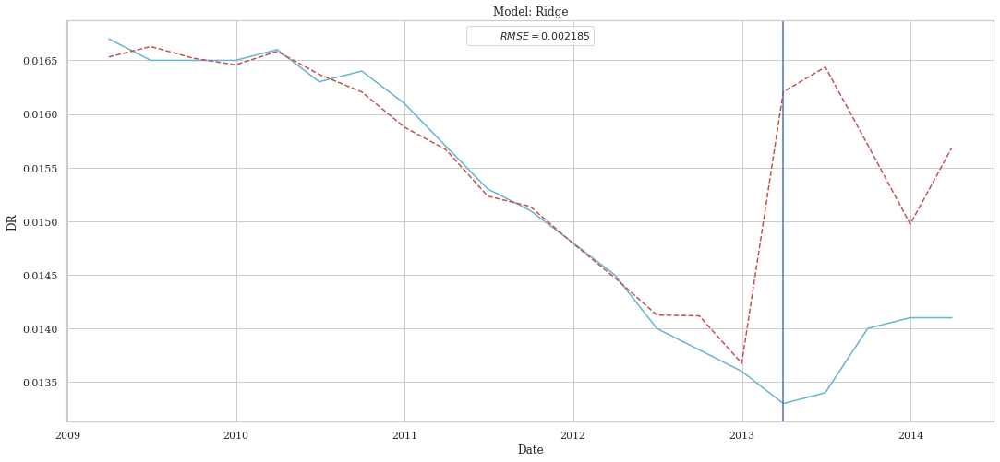

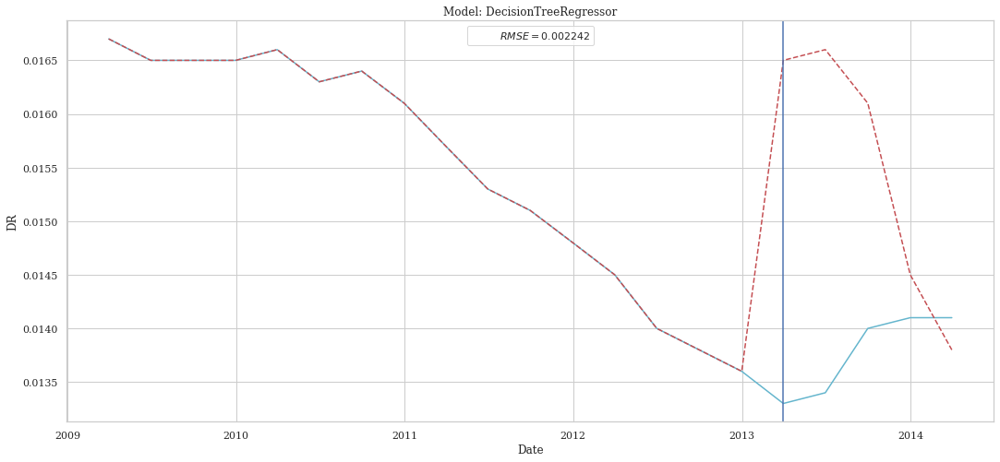

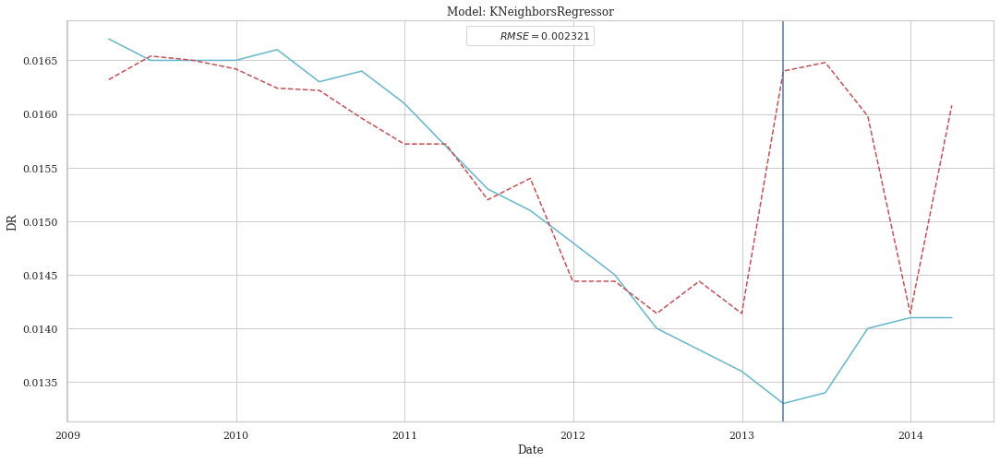

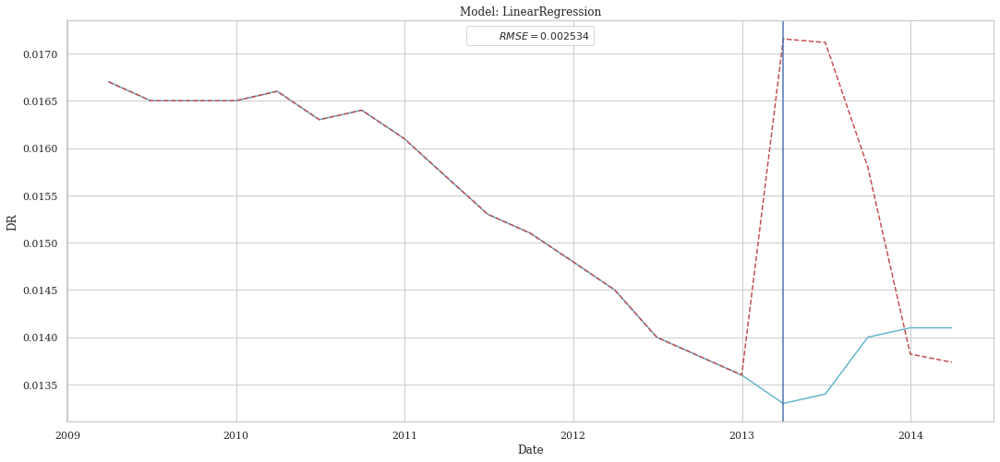

In [123]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### KBest Features

In [124]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_totale_kbest,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.001506,0.000002,0.001496,-17.046145
Ridge,0.001938,0.000004,0.001835,-28.910837
CatBoostRegressor,0.002032,0.000004,0.001914,-31.878886
LinearSVR,0.002043,0.000004,0.001821,-32.227811
KNeighborsRegressor,0.002266,0.000005,0.002016,-39.877707
DecisionTreeRegressor,0.002424,0.000006,0.002320,-45.783439
LinearRegression,0.003855,0.000015,0.003482,-117.298134


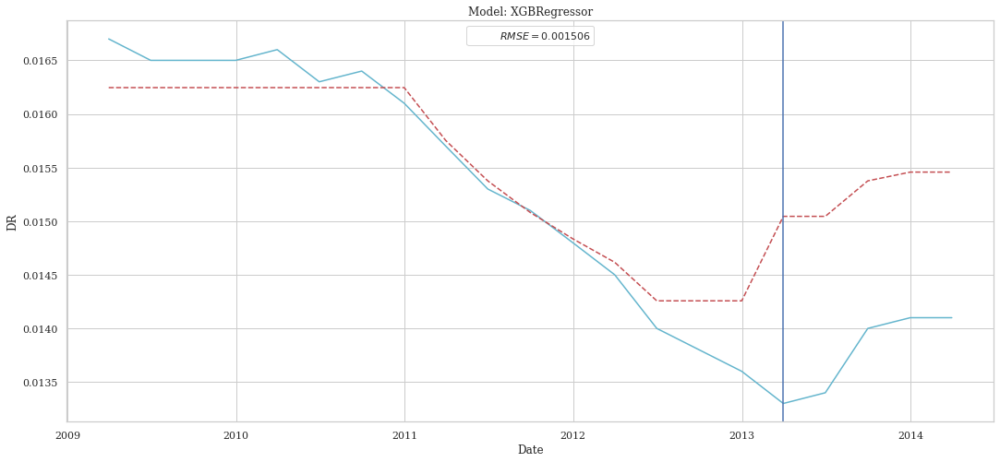

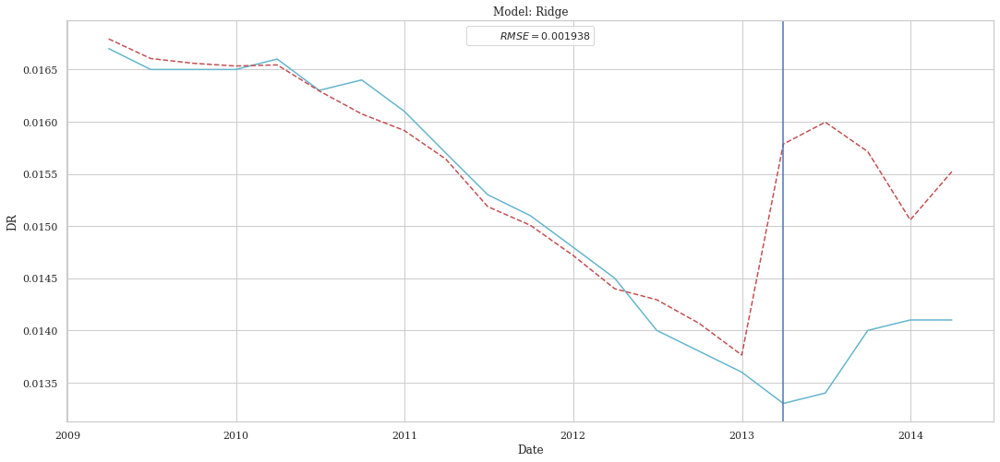

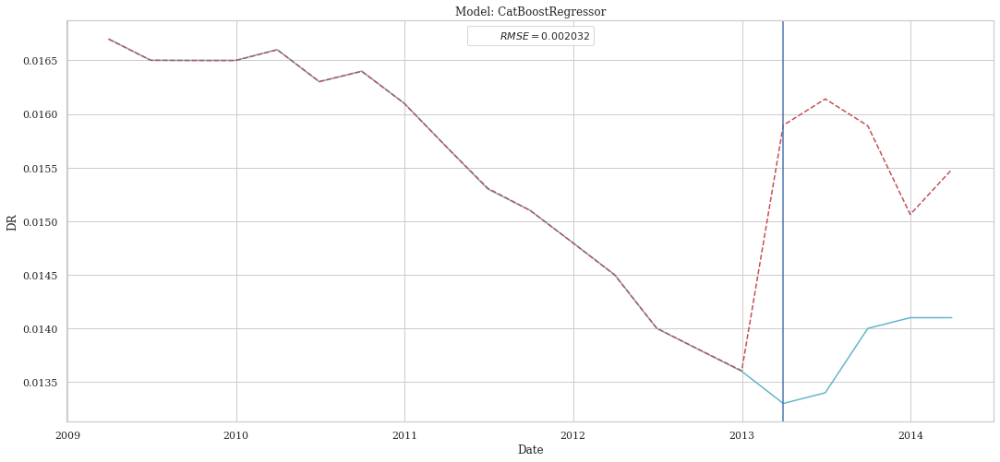

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


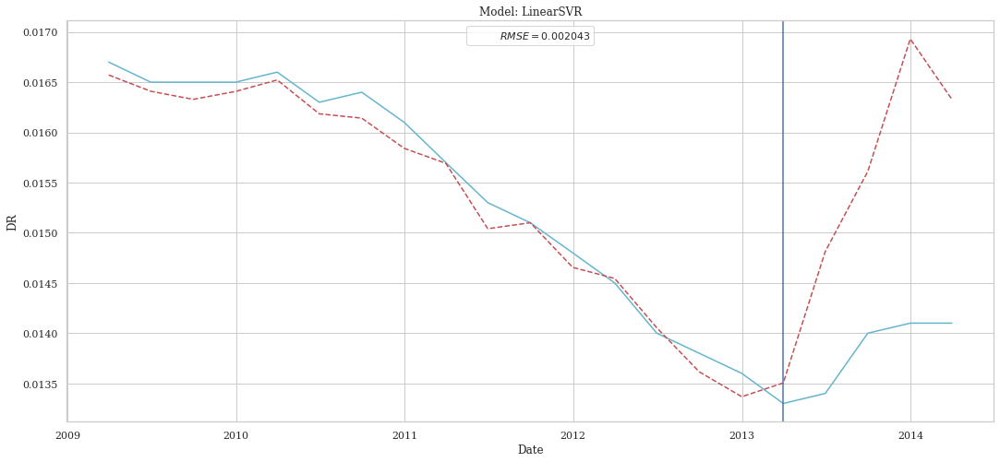

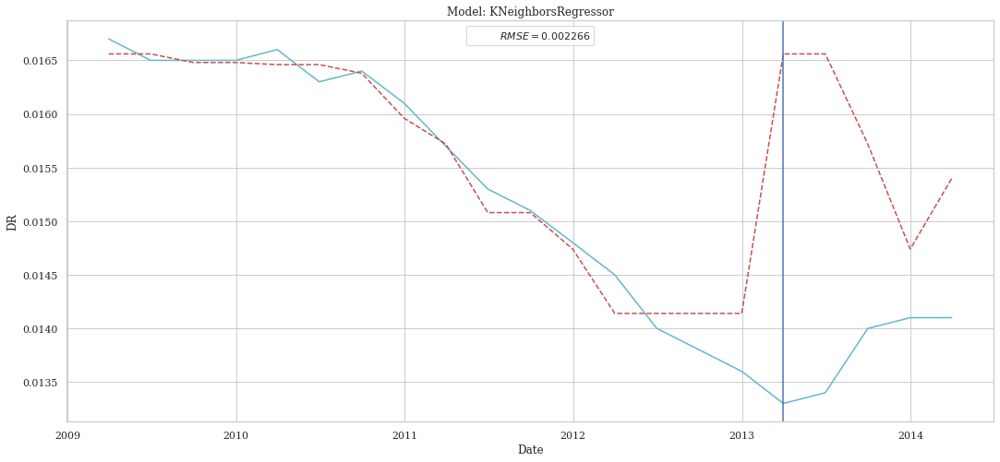

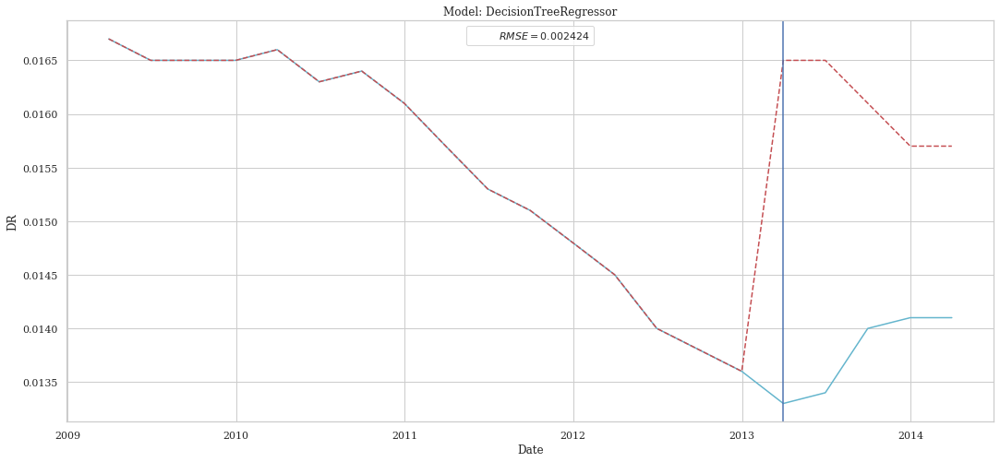

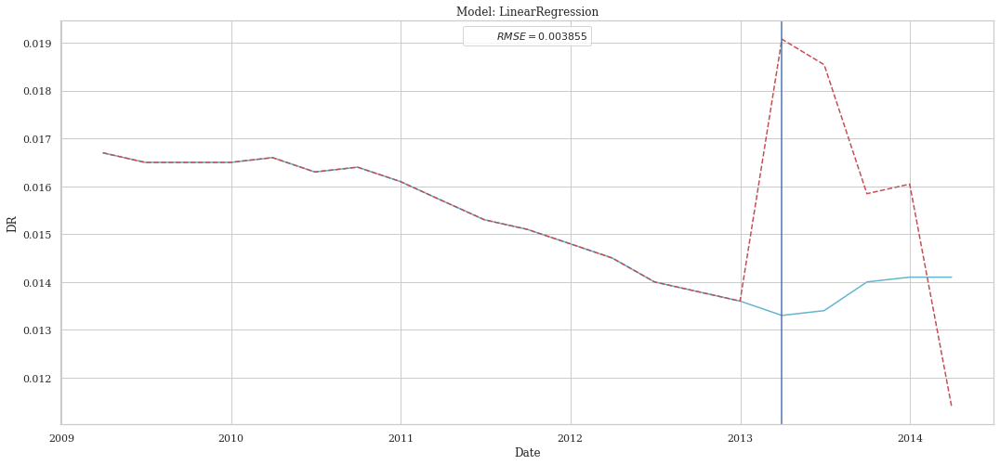

In [125]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Recursive Features

In [126]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_totale_recur,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

,rmse,mse,mae,r2
Index,,,,
LinearRegression,0.001659,0.000003,0.001587,-20.911016
Ridge,0.001780,0.000003,0.001663,-24.234258
CatBoostRegressor,0.001936,0.000004,0.001880,-28.845275
XGBRegressor,0.002021,0.000004,0.001722,-31.509340
KNeighborsRegressor,0.002226,0.000005,0.001932,-38.446497
DecisionTreeRegressor,0.002265,0.000005,0.001960,-39.828025
LinearSVR,0.004041,0.000016,0.003777,-128.985710


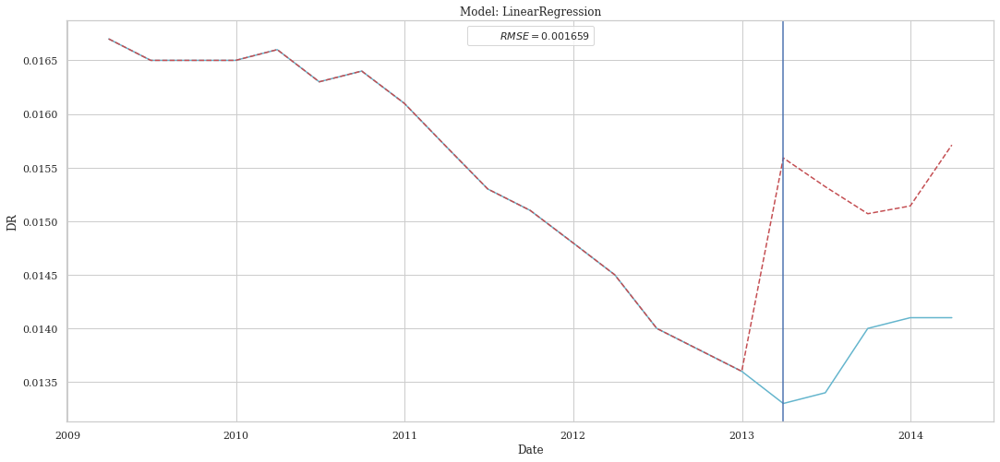

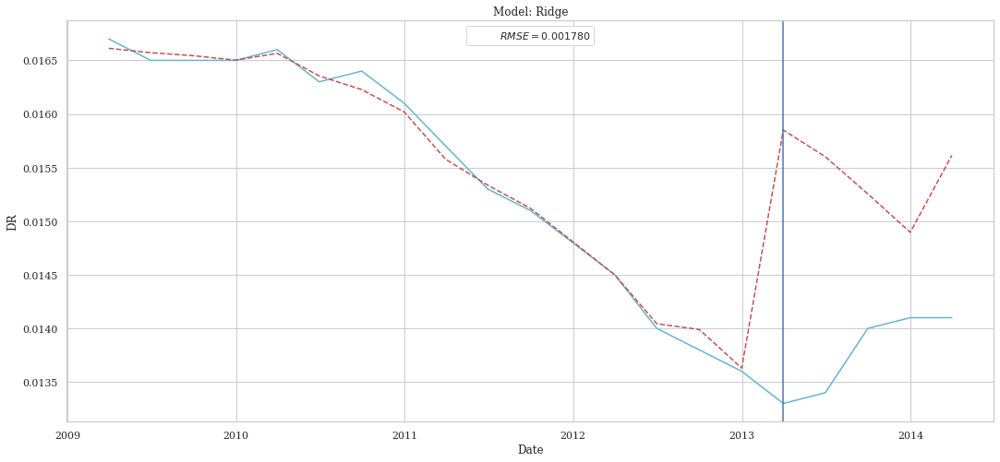

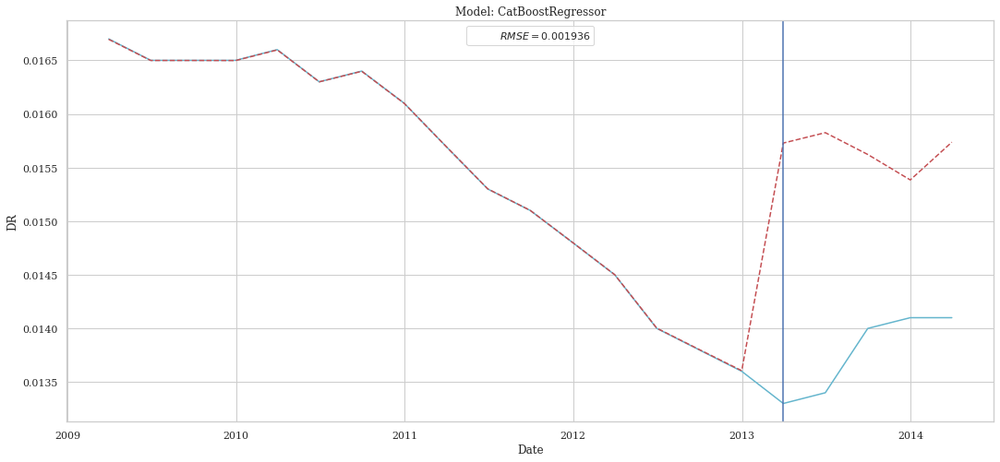

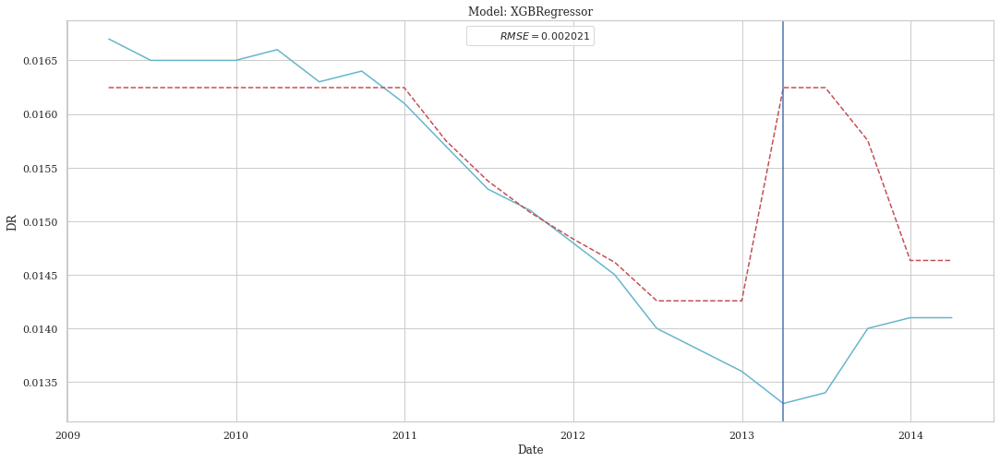

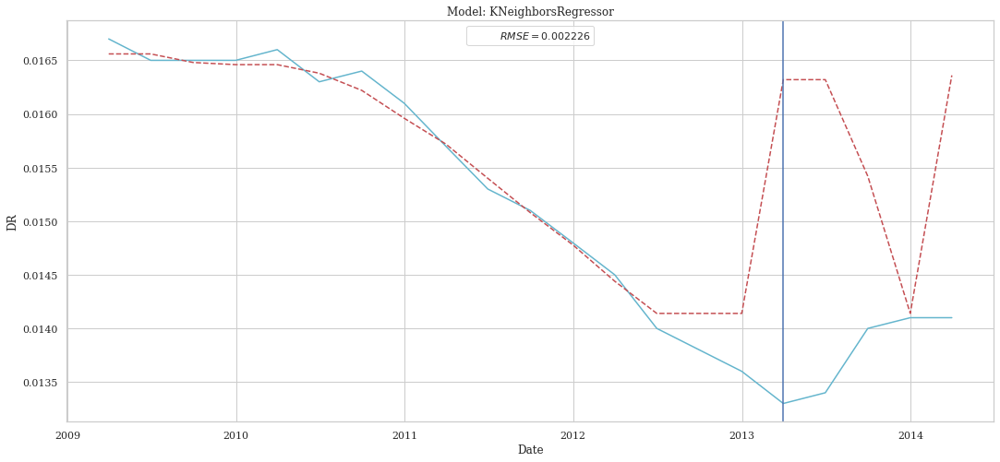

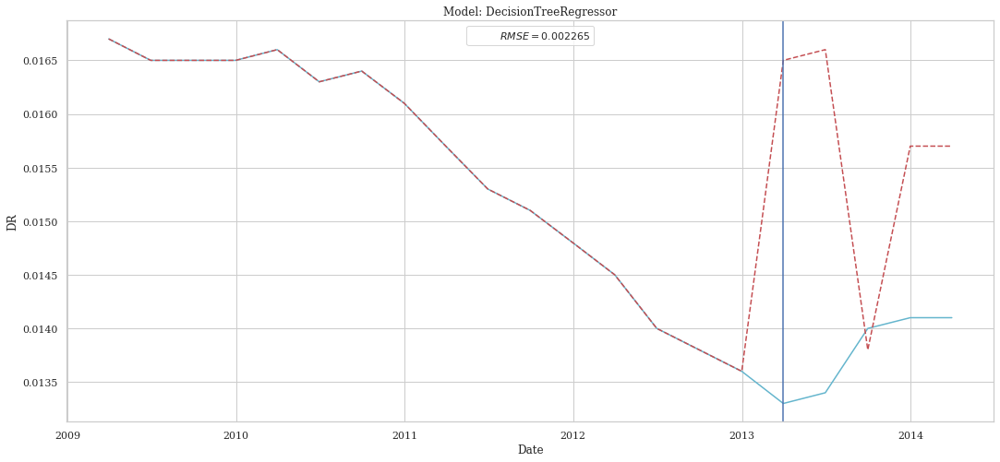

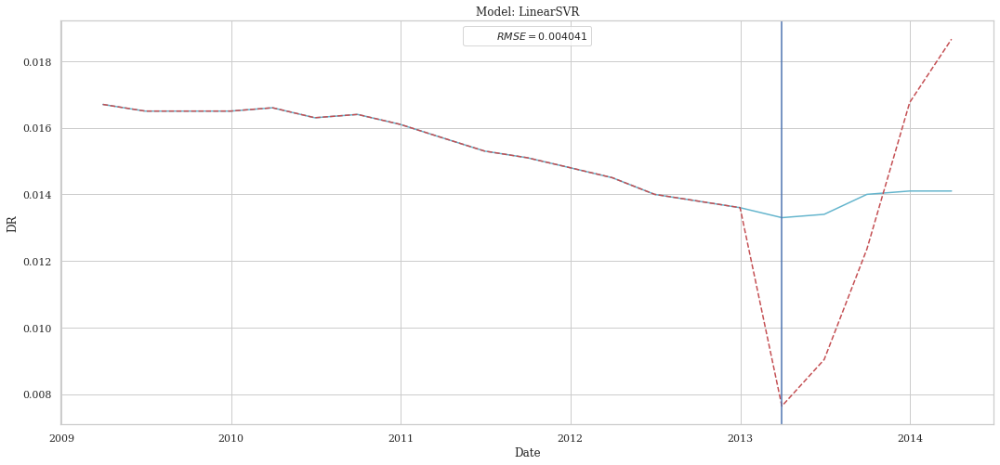

In [127]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### SelectFromModel Features

In [128]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_totale_sfm,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
LinearRegression,0.000919,8.445268e-07,0.000797,-5.723940
LinearSVR,0.001184,1.400795e-06,0.001101,-10.152823
CatBoostRegressor,0.001974,3.897402e-06,0.001873,-30.030273
XGBRegressor,0.002221,4.932954e-06,0.002187,-38.275108
Ridge,0.002236,4.999663e-06,0.002038,-38.806232
KNeighborsRegressor,0.002261,5.114080e-06,0.001992,-39.717197
DecisionTreeRegressor,0.002757,7.600000e-06,0.002720,-59.509554


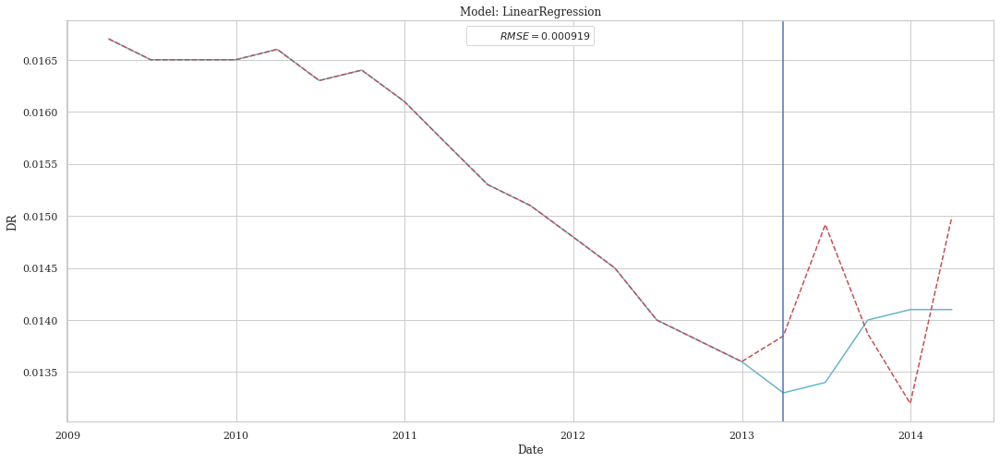

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


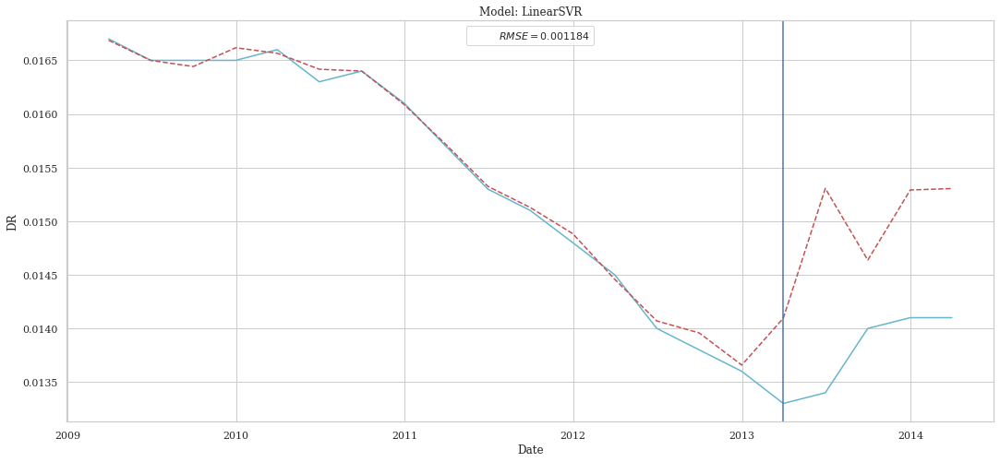

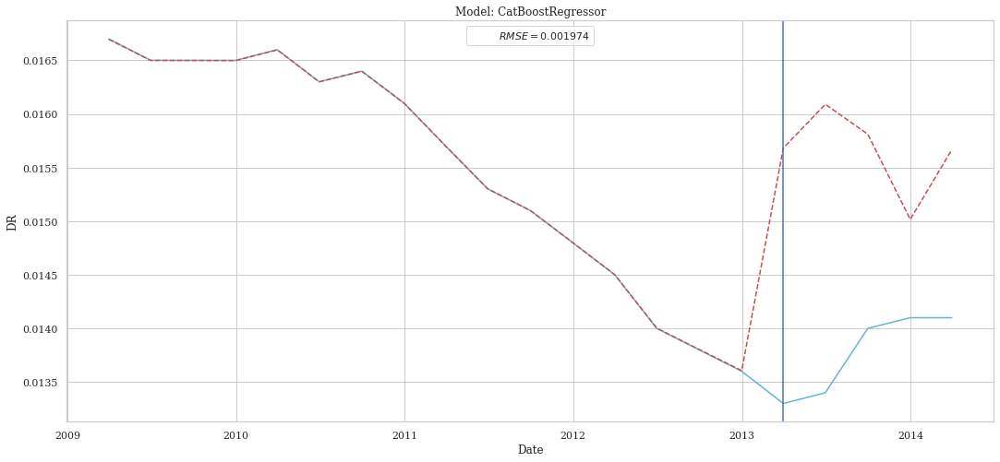

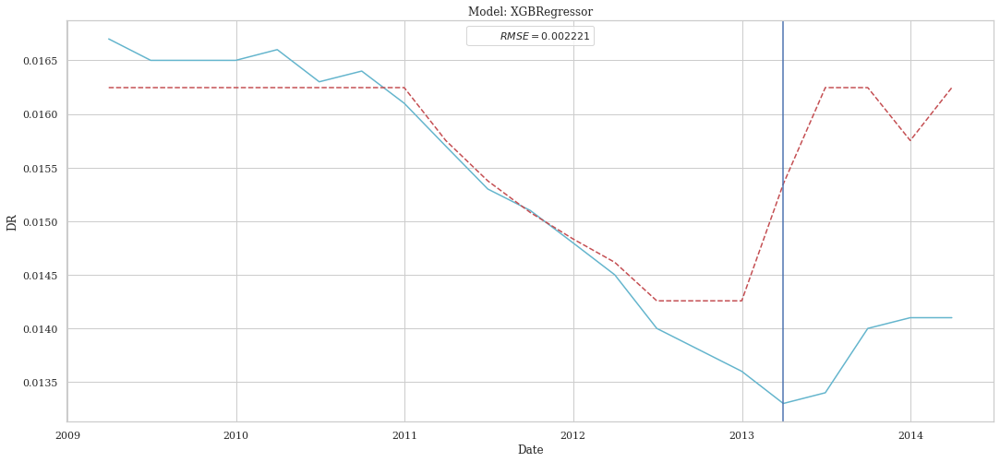

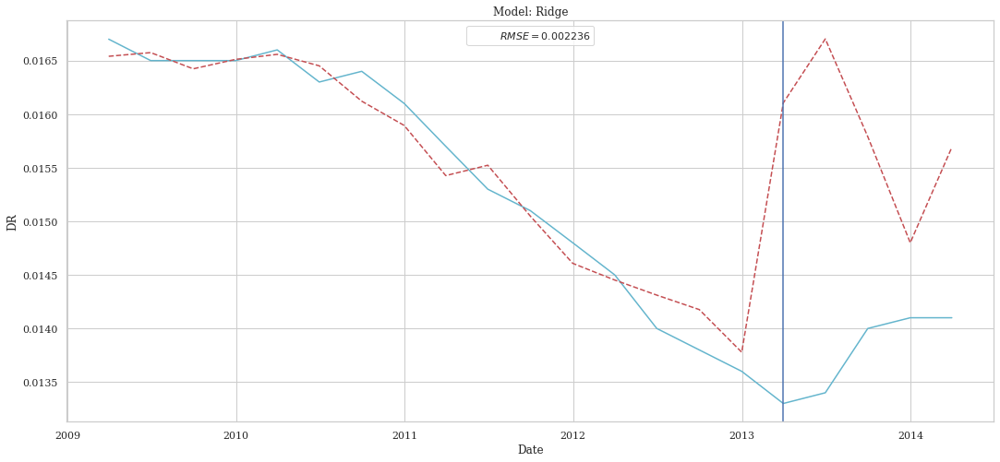

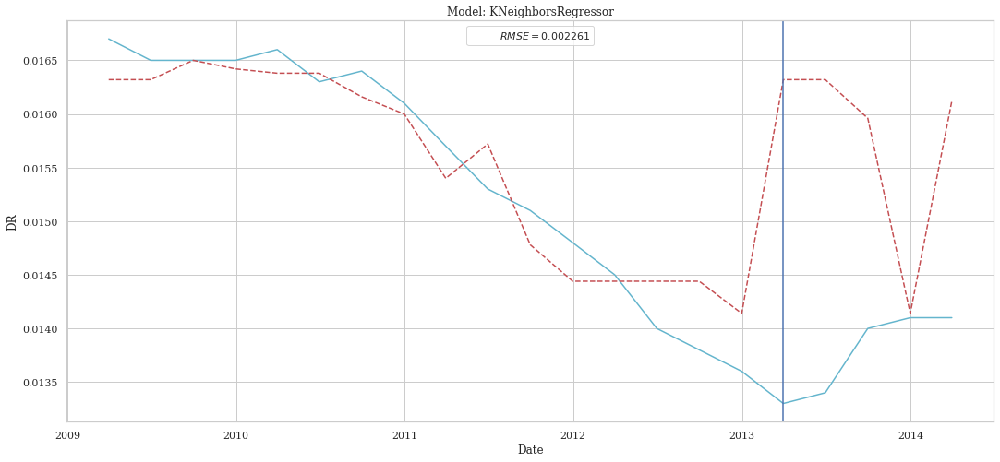

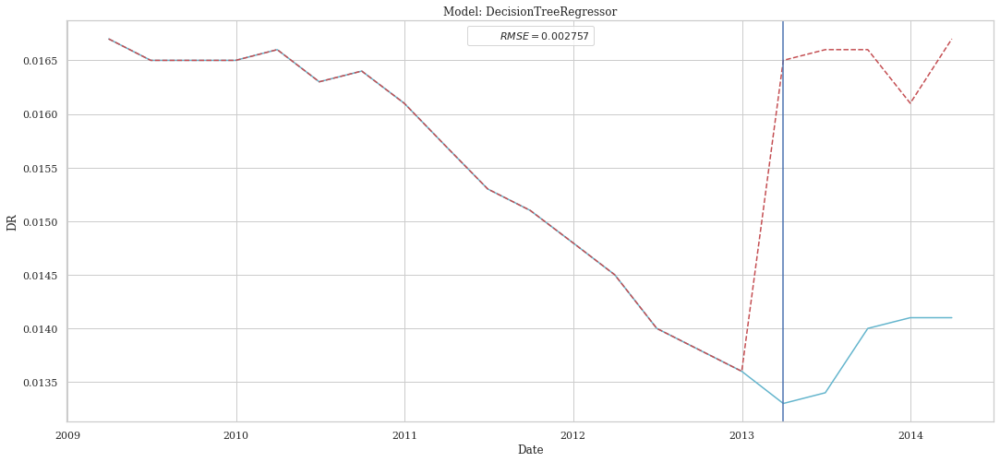

In [129]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Tree-Based Features

In [130]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_totale_tree,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
XGBRegressor,0.001506,0.000002,0.001496,-17.046145
LinearSVR,0.001825,0.000003,0.001643,-25.527246
CatBoostRegressor,0.001911,0.000004,0.001842,-28.070586
Ridge,0.001942,0.000004,0.001868,-29.018684
KNeighborsRegressor,0.002094,0.000004,0.001928,-33.907006
DecisionTreeRegressor,0.002145,0.000005,0.001720,-35.624204
LinearRegression,0.004645,0.000022,0.003511,-170.797898


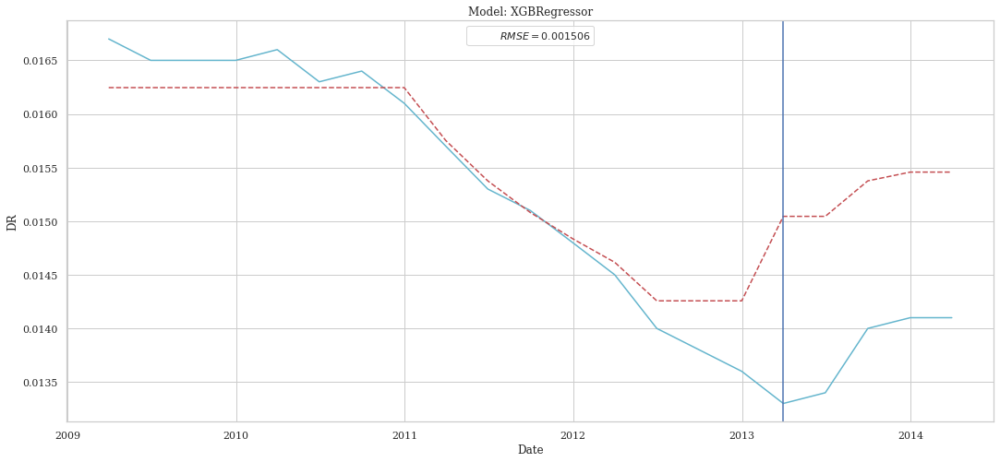

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


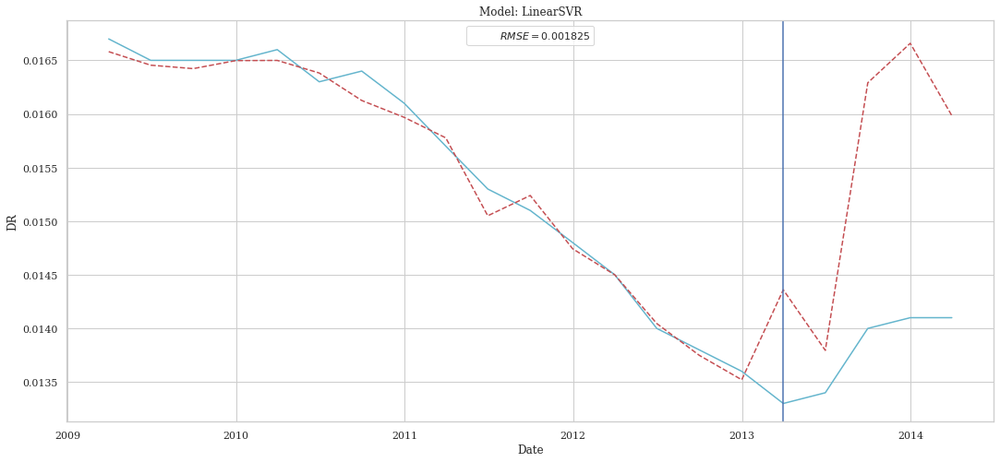

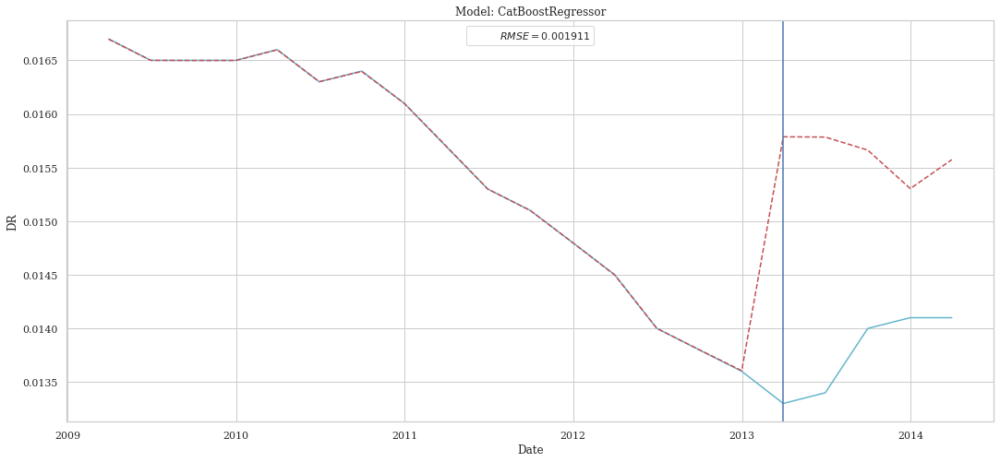

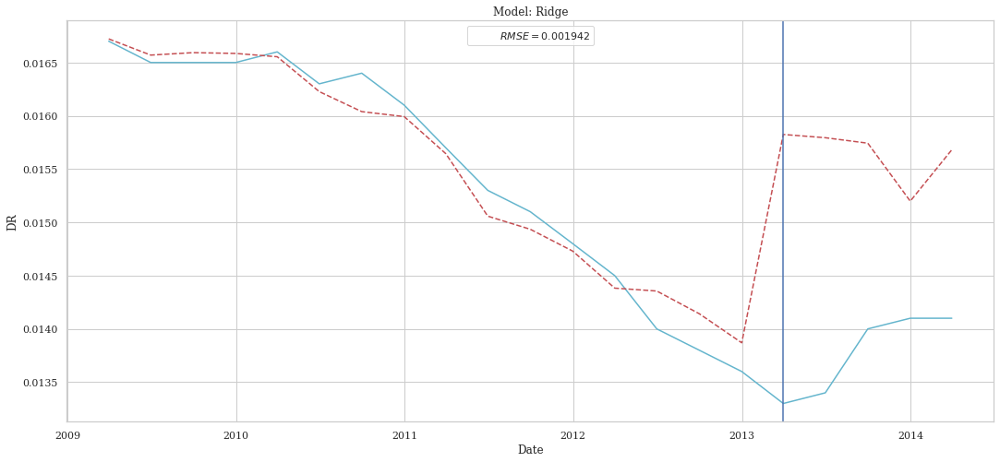

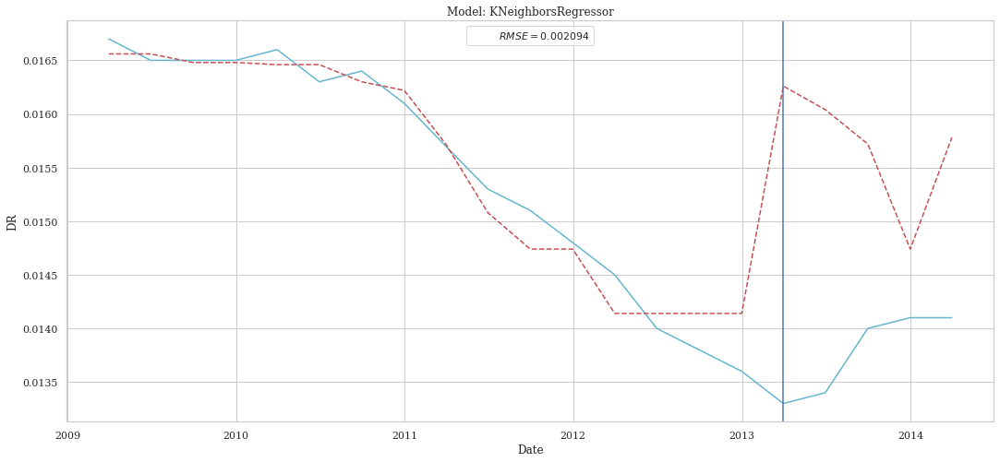

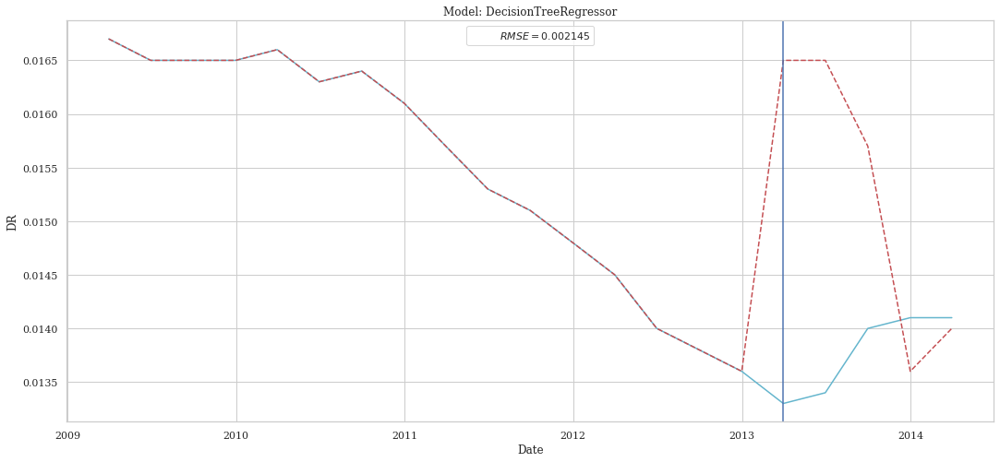

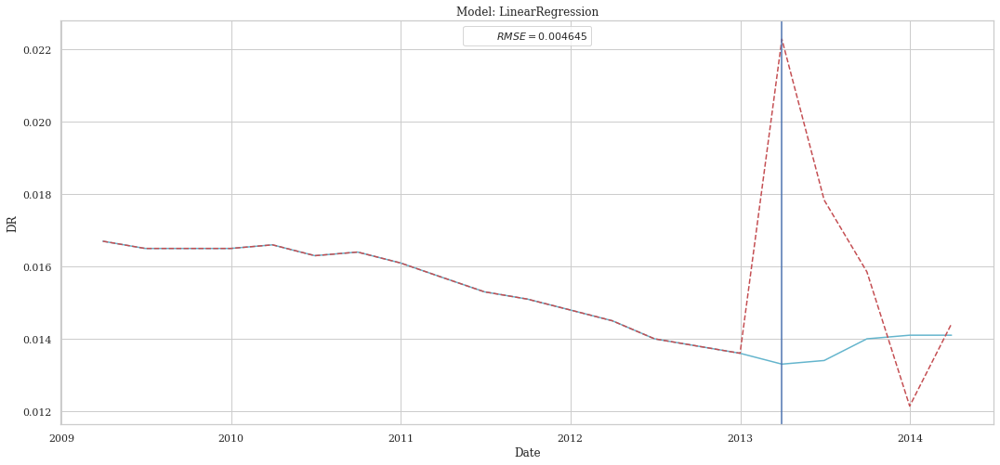

In [131]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Forward Features

In [132]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_totale_seq_for,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.001543,0.000002,0.001492,-17.968056
CatBoostRegressor,0.001958,0.000004,0.001782,-29.513124
XGBRegressor,0.001995,0.000004,0.001572,-30.681082
Ridge,0.002075,0.000004,0.001724,-33.269513
KNeighborsRegressor,0.002262,0.000005,0.001924,-39.738217
DecisionTreeRegressor,0.002341,0.000005,0.001980,-42.614650
LinearRegression,0.002738,0.000007,0.002174,-58.705296


/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


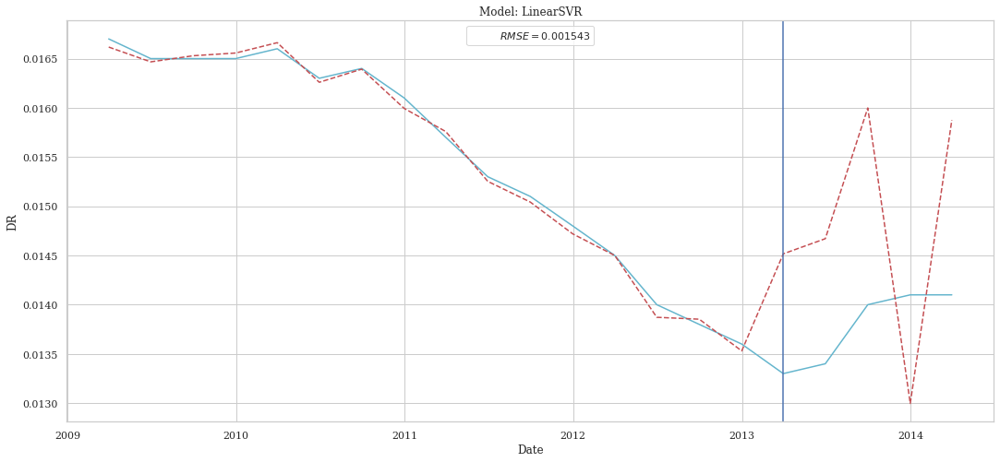

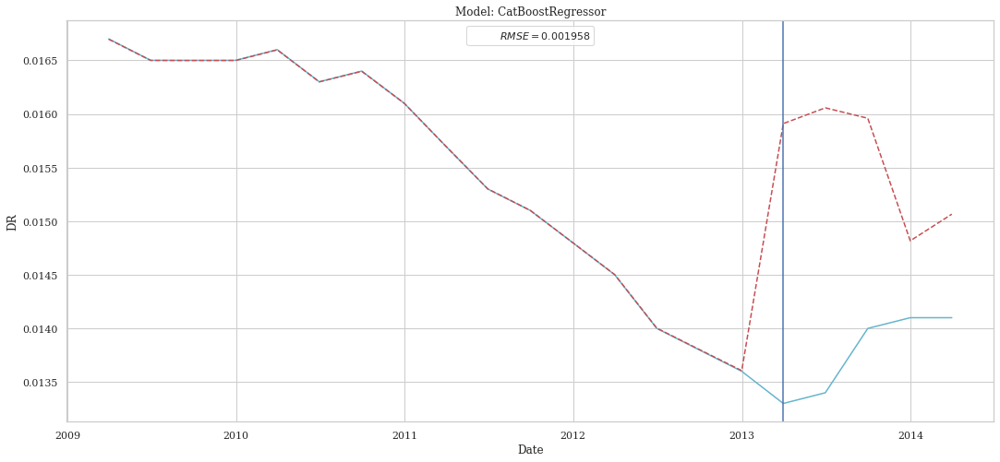

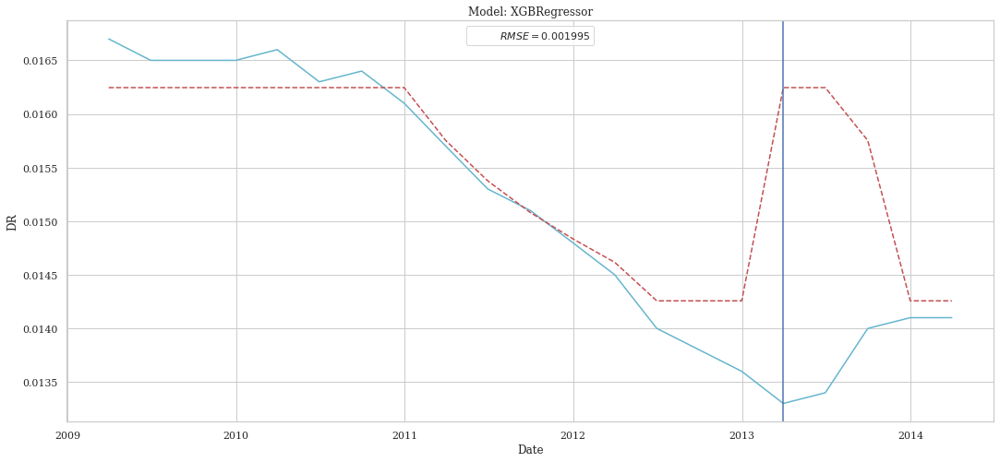

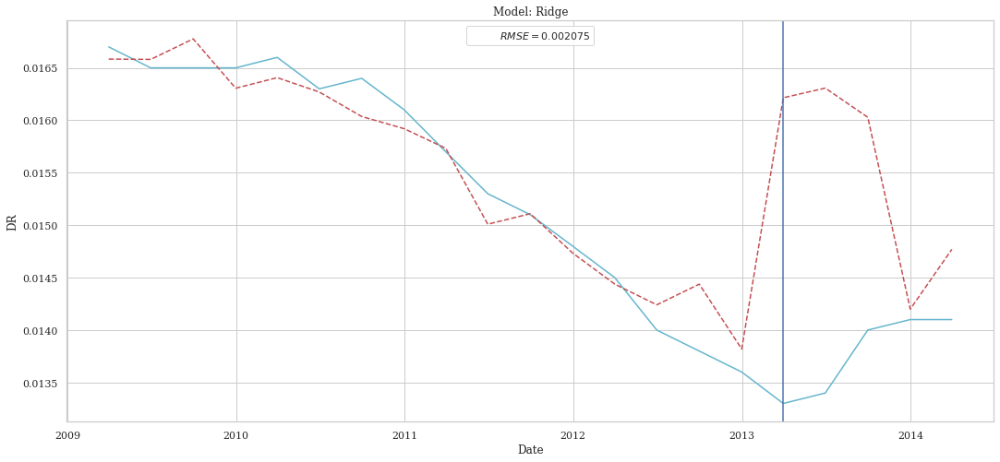

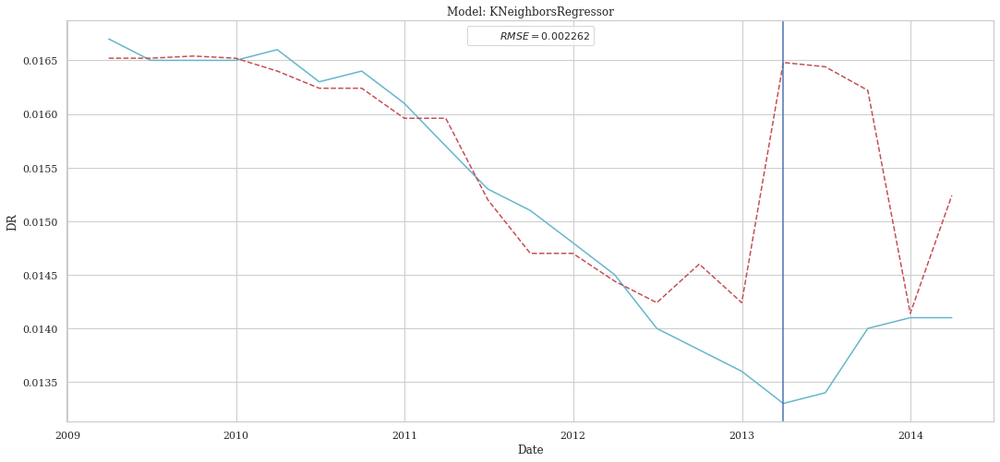

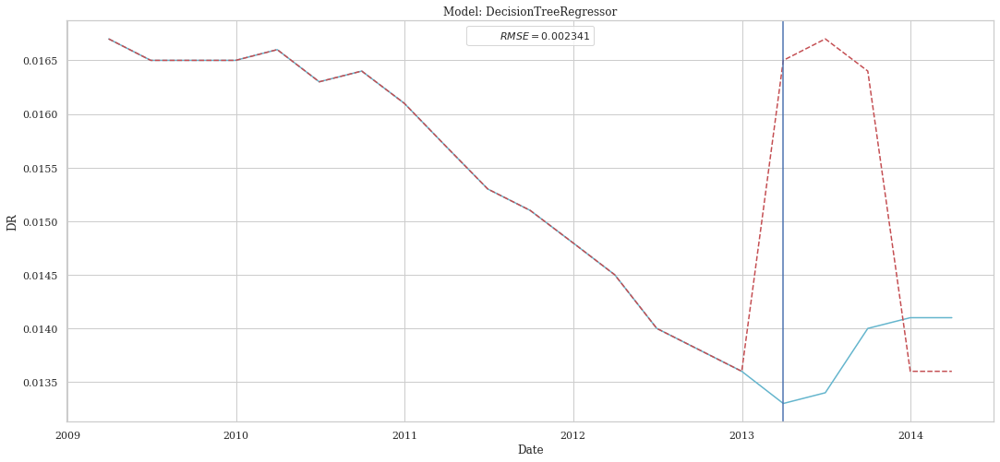

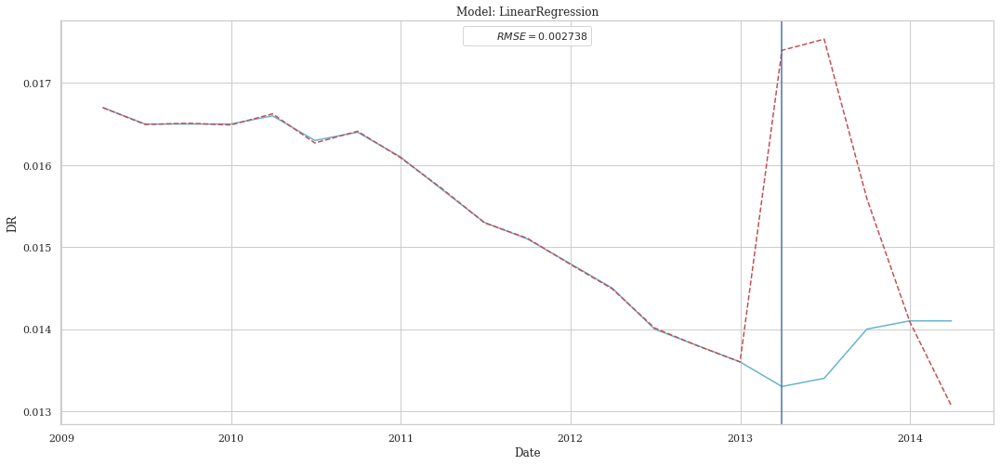

In [133]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

### Sequential Backward Features

In [134]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_totale_seq_bac,split=split,norm=norm)
summary = summary_ml(X_train,y_train,X_test,y_test)
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.001081,0.000001,0.001046,-8.306790
XGBRegressor,0.001993,0.000004,0.001738,-30.610752
CatBoostRegressor,0.002056,0.000004,0.001938,-32.641622
Ridge,0.002092,0.000004,0.001946,-33.833288
KNeighborsRegressor,0.002251,0.000005,0.002048,-39.359236
DecisionTreeRegressor,0.002447,0.000006,0.002400,-46.675159
LinearRegression,0.002724,0.000007,0.002278,-58.061423


/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


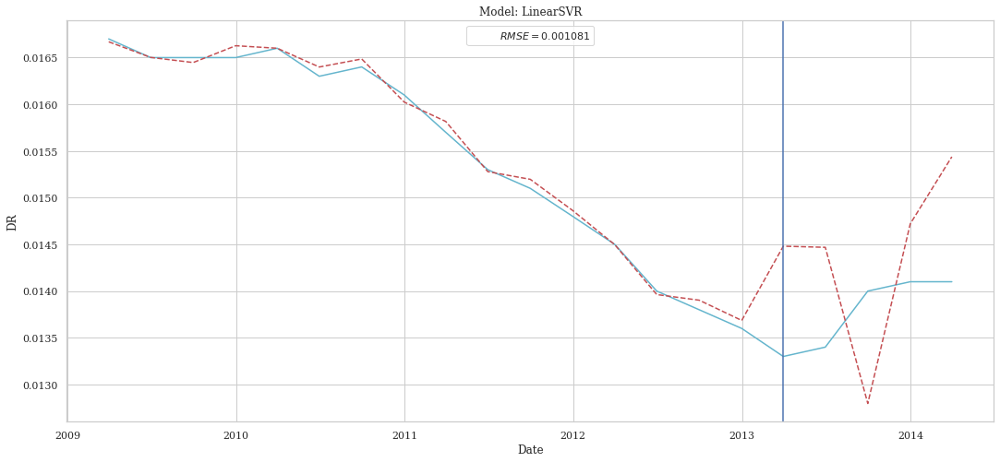

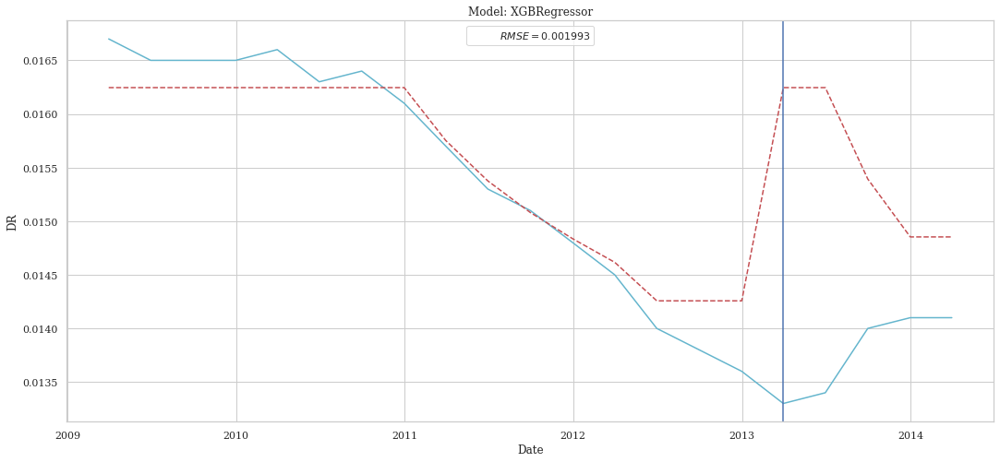

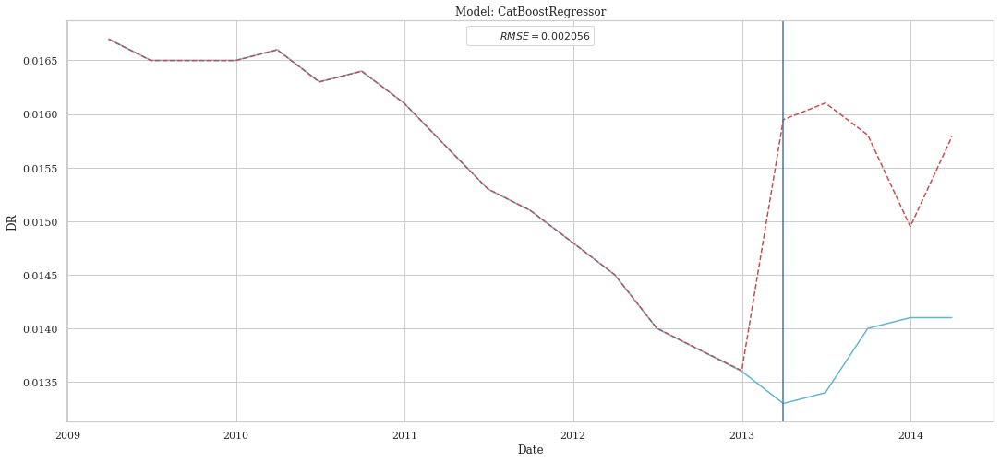

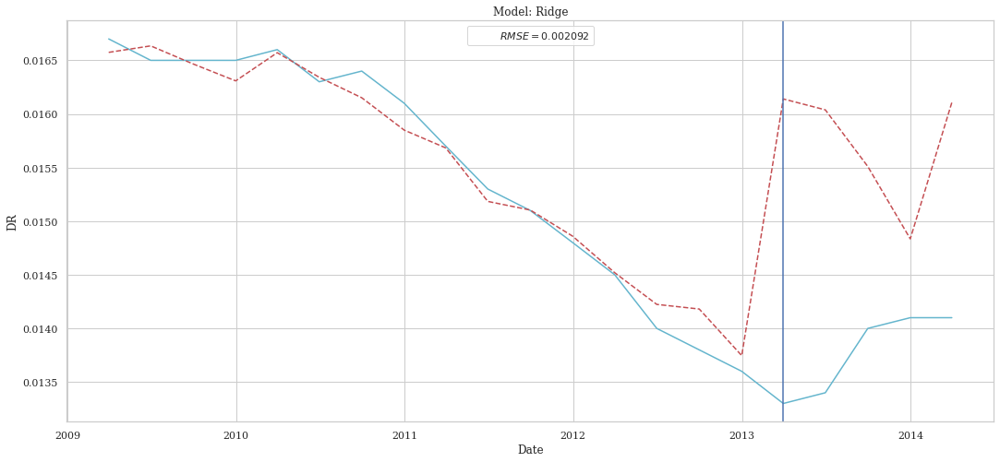

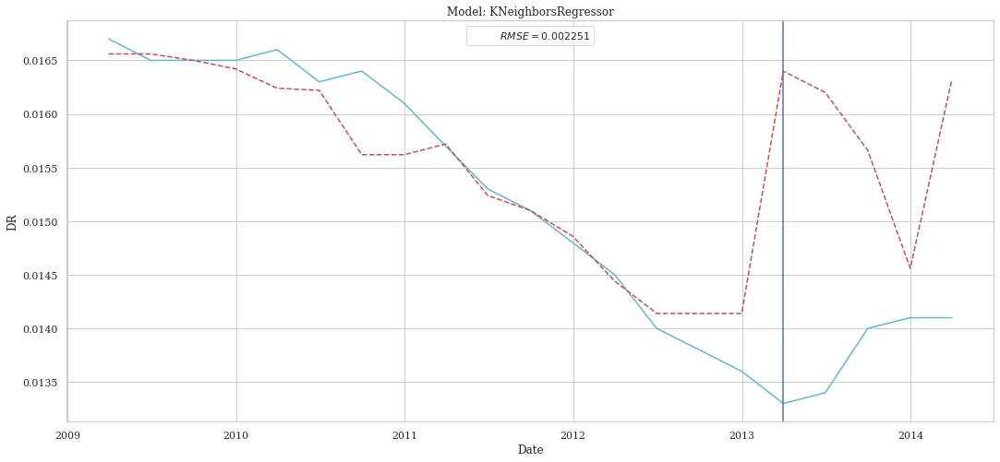

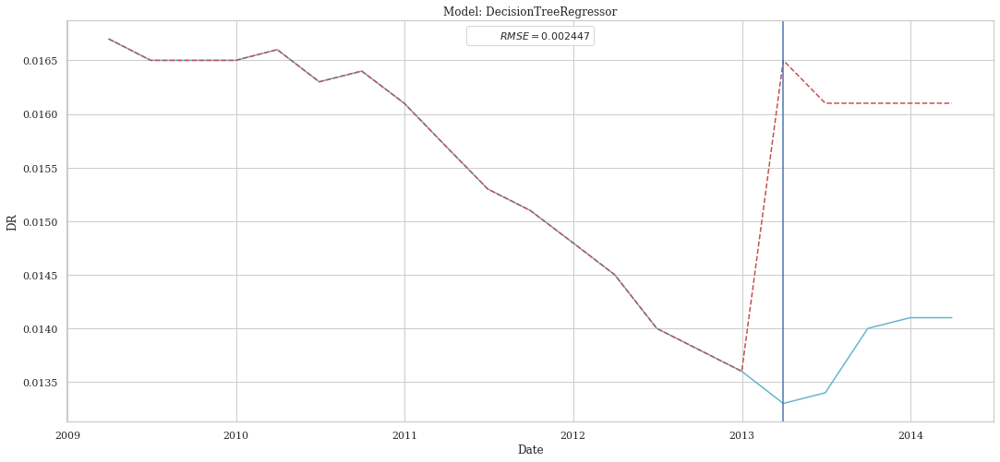

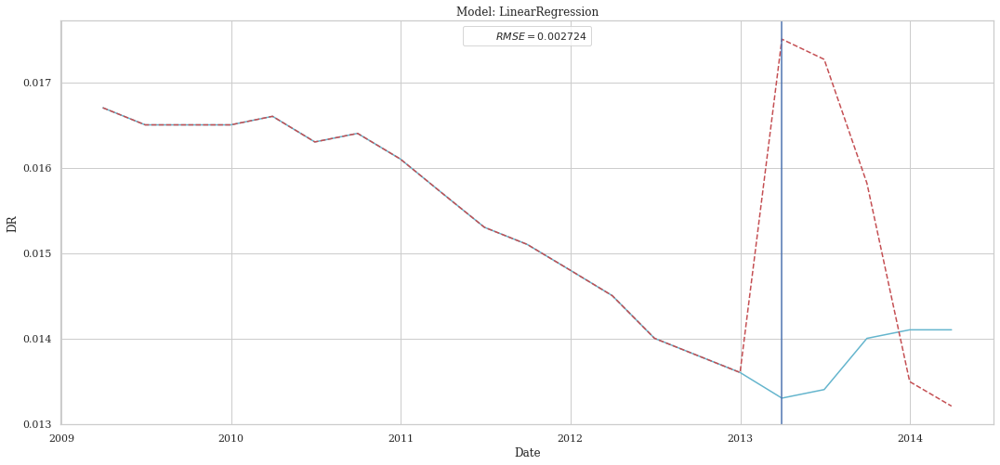

In [135]:
for i in range(summary.shape[0]):
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[i],df_score=summary)

## First Conclusion
The SelectFromModel features and Recursive Features seems to give the most promising results. We will use the Knn, LinearSVR, and DecisionTree in order to design our solution.

### GridSearch on KNeighborsRegressor

In [136]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_totale_sfm,split=split,norm=norm)
params_knr = {"n_neighbors":[1,2,3,4,5,6,7,8,9,10],"weights":["uniform"],"algorithm":["auto","ball_tree","kd_tree","brute"],"p":[1,2],"leaf_size":[1,2,3,4,5,10,20,30,40,50]}
params,score = params_grid(X_train,y_train,X_test,y_test,"knn",params_knr,metric="mse")
print(params,score)

Fitting 2 folds for each of 800 candidates, totalling 1600 fits


/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:683: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 674, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 199, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true,
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 236, in _score
    y_pred = method_caller(estimator, "predict", X)
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_scorer.py", line 53, in _cached_call
    return getattr(estimator, method)(*args, **kwargs)
  File "/Users/simonev

{'algorithm': 'auto', 'leaf_size': 1, 'n_neighbors': 1, 'p': 1, 'weights': 'uniform'} 6.080000000000001e-06


In [137]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["knn"],parameters={"p_knn":params})
summary

,rmse,mse,mae,r2
Index,,,,
KNeighborsRegressor,0.002466,0.000006,0.00224,-47.407643


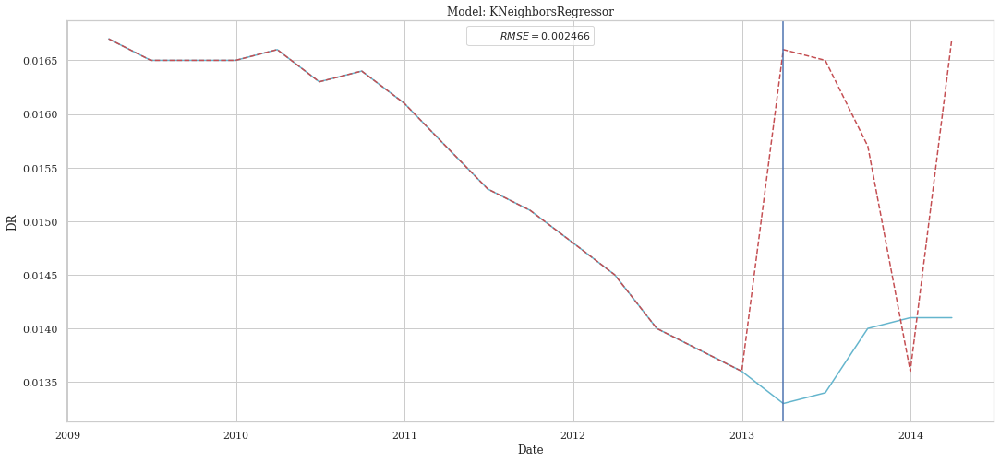

In [138]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_knn":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_knn":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[0],df_score=summary)

### GridSearch on LinearSVR

In [139]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_totale_sfm,split=split,norm=norm)
params_svr = {"epsilon":[0,0.1,0.2],"C":[1,0.7,0.3,0.1],"loss":["epsilon_insensitive","squared_epsilon_insensitive"],"intercept_scaling":[1,5,10,15]}
params,score = params_grid(X_train,y_train,X_test,y_test,"svr",params_svr,metric="mse")
print(params,score)

Fitting 2 folds for each of 96 candidates, totalling 192 fits


/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.p

{'C': 0.3, 'epsilon': 0, 'intercept_scaling': 10, 'loss': 'epsilon_insensitive'} 6.148518520501204e-06


/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.p

In [140]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["svr"],parameters={"p_svr":params})
summary

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


,rmse,mse,mae,r2
Index,,,,
LinearSVR,0.002269,0.000005,0.002037,-39.986146


/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


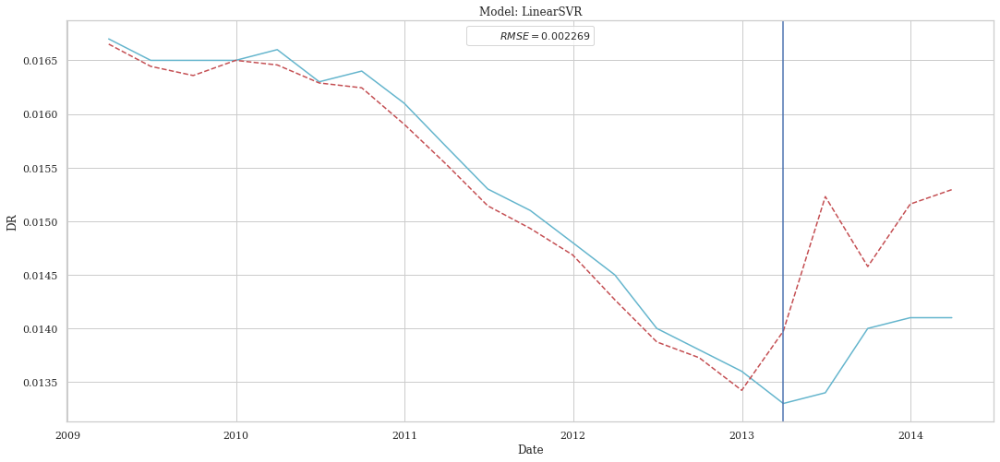

In [141]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_knn":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_knn":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[0],df_score=summary)

### GridSearch on DecisionTree

In [142]:
X_train, X_test, y_train, y_test,X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_totale_recur,split=split,norm=norm)
params_tre = {"criterion":["squared_error","friedman_mse","absolute_error","poisson"],"splitter":["best"],"max_features":["auto","sqrt","log2"]}
params,score = params_grid(X_train,y_train,X_test,y_test,"tre",parameters=params_tre,metric='mse')
print(params,score)

/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/tree/_classes.py", line 1247, in fit
    super().fit(
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/tree/_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'squared_error'

  warnings.warn("Estimator fit failed. The score on this train-test"
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit fai

Fitting 2 folds for each of 12 candidates, totalling 24 fits
{'criterion': 'friedman_mse', 'max_features': 'sqrt', 'splitter': 'best'} 2.017999999999998e-06


/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/tree/_classes.py", line 1247, in fit
    super().fit(
  File "/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/tree/_classes.py", line 350, in fit
    criterion = CRITERIA_REG[self.criterion](self.n_outputs_,
KeyError: 'absolute_error'

  warnings.warn("Estimator fit failed. The score on this train-test"
/Users/simonevanno/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit fa

In [143]:
summary = summary_ml(X_train,y_train,X_test,y_test,models=["tre"],parameters={"p_tre":params})
summary

,rmse,mse,mae,r2
Index,,,,
DecisionTreeRegressor,0.001421,0.000002,0.00106,-15.066879


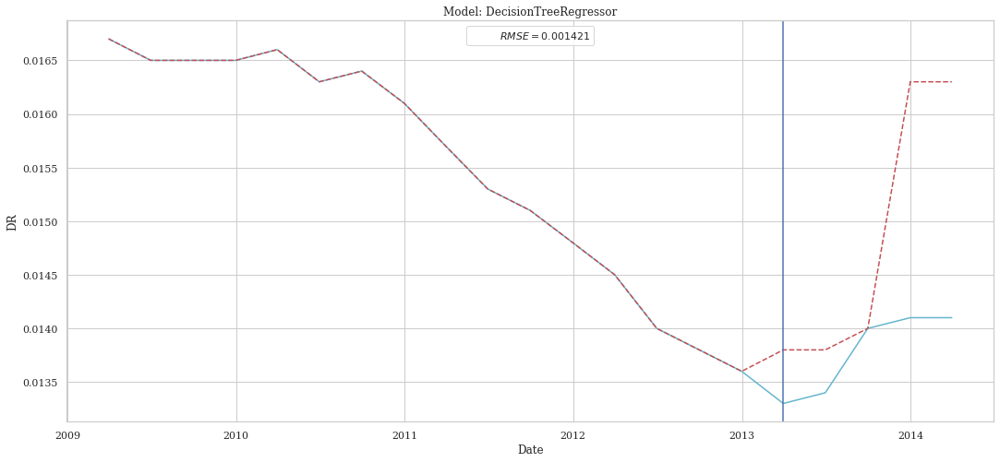

In [144]:
y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[0],parameters={"p_tre":params})
y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[0],parameters={"p_tre":params})
plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,index,name_model=summary.index[0],df_score=summary)

## Final Conclusion
Grid Search is relevant for the DecisionTree model but not for the others. With the Grid we obtain a r2 equals to -12.57 against 15.38 before GridSearch. Concerning the rmse is now 0.001517 against 0.001667.

# CHR2 - CONCLUSION

In [16]:
chronique=b'CHR2'
start = 1
period = 36
norm = "MinMax"
split = 0.2

In [17]:
X_train, X_test, y_train, y_test, X_validation = clean_data(data,start,period=period,chronique=chronique,col_used=cl.col_2_low_var,split=split,norm=norm)
index = pd.concat([X_train, X_test, X_validation], axis=1).index
summary = summary_ml(X_train,y_train,X_test,y_test,models=['rid'])
summary

,rmse,mse,mae,r2
Index,,,,
Ridge,0.000254,6.454331e-08,0.000223,-1.180517


In [19]:
for i in range(summary.shape[0]): 
  y_train_pred = y_pred(X_train,y_train,X_train,y_train,model=summary.index[i])
  y_test_pred = y_pred(X_train,y_train,X_test,y_test,model=summary.index[i])
  y_validation = y_pred(X_train,y_train,X_validation,y_test=False,model='rid',parameters={})
  plot_pred_detail(y_train,y_test,y_train_pred,y_test_pred,y_validation=y_validation,index=index,name_model=summary.index[i],df_score=summary)

TypeError: plot_pred_detail() got an unexpected keyword argument 'y_validation'